In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from coffea import util
from coffea.processor import accumulate
import os
import re
import pandas as pd
import hist
import matplotlib as mpl
import mplhep
import sys

sys.path.append("../../analysisTools/")
import plotTools as ptools
import utils
import warnings
warnings.filterwarnings('ignore')

See here: https://cms-analysis.docs.cern.ch/guidelines/plotting/colors/ for plot styling suggestions from PubComm

## Import coffea files -- signal and background

In [2]:
prefix = './coffea/skimmed/'
#suffix = 'ABCD_SRplane_goodvtx_v11_ABCDscan'
suffix = 'ABCD_SR_goodvtx_v11_0p98'

In [3]:
# Signal
sig_histo = util.load(f'{prefix}/signal_{suffix}.coffea')[0]

In [4]:
# Background
bkg_histo = util.load(f'{prefix}/bkg_{suffix}.coffea')[0]

In [5]:
# Data
#data_histo = util.load(f'{prefix}/data_{suffix}.coffea')[0]

In [ ]:
sig_histo

In [ ]:
#data_histo.keys()

In [ ]:
m1 = 5; delta = 0.1; ctau = 100

Saved: ./plots/Collinear//20_0.1_1.png


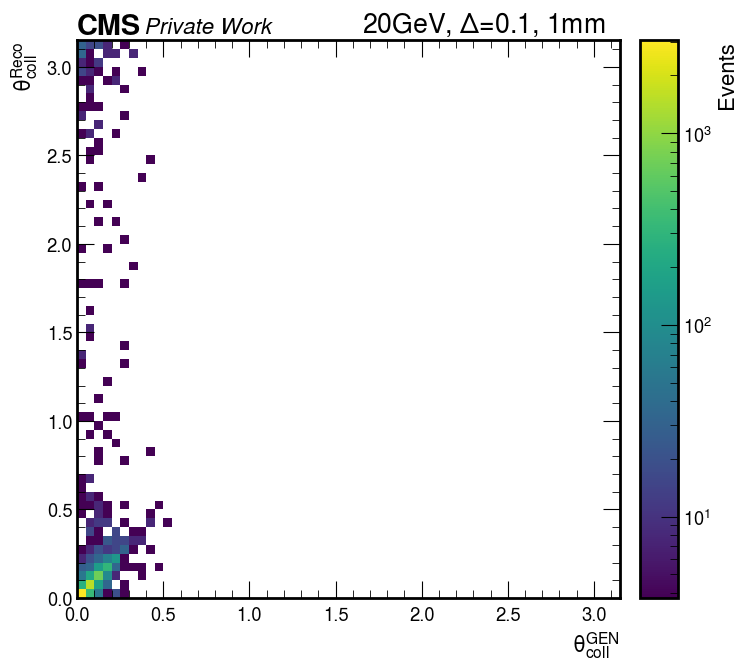

In [18]:
# Plot settings
#fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'sel_vtx_GenThetaColl_rad_vs_sel_vtx_ThetaColl_fromPV_refit_rad'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 5j,
    'yrebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': r"$\theta^{GEN}_{coll}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': r"$\theta^{Reco}_{coll}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/Collinear/',
    'outName': f'{m1}_{delta}_{ctau}.png'
}

# Data
#ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))


m1 = 20
delta = 0.1
ctau = 1

style_2d_dict['outName'] = f'{m1}_{delta}_{ctau}.png'

plt.title(rf"{m1}GeV, $\Delta$={delta}, {ctau}mm", position=(0.75, 0.5))
ptools.plot_signal_2D(sig_histo, m1, delta, ctau, plot_dict, style_2d_dict)


Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png


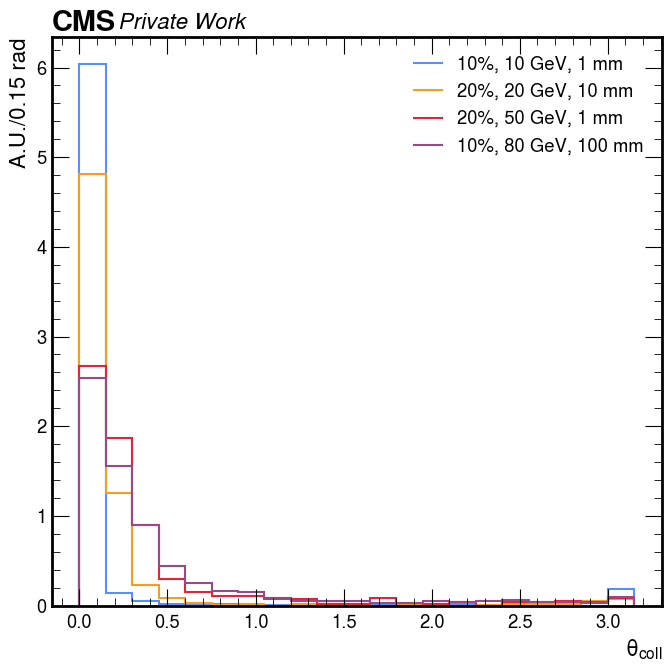

In [31]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

plot_dict = {
    'variable': 'sel_vtx_ThetaColl_fromPV_refit_rad',
    'cut': 'cut10',
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 15j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'xlabel': r"$\theta_{coll}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'A.U./0.15 rad',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'flow': None,     # overflow
    'doYerr': False,
    'doDensity': True,
    'doSave': True,
    'outDir': './plots/Collinear/',
    'label': None,
    'outName': f'signal.png'
}

# plot bkg
#ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

# Plot signal
#m1 = 5; delta = 0.1; ctau = 1
#ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 10; delta = 0.1; ctau = 1
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 20; delta = 0.2; ctau = 10
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 50; delta = 0.2; ctau = 1
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 80; delta = 0.1; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png
Saved: ./plots/Collinear//signal.png


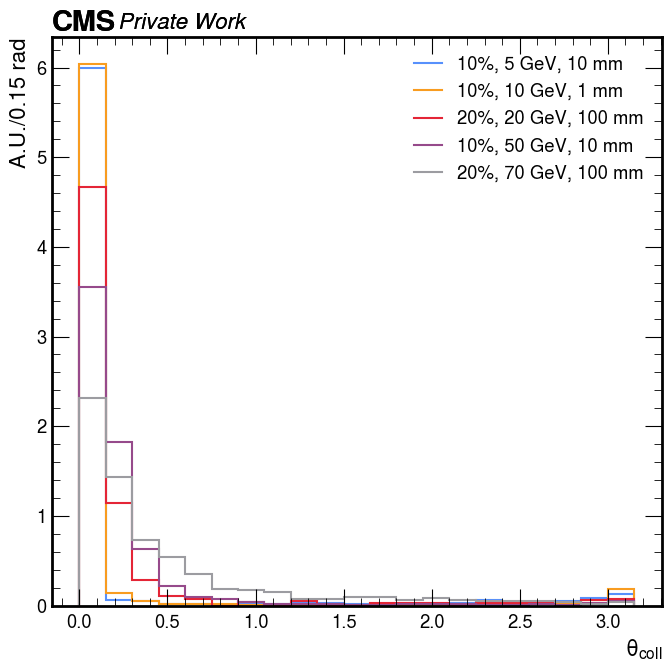

In [32]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

plot_dict = {
    'variable': 'sel_vtx_ThetaColl_fromPV_refit_rad',
    'cut': 'cut10',
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 15j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'xlabel': r"$\theta_{coll}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'A.U./0.15 rad',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'flow': None,     # overflow
    'doYerr': False,
    'doDensity': True,
    'doSave': True,
    'outDir': './plots/Collinear/',
    'label': None,
    'outName': f'signal.png'
}

# plot bkg
#ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

# Plot signal
m1 = 5; delta = 0.1; ctau = 10
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 10; delta = 0.1; ctau = 1
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 20; delta = 0.2; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 50; delta = 0.1; ctau = 10
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 70; delta = 0.2; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

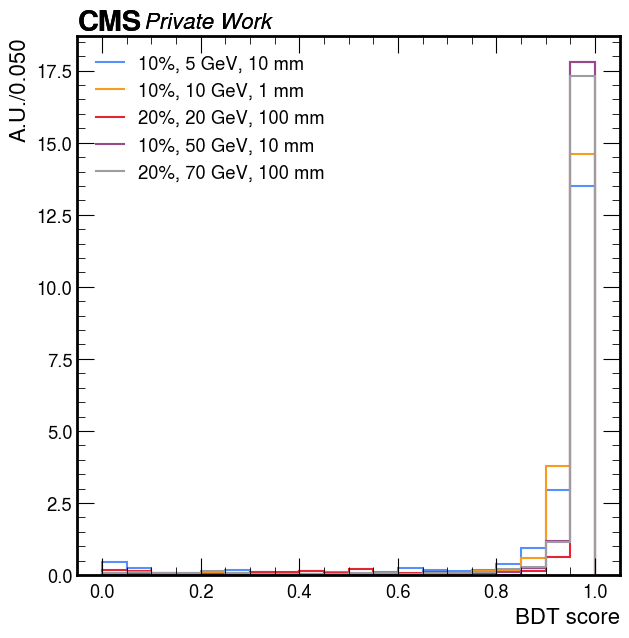

In [30]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

plot_dict = {
    'variable': 'bdtscore',
    'cut': 'cut10',
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'xlabel': 'BDT score',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'flow': None,     # overflow
    'doYerr': False,
    'doDensity': True,
    'doSave': False,
    'outDir': './plots/preABCD/',
    'label': None,
    'outName': f'signal_BDT_m1_{m1}_delta_{delta}_ctau_{ctau}.png'
}

# plot bkg
#ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

# Plot signal
m1 = 5; delta = 0.1; ctau = 10
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 10; delta = 0.1; ctau = 1
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 20; delta = 0.2; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 50; delta = 0.1; ctau = 10
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 70; delta = 0.2; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

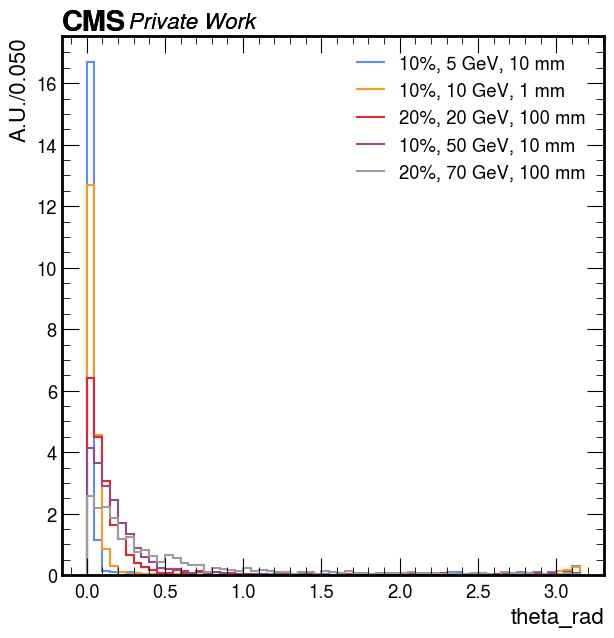

In [10]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

plot_dict = {
    'variable': 'sel_vtx_ThetaColl_fromPV_refit_rad',
    'cut': 'cut10',
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'flow': None,     # overflow
    'doYerr': False,
    'doDensity': True,
    'doSave': False,
    'outDir': './plots/preABCD/',
    'label': None,
    'outName': f'signal_theta_m1_{m1}_delta_{delta}_ctau_{ctau}.png'
}

# plot bkg
#ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

# Plot signal
m1 = 5; delta = 0.1; ctau = 10
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 10; delta = 0.1; ctau = 1
ptools.plot_signal_1D(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 20; delta = 0.2; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 50; delta = 0.1; ctau = 10
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

m1 = 70; delta = 0.2; ctau = 100
ptools.plot_signal_1D_noCMS(sig_histo, m1, delta, ctau, plot_dict, style_dict)

Saved: ./plots/theta_rad//bkg_theta_rad.png


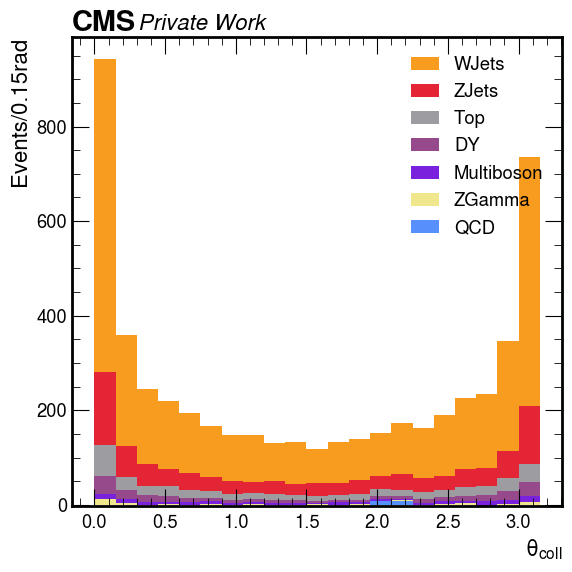

In [25]:
variable = 'sel_vtx_ThetaColl_fromPV_refit_rad'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 15j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'ylim': None,
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': r"$\theta_{coll}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.15rad',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/theta_rad/',
    'outName': f'bkg_theta_rad.png'
}

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

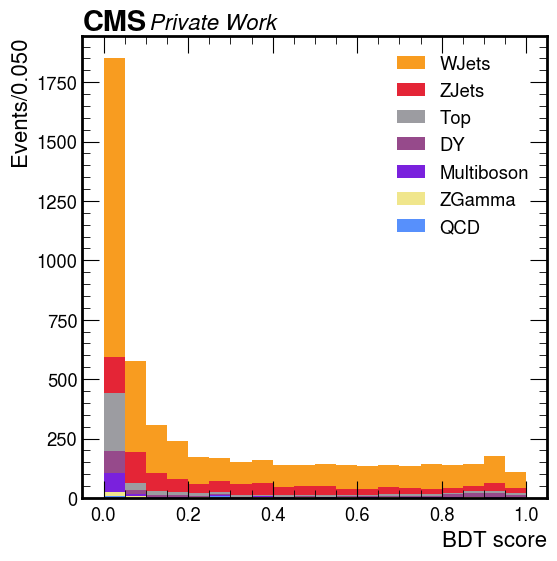

In [27]:
variable = 'bdtscore'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'xlabel': 'BDT score',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'flow': None,     # overflow
    'doYerr': False,
    'doDensity': False,
    'doSave': False,
    'outDir': './plots/preABCD/',
    'label': None,
    'outName': f'bkg_BDT_m1_{m1}_delta_{delta}_ctau_{ctau}.png'
}

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

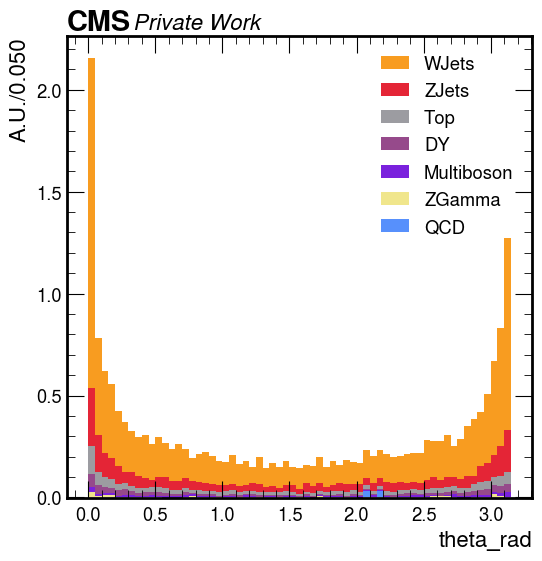

In [12]:
variable = 'sel_vtx_ThetaColl_fromPV_refit_rad'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'flow': None,     # overflow
    'doYerr': False,
    'doDensity': True,
    'doSave': False,
    'outDir': './plots/preABCD/',
    'label': None,
    'outName': f'bkg_theta_m1_{m1}_delta_{delta}_ctau_{ctau}.png'
}

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict)

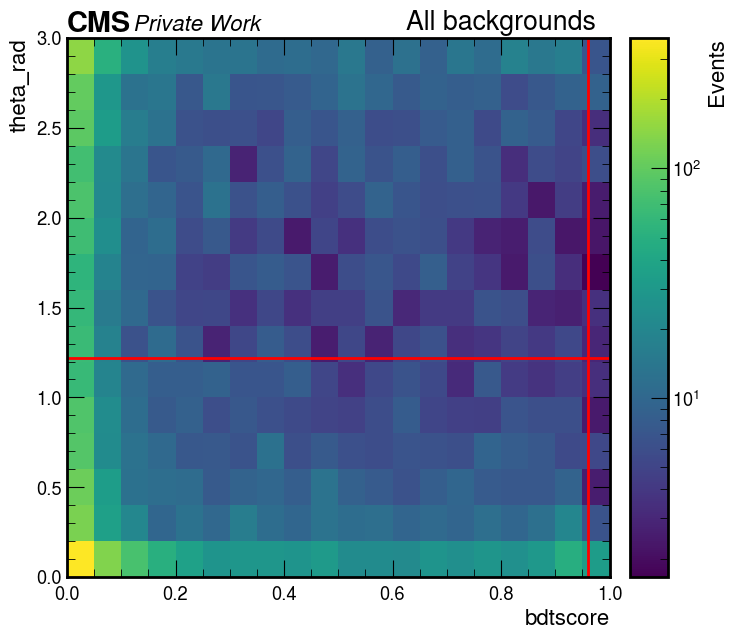

In [20]:
# Plot settings
#fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 50j,
    'yrebin': 20j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
#ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))


plt.title(rf"All backgrounds", position=(0.8, 0.5))

plt.vlines(0.96, 0, 180, color='red', linewidth=2)
plt.hlines(1.22, 0, 1, color='red', linewidth=2)

ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

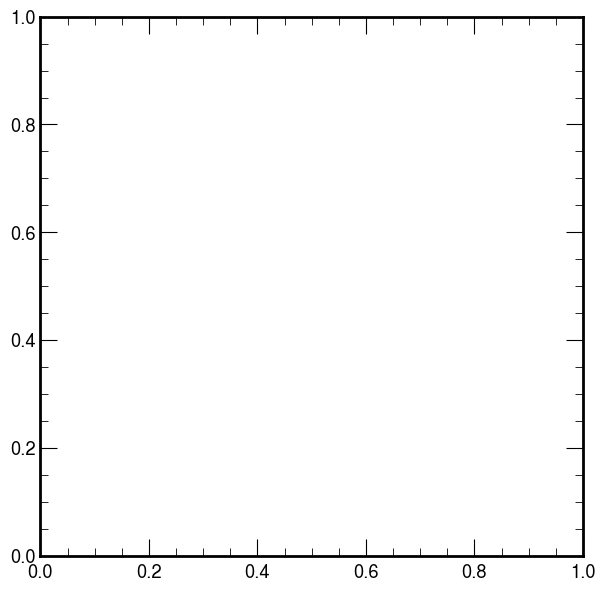

In [6]:
fig, ax = plt.subplots(figsize=(7,7))

In [ ]:
# Plot settings
#fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 2j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': 'BDT score',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Collinear angle',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': './',
    'outName': f'signal_{variable}_{cut}.png'
}

# Data
#ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))


m1 = 40
delta = 0.1
ctau = 100

plt.title(rf"{m1}GeV, $\Delta$={delta}, {ctau}mm", position=(0.75, 0.5))

plt.vlines(0.97, 0, 180, color='red', linewidth=2)
plt.hlines(1.22, 0, 1, color='red', linewidth=2)

style_2d_dict['outName'] = f'signal_ABCD_{m1}_{delta}_{ctau}.png'

ptools.plot_signal_2D(sig_histo, m1, delta, ctau, plot_dict, style_2d_dict)

Saved: ./plots/ABCD//signal_5_0p1_1.png
Saved: ./plots/ABCD//signal_5_0p1_10.png
Saved: ./plots/ABCD//signal_5_0p1_100.png
Saved: ./plots/ABCD//signal_5_0p2_1.png
Saved: ./plots/ABCD//signal_5_0p2_10.png
Saved: ./plots/ABCD//signal_5_0p2_100.png
Saved: ./plots/ABCD//signal_10_0p1_1.png
Saved: ./plots/ABCD//signal_10_0p1_10.png
Saved: ./plots/ABCD//signal_10_0p1_100.png
Saved: ./plots/ABCD//signal_10_0p2_1.png
Saved: ./plots/ABCD//signal_10_0p2_10.png
Saved: ./plots/ABCD//signal_10_0p2_100.png
Saved: ./plots/ABCD//signal_20_0p1_1.png
Saved: ./plots/ABCD//signal_20_0p1_10.png
Saved: ./plots/ABCD//signal_20_0p1_100.png
Saved: ./plots/ABCD//signal_20_0p2_1.png
Saved: ./plots/ABCD//signal_20_0p2_10.png
Saved: ./plots/ABCD//signal_20_0p2_100.png
Saved: ./plots/ABCD//signal_30_0p1_1.png
Saved: ./plots/ABCD//signal_30_0p1_10.png
Saved: ./plots/ABCD//signal_30_0p1_100.png
Saved: ./plots/ABCD//signal_30_0p2_1.png
Saved: ./plots/ABCD//signal_30_0p2_10.png
Saved: ./plots/ABCD//signal_30_0p2_100.pn

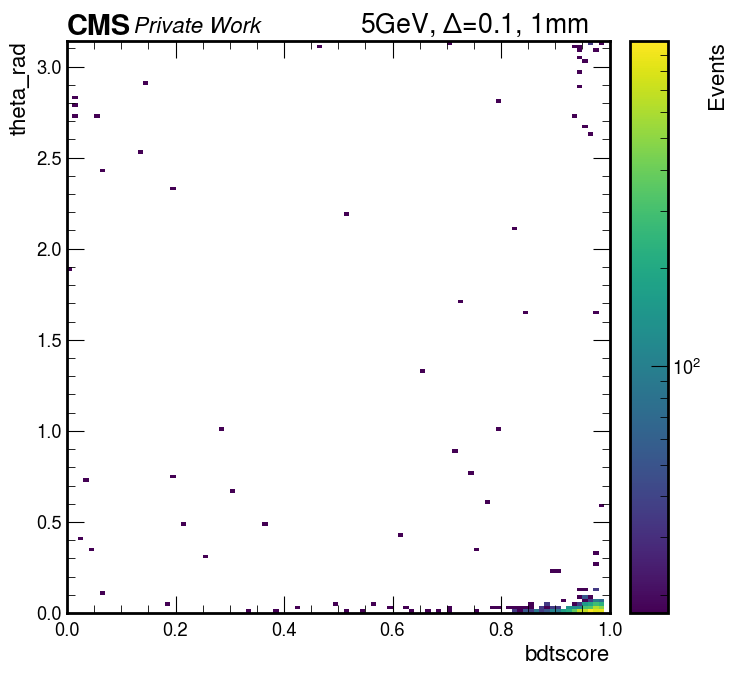

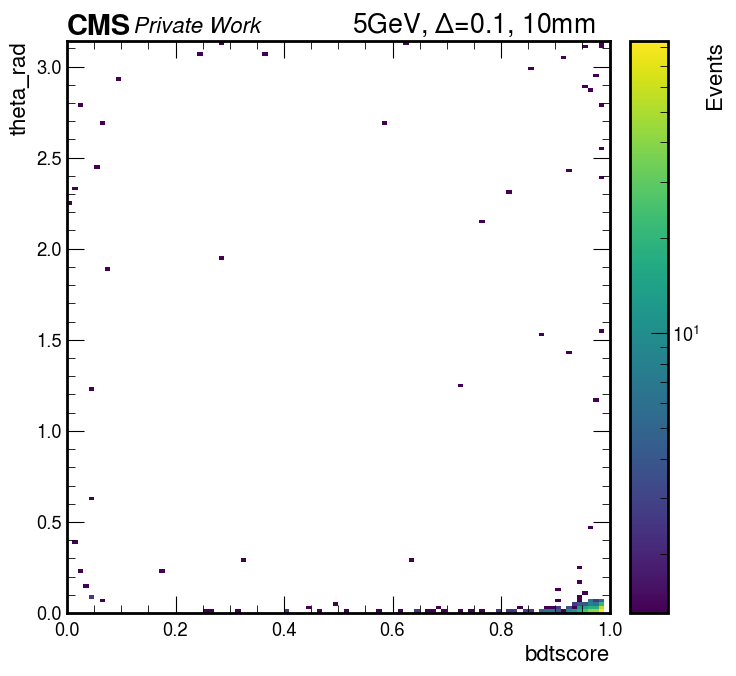

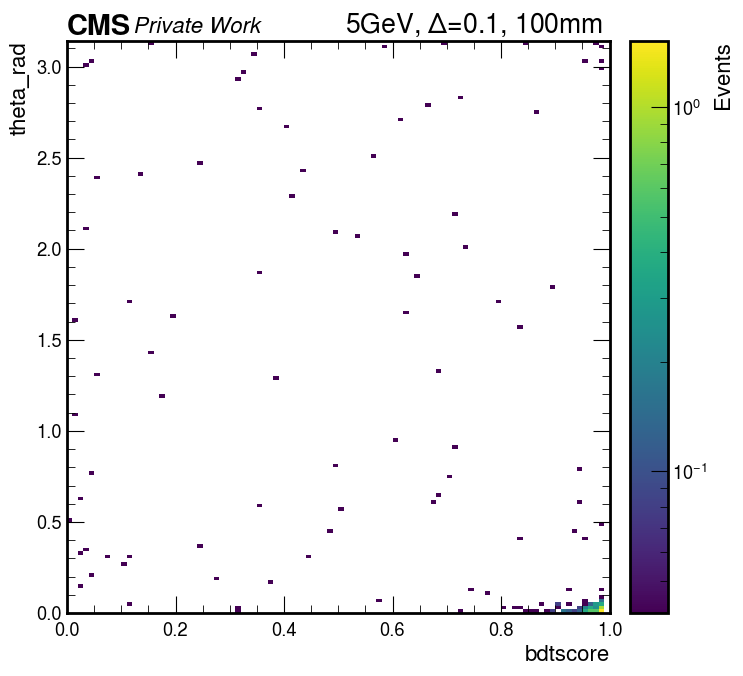

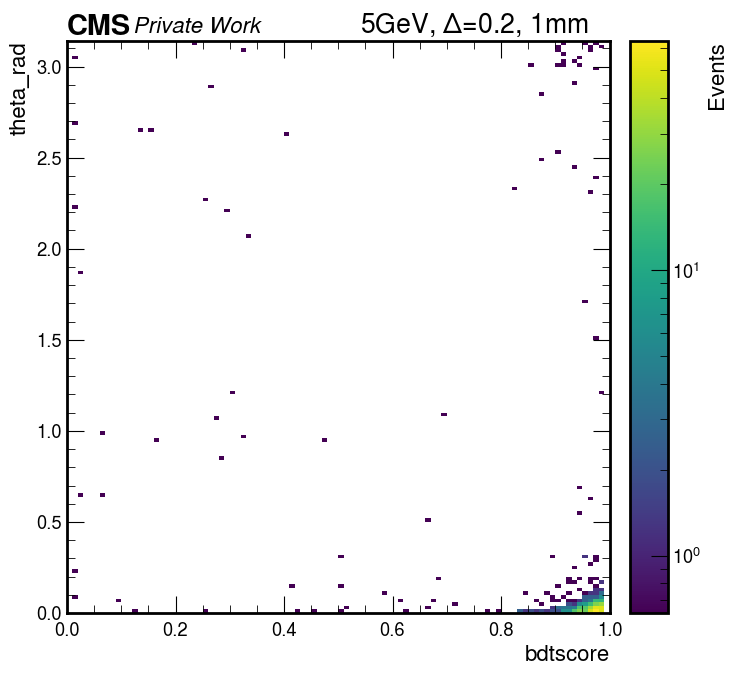

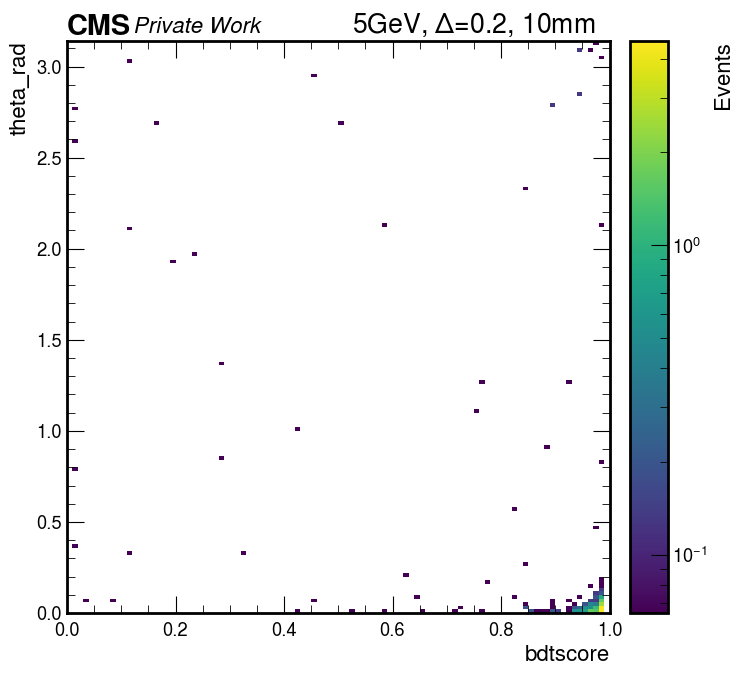

...

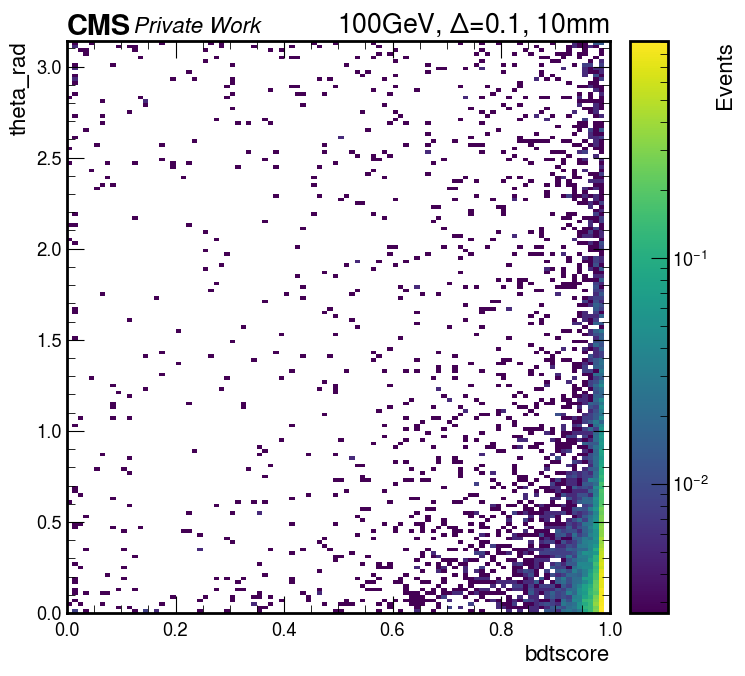

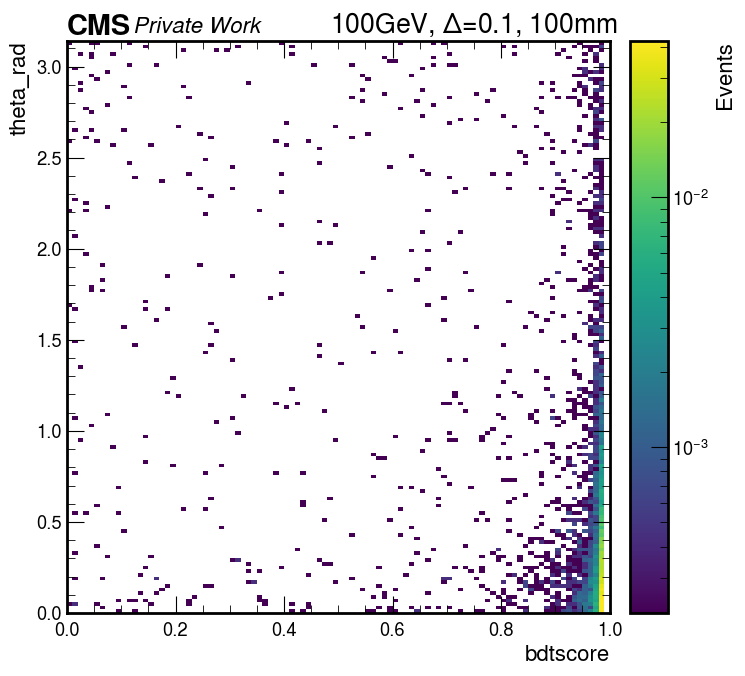

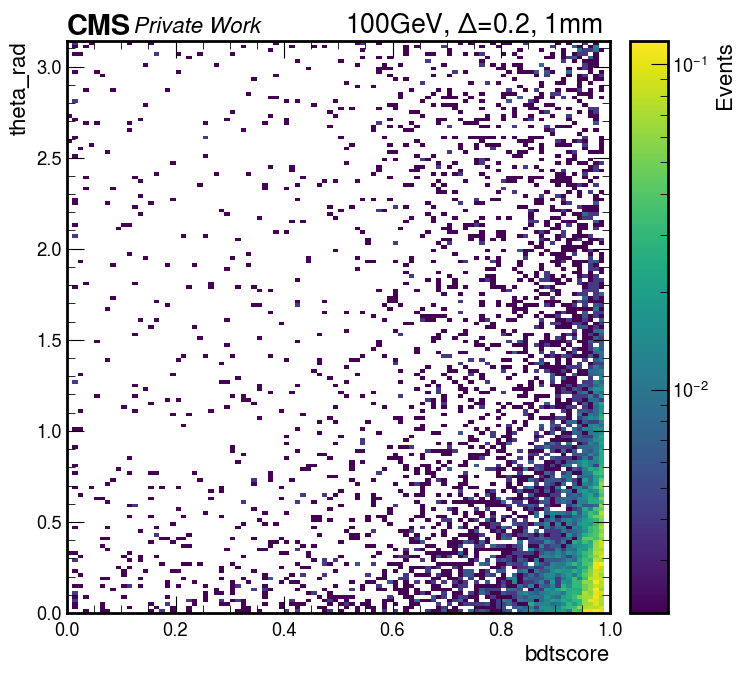

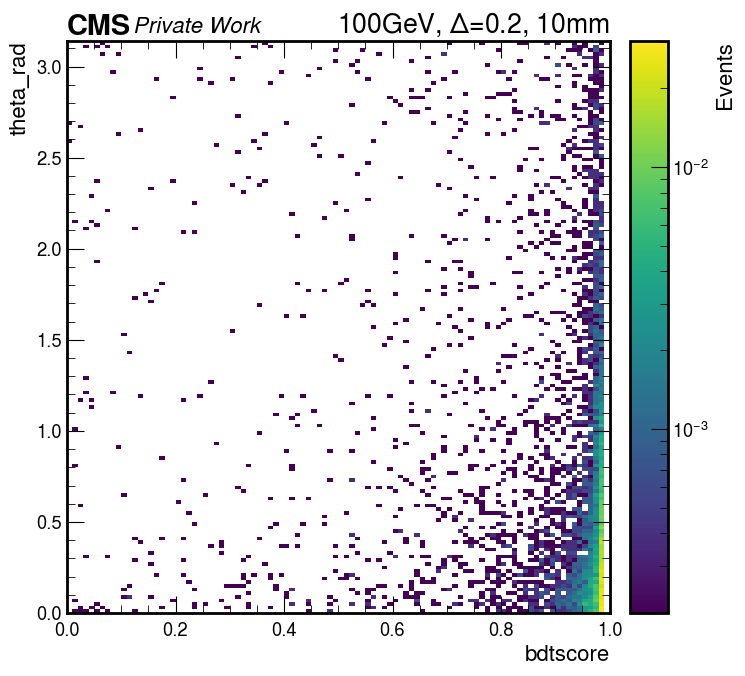

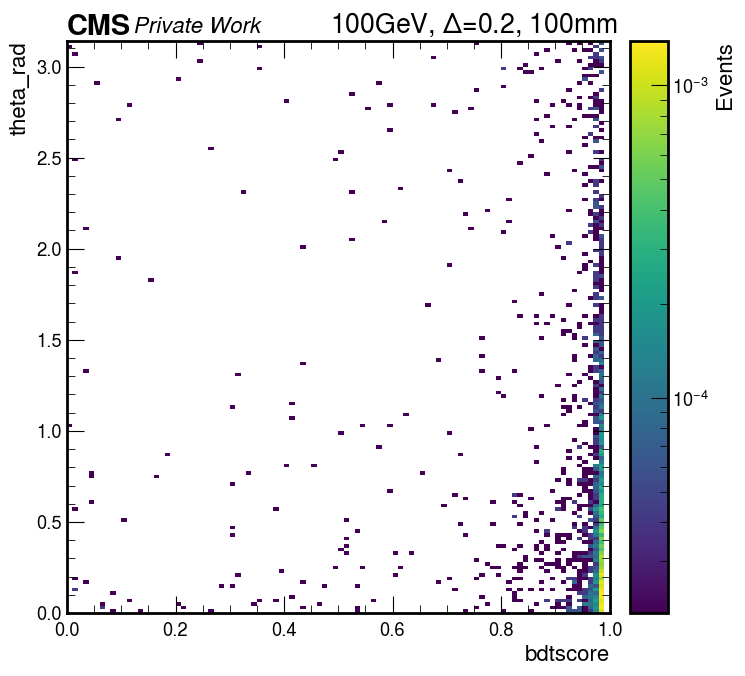

In [9]:
# Plot settings
#fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 2j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/ABCD/',
    'outName': f'signal.png'
}

# Data
#ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg


m1 = 5
delta = 0.2
ctau = 1

for m1 in [5,10,20,30,40,50,70,90,100]:
    for delta in [0.1,0.2]:
        for ctau in [1,10,100]:
            style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
            style_2d_dict['outName'] = f'signal_{int(m1)}_{str(delta).replace(".","p")}_{ctau}.png'
            ptools.plot_signal_2D(sig_histo, m1, delta, ctau, plot_dict, style_2d_dict)
            plt.title(rf"{m1}GeV, $\Delta$={delta}, {ctau}mm", position=(0.75, 0.5))

## ABCD Boundary

In [49]:
si = utils.get_signal_point_dict(sig_histo)
bkg_samp = list(bkg_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'].axes['samp'])

In [50]:
cut = 'cut10'

In [51]:
m1s = [5, 10, 20, 40, 50, 70, 90, 100]
deltas = [0.1, 0.2]
ctaus = [1, 10, 100]

### Scan theta first

In [60]:
range_theta_scan = list(np.arange(0.01, 3.15, 0.01))

sig_ADs = {}
sig_ABCDs = {}
sig_theta_eff = {}

In [61]:
len(range_theta_scan)

314

In [62]:
sig_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":samp, "cut": cut}]

Hist(
  Regular(1000, 0, 1, name='bdtscore'),
  Regular(315, 0, 3.15, name='theta_rad'),
  storage=Weight()) # Sum: WeightedSum(value=0.0493793, variance=1.02151e-06)

In [63]:
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            sig_ADs[samp] = []
            sig_ABCDs[samp] = []
            sig_theta_eff[samp] = []

            print(f'\n m1 = {m1}, delta = {delta}, ctau = {ctau}')

            for theta_cut in range_theta_scan:
                # Yields
                sig_AD = sig_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":samp, "cut": cut}][:,:int(100*theta_cut)].sum().value
                sig_ABCD = sig_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":samp, "cut": cut}][:,:].sum().value
                
                print(f'Theta cut ({theta_cut:.2f}) efficiency = {sig_AD:.1f}/{sig_ABCD:.1f} = {sig_AD/sig_ABCD:.4f}')
    
                sig_ADs[samp].append(sig_AD)
                sig_ABCDs[samp].append(sig_ABCD)
                sig_theta_eff[samp].append(sig_AD/sig_ABCD)


 m1 = 5, delta = 0.1, ctau = 1
Theta cut (0.01) efficiency = 3059.3/10324.5 = 0.2963
Theta cut (0.02) efficiency = 5446.2/10324.5 = 0.5275
Theta cut (0.03) efficiency = 6931.0/10324.5 = 0.6713
Theta cut (0.04) efficiency = 7921.1/10324.5 = 0.7672
Theta cut (0.05) efficiency = 8486.7/10324.5 = 0.8220
Theta cut (0.06) efficiency = 8963.8/10324.5 = 0.8682
Theta cut (0.07) efficiency = 8963.8/10324.5 = 0.8682
Theta cut (0.08) efficiency = 9175.6/10324.5 = 0.8887
Theta cut (0.09) efficiency = 9228.6/10324.5 = 0.8939
Theta cut (0.10) efficiency = 9299.2/10324.5 = 0.9007
Theta cut (0.11) efficiency = 9299.2/10324.5 = 0.9007
Theta cut (0.12) efficiency = 9299.2/10324.5 = 0.9007
Theta cut (0.13) efficiency = 9352.5/10324.5 = 0.9059
Theta cut (0.14) efficiency = 9370.3/10324.5 = 0.9076
Theta cut (0.15) efficiency = 9370.3/10324.5 = 0.9076
Theta cut (0.16) efficiency = 9388.0/10324.5 = 0.9093
Theta cut (0.17) efficiency = 9388.0/10324.5 = 0.9093
Theta cut (0.18) efficiency = 9388.0/10324.5 = 0.9

In [64]:
sig_theta_cut_idx_0p9eff = {}

In [65]:
for sig_point, eff_list in sig_theta_eff.items():
    # Find the eff value closest to 90%
    delta_eff = np.abs(np.array(eff_list) - 0.9)
    print(sig_point)
    print(f'{eff_list[np.argmin(delta_eff)]:.2f}')

    sig_theta_cut_idx_0p9eff[sig_point] = np.argmin(delta_eff)

sig_2018_Mchi-5p25_dMchi-0p5_ctau-1
0.90
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10
0.90
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100
0.90
sig_2018_Mchi-5p5_dMchi-1p0_ctau-1
0.90
sig_2018_Mchi-5p5_dMchi-1p0_ctau-10
0.90
sig_2018_Mchi-5p5_dMchi-1p0_ctau-100
0.90
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1
0.90
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10
0.90
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100
0.90
sig_2018_Mchi-11p0_dMchi-2p0_ctau-1
0.90
sig_2018_Mchi-11p0_dMchi-2p0_ctau-10
0.90
sig_2018_Mchi-11p0_dMchi-2p0_ctau-100
0.90
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1
0.90
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10
0.90
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100
0.90
sig_2018_Mchi-22p0_dMchi-4p0_ctau-1
0.90
sig_2018_Mchi-22p0_dMchi-4p0_ctau-10
0.90
sig_2018_Mchi-22p0_dMchi-4p0_ctau-100
0.90
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1
0.90
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10
0.90
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100
0.90
sig_2018_Mchi-44p0_dMchi-8p0_ctau-1
0.90
sig_2018_Mchi-44p0_dMchi-8p0_ctau-10
0.90
sig_2018_Mchi-44p0_dMchi-8p0_ctau-100


In [66]:
sig_theta_cut_idx_0p9eff

{'sig_2018_Mchi-5p25_dMchi-0p5_ctau-1': 9,
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-10': 17,
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-100': 230,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-1': 9,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-10': 12,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-100': 191,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-1': 13,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-10': 14,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-100': 184,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-1': 16,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-10': 14,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-100': 132,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-1': 23,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-10': 19,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-100': 31,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-1': 30,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-10': 26,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-100': 36,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-1': 47,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-10': 36,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-100': 42,
 'sig_2018_Mchi-44p0_dMchi-8p0_ctau-1': 64,
 'sig_2018_M

In [67]:
bkg_ADs = []
bkg_ABCDs = []
bkg_theta_eff = []

In [68]:
for theta_cut in range_theta_scan:
    bkg_AD = 0
    bkg_ABCD = 0
    
    for i in range(len(bkg_samp)):
        bkg_AD += bkg_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":bkg_samp[i], "cut": cut}][:,:int(100*theta_cut)].sum().value
        bkg_ABCD += bkg_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":bkg_samp[i], "cut": cut}][:,:].sum().value
    
    print(f'Theta cut ({theta_cut:.2f}) efficiency = {bkg_AD:.1f}/{bkg_ABCD:.1f} = {bkg_AD/bkg_ABCD:.4f}')

    bkg_ADs.append(bkg_AD)
    bkg_ABCDs.append(bkg_ABCD)
    bkg_theta_eff.append(bkg_AD/bkg_ABCD)

Theta cut (0.01) efficiency = 252.3/5296.6 = 0.0476
Theta cut (0.02) efficiency = 371.0/5296.6 = 0.0700
Theta cut (0.03) efficiency = 442.4/5296.6 = 0.0835
Theta cut (0.04) efficiency = 514.3/5296.6 = 0.0971
Theta cut (0.05) efficiency = 570.9/5296.6 = 0.1078
Theta cut (0.06) efficiency = 616.1/5296.6 = 0.1163
Theta cut (0.07) efficiency = 616.1/5296.6 = 0.1163
Theta cut (0.08) efficiency = 691.5/5296.6 = 0.1306
Theta cut (0.09) efficiency = 742.6/5296.6 = 0.1402
Theta cut (0.10) efficiency = 777.4/5296.6 = 0.1468
Theta cut (0.11) efficiency = 810.5/5296.6 = 0.1530
Theta cut (0.12) efficiency = 843.1/5296.6 = 0.1592
Theta cut (0.13) efficiency = 875.7/5296.6 = 0.1653
Theta cut (0.14) efficiency = 914.0/5296.6 = 0.1726
Theta cut (0.15) efficiency = 942.1/5296.6 = 0.1779
Theta cut (0.16) efficiency = 975.8/5296.6 = 0.1842
Theta cut (0.17) efficiency = 1006.4/5296.6 = 0.1900
Theta cut (0.18) efficiency = 1036.7/5296.6 = 0.1957
Theta cut (0.19) efficiency = 1062.5/5296.6 = 0.2006
Theta cut

In [69]:
s_over_b_max_idx = {}
s_over_b_max = {}

In [70]:
for sig_point, yield_list in sig_ADs.items():
    s_over_b = np.array(yield_list)/np.sqrt(bkg_ADs)

    print(sig_point)
    print(f'{np.argmax(s_over_b)}, {s_over_b[np.argmax(s_over_b)]:.3f}')

    s_over_b_max_idx[sig_point] = np.argmax(s_over_b)
    s_over_b_max[sig_point] = s_over_b[np.argmax(s_over_b)]

sig_2018_Mchi-5p25_dMchi-0p5_ctau-1
5, 361.119
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10
4, 19.376
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100
5, 0.281
sig_2018_Mchi-5p5_dMchi-1p0_ctau-1
7, 22.016
sig_2018_Mchi-5p5_dMchi-1p0_ctau-10
7, 0.930
sig_2018_Mchi-5p5_dMchi-1p0_ctau-100
7, 0.013
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1
9, 277.251
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10
7, 16.310
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100
8, 0.300
sig_2018_Mchi-11p0_dMchi-2p0_ctau-1
12, 13.358
sig_2018_Mchi-11p0_dMchi-2p0_ctau-10
12, 0.680
sig_2018_Mchi-11p0_dMchi-2p0_ctau-100
14, 0.012
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1
18, 216.378
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10
18, 16.320
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100
15, 0.362
sig_2018_Mchi-22p0_dMchi-4p0_ctau-1
25, 9.675
sig_2018_Mchi-22p0_dMchi-4p0_ctau-10
26, 0.604
sig_2018_Mchi-22p0_dMchi-4p0_ctau-100
25, 0.013
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1
32, 114.126
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10
36, 8.978
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100
28, 0.229
sig_2018_Mch

In [71]:
s_over_b_max_idx

{'sig_2018_Mchi-5p25_dMchi-0p5_ctau-1': 5,
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-10': 4,
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-100': 5,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-1': 7,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-10': 7,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-100': 7,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-1': 9,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-10': 7,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-100': 8,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-1': 12,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-10': 12,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-100': 14,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-1': 18,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-10': 18,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-100': 15,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-1': 25,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-10': 26,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-100': 25,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-1': 32,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-10': 36,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-100': 28,
 'sig_2018_Mchi-44p0_dMchi-8p0_ctau-1': 45,
 'sig_2018_Mchi-44p0_dM

In [72]:
list_cut = {}

for delta in deltas:
    list_cut[str(delta)] = {}
    for ctau in ctaus:
        list_cut[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            list_cut[str(delta)][str(ctau)].append(range_theta_scan[sig_theta_cut_idx_0p9eff[samp]])

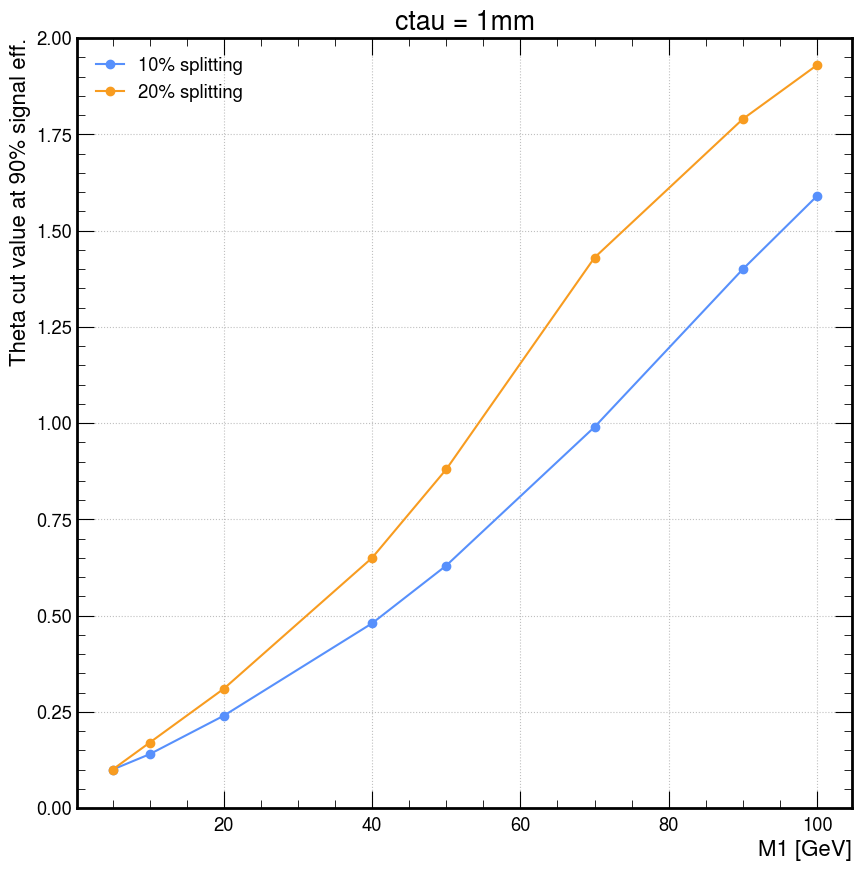

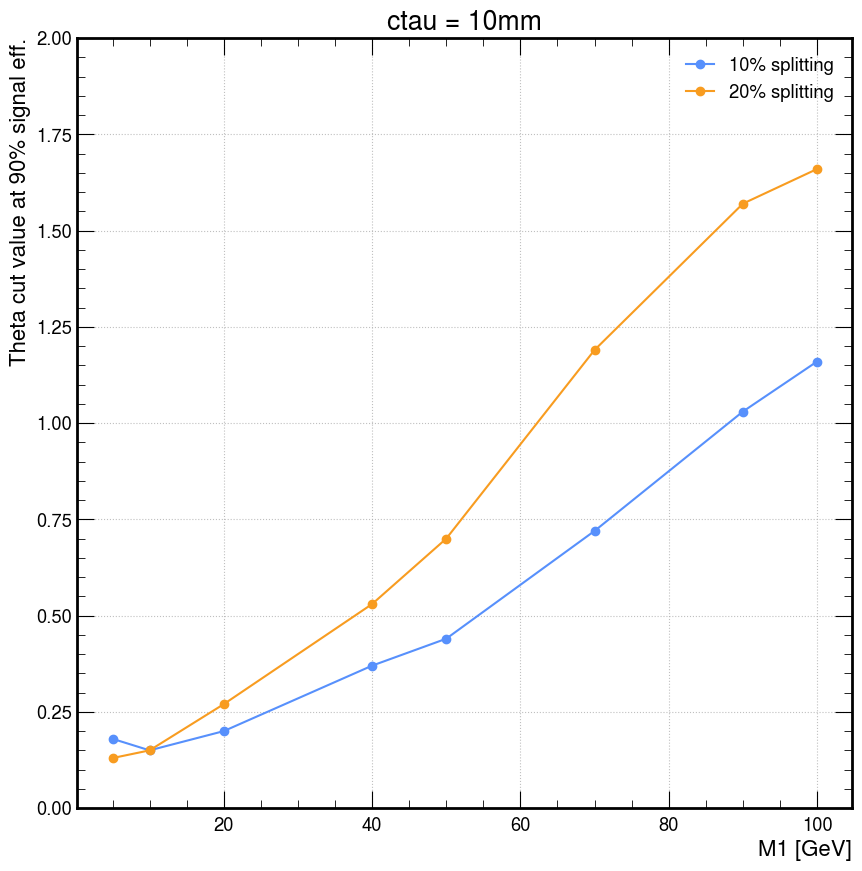

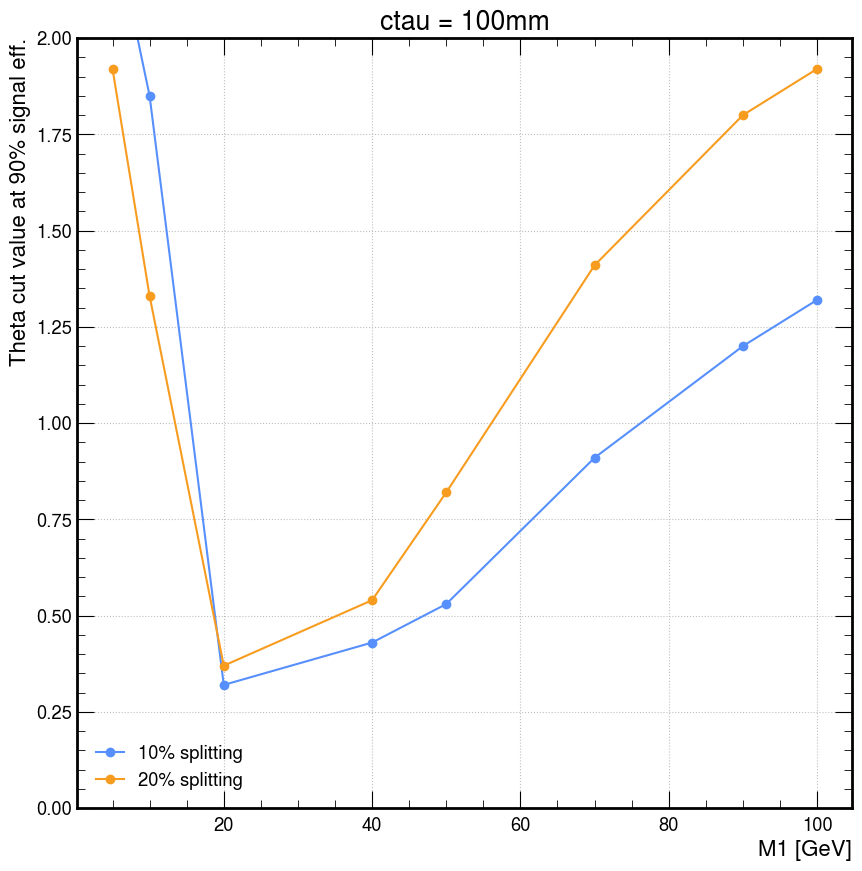

In [73]:
for ct in [1,10,100]:
    plt.plot(m1s, list_cut['0.1'][str(ct)], '-o', label=f'10% splitting')
    plt.plot(m1s, list_cut['0.2'][str(ct)], '-o', label=f'20% splitting')
    
    plt.ylim([0,2])
    
    plt.ylabel('Theta cut value at 90% signal eff.')
    plt.xlabel('M1 [GeV]')
    
    plt.title(f'ctau = {ct}mm')
    plt.legend()

    plt.grid()

    plt.show()

In [74]:
import mplhep as hep

In [84]:
list_cut = {}

for delta in deltas:
    list_cut[str(delta)] = {}
    for ctau in ctaus:
        list_cut[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            list_cut[str(delta)][str(ctau)].append(range_theta_scan[s_over_b_max_idx[samp]])

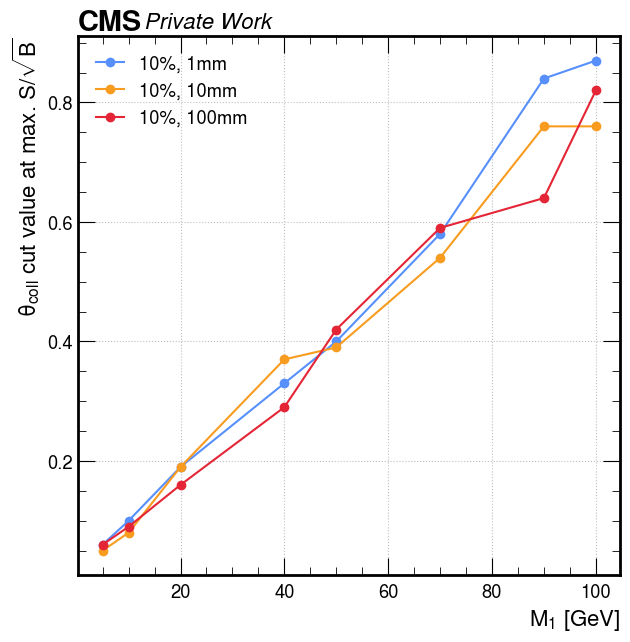

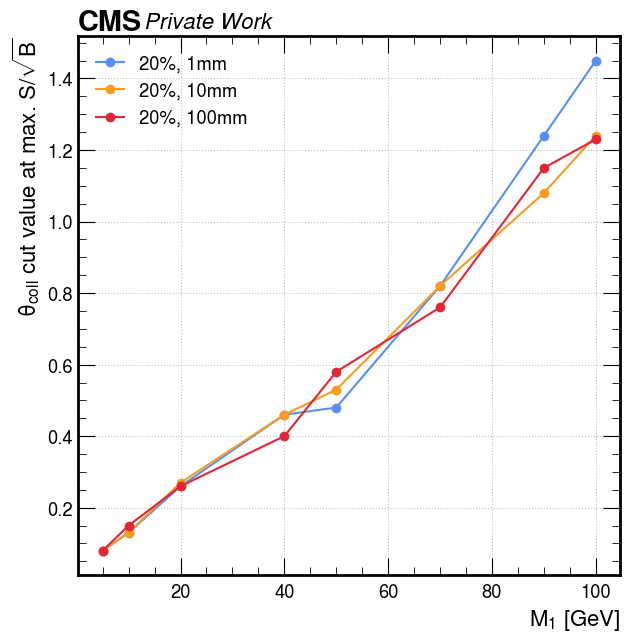

In [85]:
for delta in [0.1, 0.2]:
    fig,axes = plt.subplots(figsize=(7,7))
    
    plt.plot(m1s, list_cut[str(delta)]['1'], '-o', label=f'{int(delta*100)}%, 1mm')
    plt.plot(m1s, list_cut[str(delta)]['10'], '-o', label=f'{int(delta*100)}%, 10mm')
    plt.plot(m1s, list_cut[str(delta)]['100'], '-o', label=f'{int(delta*100)}%, 100mm')
    
    #plt.ylim([0,90])
    
    plt.ylabel(r"$\theta_{coll}$ cut value at max. $S/\sqrt{B}$")
    plt.xlabel(r"$M_{1}$ [GeV]")
    
    #plt.title(f'{int(delta*100)}% splitting')
    hep.cms.label('', data=False, llabel='Private Work', rlabel='')

    plt.legend(loc=2)
    
    plt.grid()

    #ylabels = np.array([int(item.get_text()) for item in axes.get_yticklabels()])
    #ylabels = ylabels*np.pi/180
    #ylabels_rad = [ f'{theta:.2f}' for theta in ylabels ]

    #axes.set_yticklabels(ylabels_rad)
    
    #plt.savefig(f'plots/theta_rad/theta_rad_{delta}_sig_scan.pdf', bbox_inches = "tight")
    plt.show()

Text(0.5, 1.0, 'Total background (before BDT cut)')

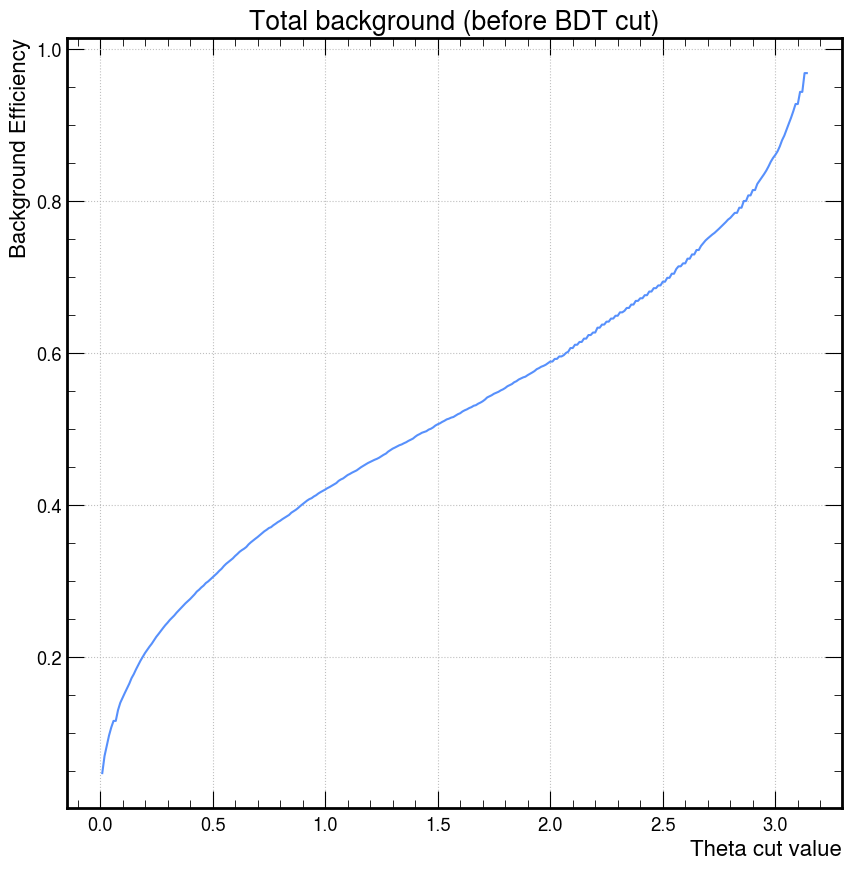

In [87]:
plt.plot(range_theta_scan, bkg_theta_eff)

plt.xlabel('Theta cut value')
plt.ylabel('Background Efficiency')

#plt.xlim([0,180])
plt.grid()

plt.title('Total background (before BDT cut)')

Text(0.5, 1.0, 'Total background (before BDT cut)')

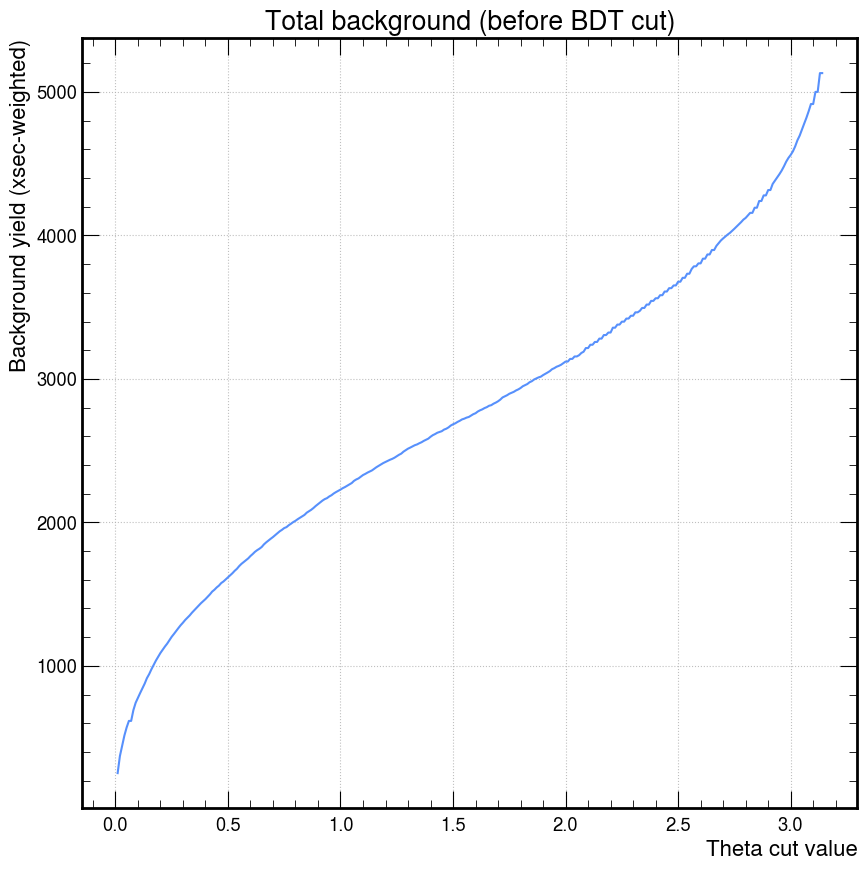

In [88]:
plt.plot(range_theta_scan, bkg_ADs)

plt.xlabel('Theta cut value')
plt.ylabel('Background yield (xsec-weighted)')

#plt.xlim([0,180])
plt.grid()

plt.title('Total background (before BDT cut)')

### Scan BDT

In [52]:
#range_bdt_scan = list(np.arange(0.7, 0.999, 0.001))
range_bdt_scan = list(np.arange(0.80, 0.995, 0.005))

sig_As = {}
sig_ABs = {}
sig_bdt_eff = {}

bkg_As = []
bkg_ABs = []
bkg_bdt_eff = []

In [53]:
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            sig_As[samp] = []
            sig_ABs[samp] = []
            sig_bdt_eff[samp] = []

            print(f'\n m1 = {m1}, delta = {delta}, ctau = {ctau}')

            for bdt_cut in range_bdt_scan:
                # Yields
                sig_A = sig_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":samp, "cut": cut}][int(bdt_cut*1000):,:122].sum().value
                sig_AB = sig_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":samp, "cut": cut}][:,:122].sum().value
                
                print(f'BDT cut ({bdt_cut:.2f}) efficiency = {sig_A:.1f}/{sig_AB:.1f} = {sig_A/sig_AB:.4f}')
    
                sig_As[samp].append(sig_A)
                sig_ABs[samp].append(sig_AB)
                sig_bdt_eff[samp].append(sig_A/sig_AB)


 m1 = 5, delta = 0.1, ctau = 1
BDT cut (0.80) efficiency = 9122.5/9688.3 = 0.9416
BDT cut (0.81) efficiency = 9122.5/9688.3 = 0.9416
BDT cut (0.81) efficiency = 9122.5/9688.3 = 0.9416
BDT cut (0.82) efficiency = 9104.8/9688.3 = 0.9398
BDT cut (0.82) efficiency = 9104.8/9688.3 = 0.9398
BDT cut (0.83) efficiency = 9087.2/9688.3 = 0.9379
BDT cut (0.83) efficiency = 9051.8/9688.3 = 0.9343
BDT cut (0.84) efficiency = 9051.8/9688.3 = 0.9343
BDT cut (0.84) efficiency = 9016.5/9688.3 = 0.9306
BDT cut (0.85) efficiency = 8981.0/9688.3 = 0.9270
BDT cut (0.85) efficiency = 8945.7/9688.3 = 0.9233
BDT cut (0.86) efficiency = 8892.6/9688.3 = 0.9179
BDT cut (0.86) efficiency = 8874.9/9688.3 = 0.9160
BDT cut (0.87) efficiency = 8804.2/9688.3 = 0.9087
BDT cut (0.87) efficiency = 8786.5/9688.3 = 0.9069
BDT cut (0.88) efficiency = 8751.1/9688.3 = 0.9033
BDT cut (0.88) efficiency = 8715.8/9688.3 = 0.8996
BDT cut (0.89) efficiency = 8662.8/9688.3 = 0.8941
BDT cut (0.89) efficiency = 8609.8/9688.3 = 0.8887

In [54]:
sig_bdt_cut_idx_0p9eff = {}

In [55]:
for sig_point, eff_list in sig_bdt_eff.items():
    # Find the eff value closest to 90%
    delta_eff = np.abs(np.array(eff_list) - 0.9)
    print(sig_point)
    print(f'{eff_list[np.argmin(delta_eff)]:.2f}')

    
    sig_bdt_cut_idx_0p9eff[sig_point] = np.argmin(delta_eff)

sig_2018_Mchi-5p25_dMchi-0p5_ctau-1
0.90
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10
0.90
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100
0.85
sig_2018_Mchi-5p5_dMchi-1p0_ctau-1
0.90
sig_2018_Mchi-5p5_dMchi-1p0_ctau-10
0.90
sig_2018_Mchi-5p5_dMchi-1p0_ctau-100
0.89
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1
0.90
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10
0.90
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100
0.90
sig_2018_Mchi-11p0_dMchi-2p0_ctau-1
0.91
sig_2018_Mchi-11p0_dMchi-2p0_ctau-10
0.89
sig_2018_Mchi-11p0_dMchi-2p0_ctau-100
0.90
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1
0.90
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10
0.90
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100
0.91
sig_2018_Mchi-22p0_dMchi-4p0_ctau-1
0.90
sig_2018_Mchi-22p0_dMchi-4p0_ctau-10
0.90
sig_2018_Mchi-22p0_dMchi-4p0_ctau-100
0.90
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1
0.90
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10
0.89
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100
0.90
sig_2018_Mchi-44p0_dMchi-8p0_ctau-1
0.90
sig_2018_Mchi-44p0_dMchi-8p0_ctau-10
0.89
sig_2018_Mchi-44p0_dMchi-8p0_ctau-100


In [56]:
for bdt_cut in range_bdt_scan:
    bkg_A = 0
    bkg_AB = 0
    
    for i in range(len(bkg_samp)):
        bkg_A += bkg_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":bkg_samp[i], "cut": cut}][int(bdt_cut*1000):,:122].sum().value
        bkg_AB += bkg_histo['bdtscore_vs_sel_vtx_thetaColl_fromPV_refit_rad'][{"samp":bkg_samp[i], "cut": cut}][:,:122].sum().value
    
    print(f'BDT cut ({bdt_cut:.2f}) efficiency = {bkg_A:.1f}/{bkg_AB:.1f} = {bkg_A/bkg_AB:.4f}')

    bkg_As.append(bkg_A)
    bkg_ABs.append(bkg_AB)
    bkg_bdt_eff.append(bkg_A/bkg_AB)

BDT cut (0.80) efficiency = 274.6/2436.5 = 0.1127
BDT cut (0.81) efficiency = 266.9/2436.5 = 0.1095
BDT cut (0.81) efficiency = 260.7/2436.5 = 0.1070
BDT cut (0.82) efficiency = 254.7/2436.5 = 0.1045
BDT cut (0.82) efficiency = 247.8/2436.5 = 0.1017
BDT cut (0.83) efficiency = 242.5/2436.5 = 0.0995
BDT cut (0.83) efficiency = 238.1/2436.5 = 0.0977
BDT cut (0.84) efficiency = 232.3/2436.5 = 0.0953
BDT cut (0.84) efficiency = 227.0/2436.5 = 0.0932
BDT cut (0.85) efficiency = 220.3/2436.5 = 0.0904
BDT cut (0.85) efficiency = 213.8/2436.5 = 0.0877
BDT cut (0.86) efficiency = 208.1/2436.5 = 0.0854
BDT cut (0.86) efficiency = 202.3/2436.5 = 0.0830
BDT cut (0.87) efficiency = 194.1/2436.5 = 0.0797
BDT cut (0.87) efficiency = 188.6/2436.5 = 0.0774
BDT cut (0.88) efficiency = 183.7/2436.5 = 0.0754
BDT cut (0.88) efficiency = 179.2/2436.5 = 0.0736
BDT cut (0.89) efficiency = 172.6/2436.5 = 0.0708
BDT cut (0.89) efficiency = 163.4/2436.5 = 0.0671
BDT cut (0.90) efficiency = 156.2/2436.5 = 0.0641


In [57]:
sig_bdt_cut_idx_0p9eff

{'sig_2018_Mchi-5p25_dMchi-0p5_ctau-1': 16,
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-10': 10,
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-100': 0,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-1': 25,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-10': 25,
 'sig_2018_Mchi-5p5_dMchi-1p0_ctau-100': 0,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-1': 25,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-10': 28,
 'sig_2018_Mchi-10p5_dMchi-1p0_ctau-100': 6,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-1': 27,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-10': 30,
 'sig_2018_Mchi-11p0_dMchi-2p0_ctau-100': 26,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-1': 27,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-10': 30,
 'sig_2018_Mchi-21p0_dMchi-2p0_ctau-100': 29,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-1': 28,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-10': 31,
 'sig_2018_Mchi-22p0_dMchi-4p0_ctau-100': 32,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-1': 26,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-10': 31,
 'sig_2018_Mchi-42p0_dMchi-4p0_ctau-100': 32,
 'sig_2018_Mchi-44p0_dMchi-8p0_ctau-1': 25,
 'sig_2018_Mchi-4

In [58]:
list_cut = {}

for delta in deltas:
    list_cut[str(delta)] = {}
    for ctau in ctaus:
        list_cut[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            list_cut[str(delta)][str(ctau)].append(range_bdt_scan[sig_bdt_cut_idx_0p9eff[samp]])

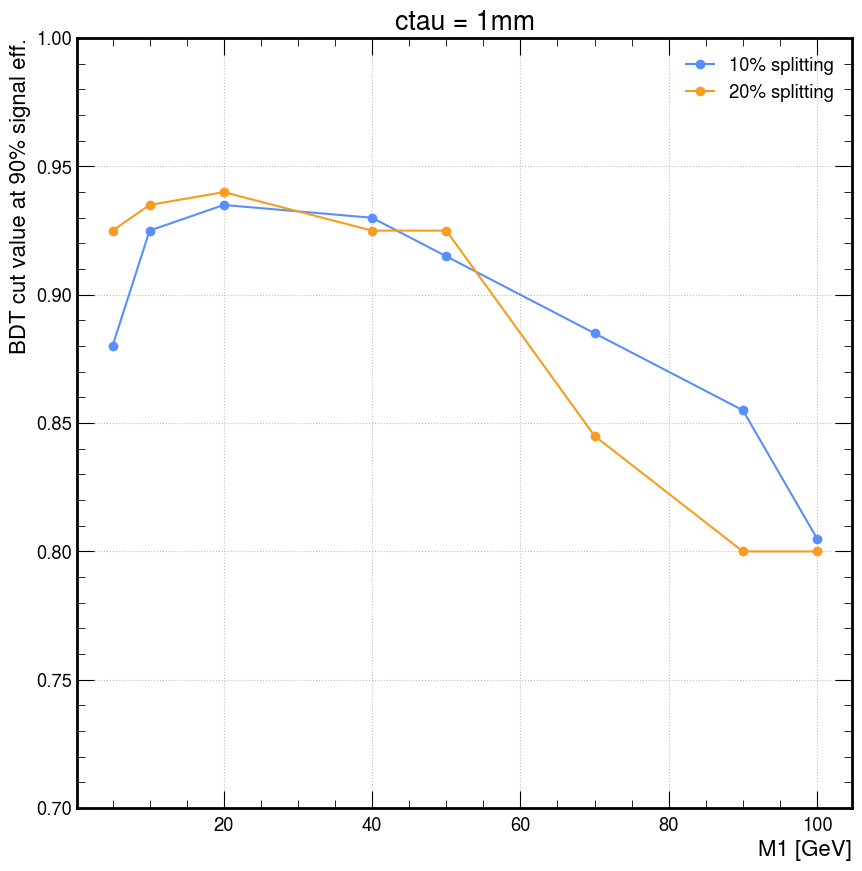

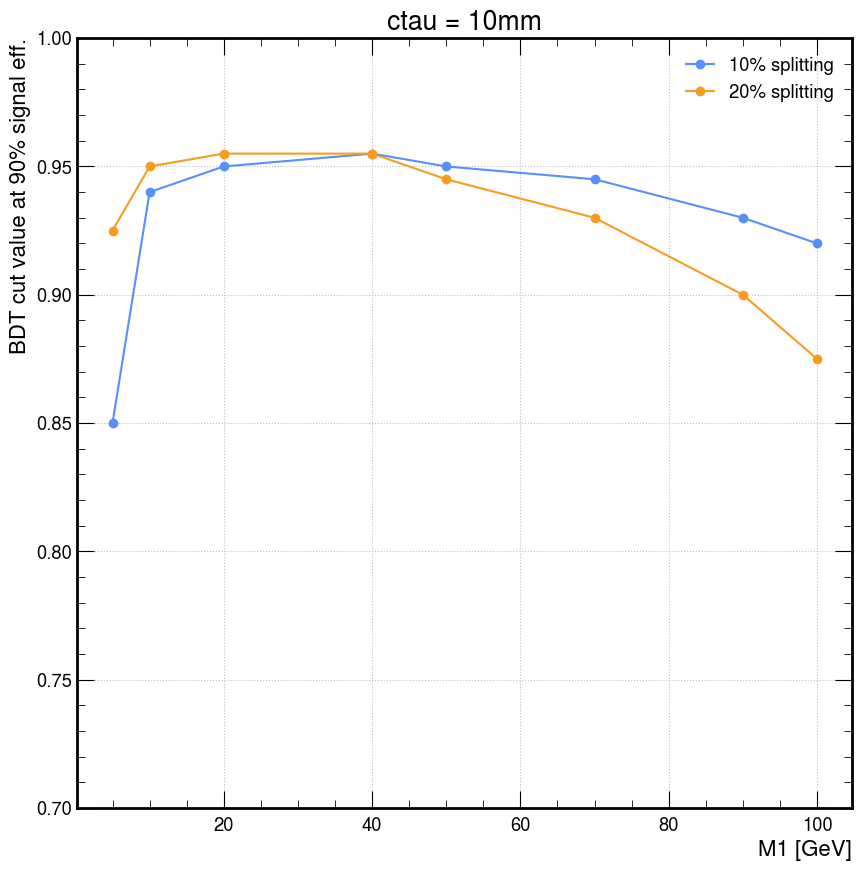

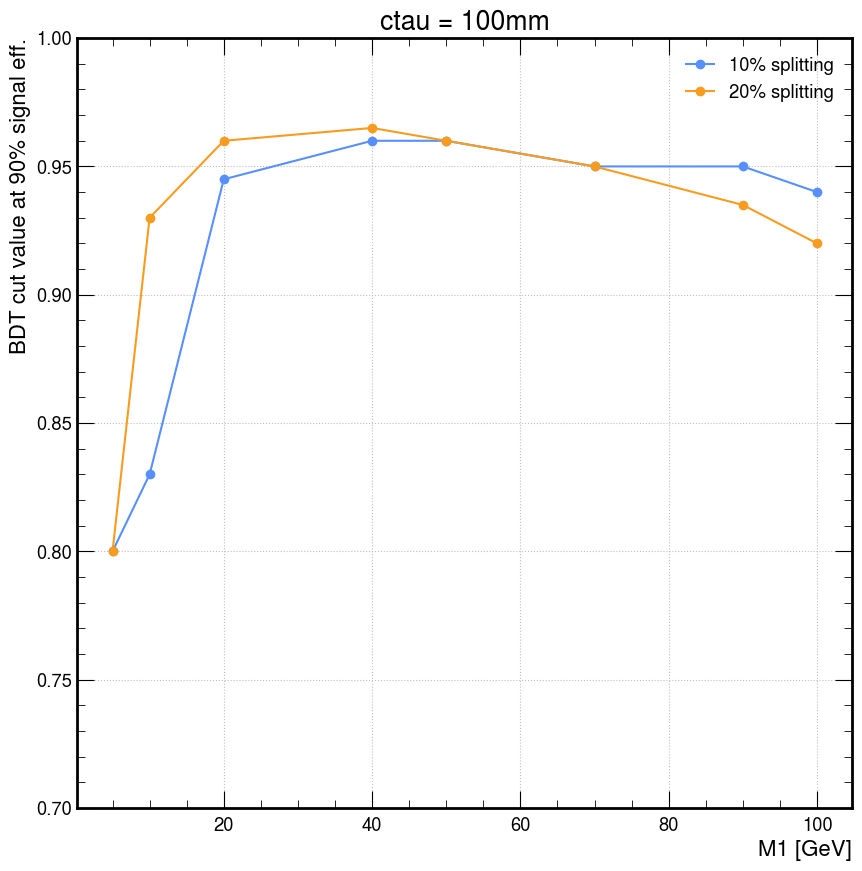

In [59]:
for ct in [1,10,100]:
    plt.plot(m1s, list_cut['0.1'][str(ct)], '-o', label=f'10% splitting')
    plt.plot(m1s, list_cut['0.2'][str(ct)], '-o', label=f'20% splitting')
    
    plt.ylim([0.7,1])
    
    plt.ylabel('BDT cut value at 90% signal eff.')
    plt.xlabel('M1 [GeV]')
    
    plt.title(f'ctau = {ct}mm')
    plt.legend()

    plt.grid()

    plt.show()

In [60]:
bkg_bdt_eff

[0.11270135193651562,
 0.10953078780716684,
 0.10701422503485968,
 0.1045144938308697,
 0.10170495563589028,
 0.0995116528640888,
 0.09770338555113225,
 0.09534534109608221,
 0.09316128364341691,
 0.09042414515445106,
 0.08773187008317986,
 0.08539978086660945,
 0.08300872917470459,
 0.07968053705144218,
 0.07738717797567658,
 0.07541055718804694,
 0.0735672572771437,
 0.07082127430968062,
 0.06705627079132856,
 0.06409345333606647,
 0.060562177861498215,
 0.058261282900725284,
 0.05436057588289252,
 0.05092066145977615,
 0.04748075361506924,
 0.04513080781743525,
 0.04237084298438161,
 0.03703091462553929,
 0.03160745815048088,
 0.028143791076868645,
 0.02165157178081685,
 0.016956773305456394,
 0.013896262075795529,
 0.010945173191104178,
 0.009324597065135422,
 0.005347654020671094,
 0.003590833896637308,
 0.0029610047132910718,
 0.0]

Text(0.5, 1.0, 'Total background')

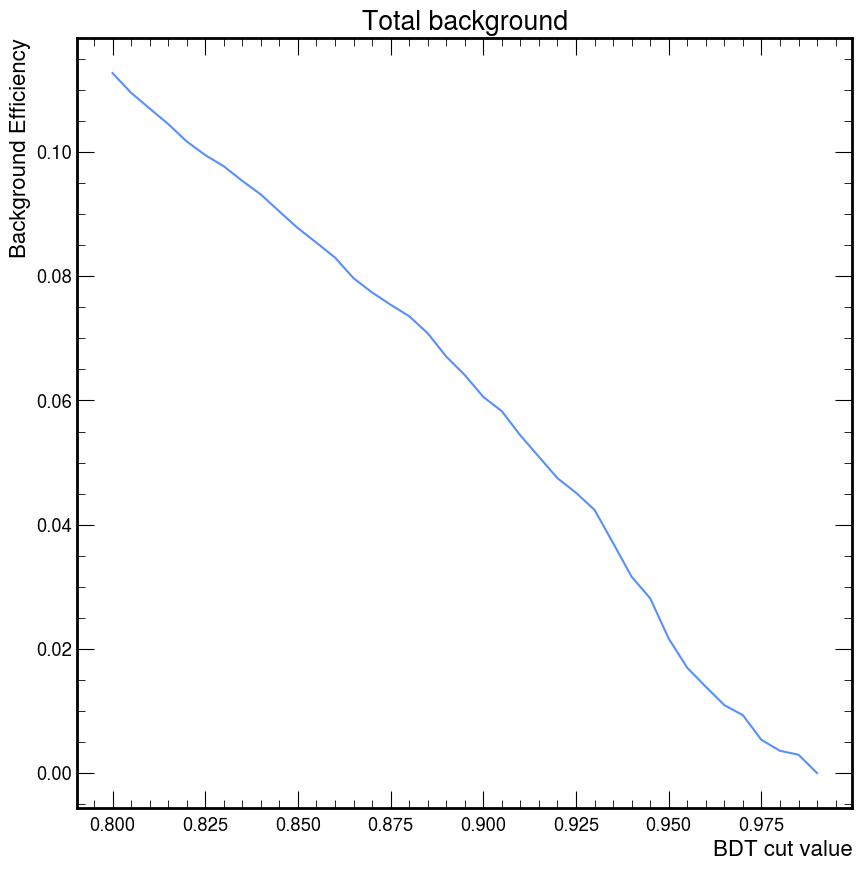

In [61]:
plt.plot(range_bdt_scan, bkg_bdt_eff)

plt.xlabel('BDT cut value')
plt.ylabel('Background Efficiency')

plt.title('Total background')

Text(0.5, 1.0, 'Total background')

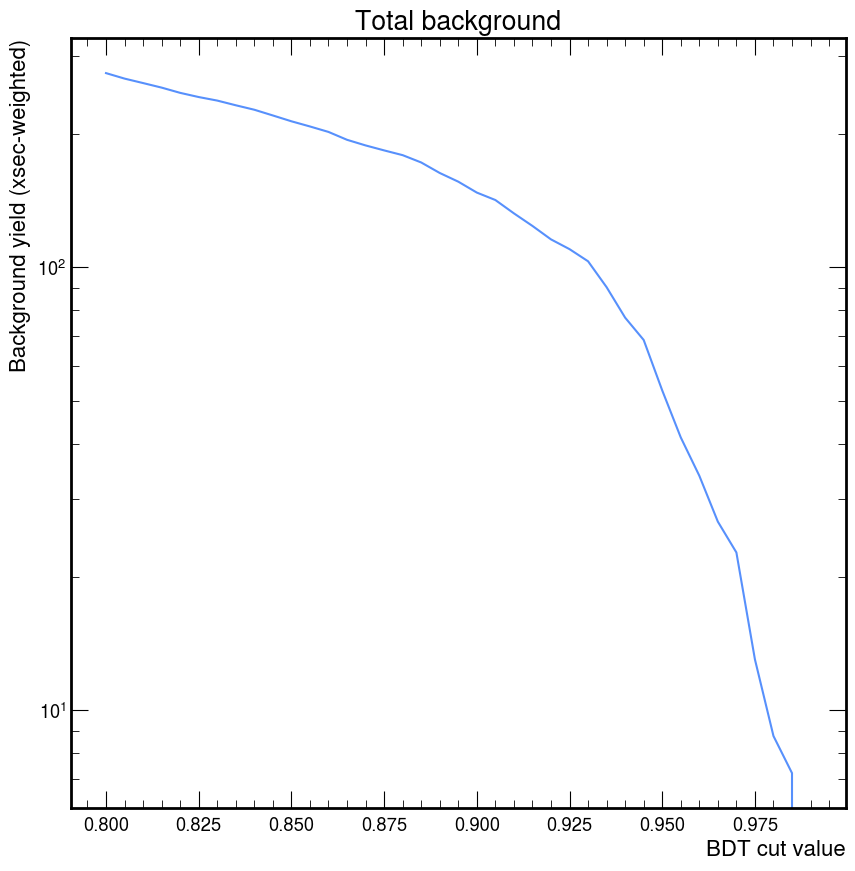

In [62]:
plt.plot(range_bdt_scan, bkg_As)

plt.xlabel('BDT cut value')
plt.ylabel('Background yield (xsec-weighted)')

#plt.ylim([0,500])
plt.yscale('log')
plt.title('Total background')

In [63]:
bkg_As

[274.60082737356424,
 266.8756358101964,
 260.74394166865386,
 254.6532582382206,
 247.80771912424825,
 242.46365939942189,
 238.0577521789819,
 232.31229352019727,
 226.99076034221798,
 220.3216256708838,
 213.76180230244063,
 208.07958449958824,
 202.25370254158042,
 194.14444479974918,
 188.5565943538677,
 183.74048794200644,
 179.2492225584574,
 172.5585380026605,
 163.38497385778464,
 156.16596440854482,
 147.5618869033642,
 141.95567500730976,
 132.45146448956802,
 124.06999141536653,
 115.6885343696922,
 109.96280837594531,
 103.23805651045404,
 90.22713232669048,
 77.0126889355015,
 68.57334168883972,
 52.754819909343496,
 41.315777488518506,
 33.85873370501213,
 26.668301332509145,
 22.719710323028266,
 13.02974803186953,
 8.749193705618382,
 7.214592639356852,
 0.0]

In [64]:
s_over_b_max_idx = {}
s_over_b_max = {}
s_over_bs = {}

In [65]:
for sig_point, yield_list in sig_As.items():
    s_over_b = np.array(yield_list)/np.sqrt(bkg_As)
    s_over_bs[sig_point] = s_over_b

    print(sig_point)
    print(f'{np.argmax(s_over_b)}, {s_over_b[np.argmax(s_over_b)]:.3f}')

    s_over_b_max_idx[sig_point] = np.argmax(s_over_b)
    s_over_b_max[sig_point] = s_over_b[np.argmax(s_over_b)]

sig_2018_Mchi-5p25_dMchi-0p5_ctau-1
38, nan
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10
38, nan
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100
38, nan
sig_2018_Mchi-5p5_dMchi-1p0_ctau-1
38, nan
sig_2018_Mchi-5p5_dMchi-1p0_ctau-10
38, nan
sig_2018_Mchi-5p5_dMchi-1p0_ctau-100
38, nan
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1
38, nan
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10
38, nan
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100
38, nan
sig_2018_Mchi-11p0_dMchi-2p0_ctau-1
38, nan
sig_2018_Mchi-11p0_dMchi-2p0_ctau-10
38, nan
sig_2018_Mchi-11p0_dMchi-2p0_ctau-100
38, nan
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1
38, nan
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10
38, nan
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100
38, nan
sig_2018_Mchi-22p0_dMchi-4p0_ctau-1
38, nan
sig_2018_Mchi-22p0_dMchi-4p0_ctau-10
38, nan
sig_2018_Mchi-22p0_dMchi-4p0_ctau-100
38, nan
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1
38, nan
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10
38, nan
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100
38, nan
sig_2018_Mchi-44p0_dMchi-8p0_ctau-1
38, nan
sig_2018_Mchi-

In [66]:
s_over_bs

{'sig_2018_Mchi-5p25_dMchi-0p5_ctau-1': array([550.50949158, 558.42039106, 564.94818628, 570.55540473,
        578.38234419, 583.58636747, 586.67058561, 593.88093311,
        598.45558535, 605.05955319, 611.85539123, 616.47046819,
        624.04443918, 631.86996137, 639.87356399, 645.59436637,
        650.99687365, 659.46405205, 673.57371244, 681.87921604,
        695.65492613, 704.8008695 , 721.97571526, 742.78767305,
        754.4165413 , 756.93670648, 763.7797257 , 787.22181353,
        825.8927111 , 824.00508794, 878.65105104, 885.59415519,
        881.09926435, 835.24846964, 745.4440516 , 641.54242804,
        561.82742914, 486.94375601,          nan]),
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-10': array([28.41247713, 28.82076846, 29.15767606, 29.34083978, 29.74334052,
        29.98536118, 30.17663847, 30.54751789, 30.81687266, 31.19171558,
        31.57684665, 31.82371776, 32.27880214, 32.94603579, 33.43064743,
        33.67191381, 33.89576636, 34.24818702, 34.88972508, 35.26839944,
 

In [67]:
range_bdt_scan

[0.8,
 0.805,
 0.81,
 0.8150000000000001,
 0.8200000000000001,
 0.8250000000000001,
 0.8300000000000001,
 0.8350000000000001,
 0.8400000000000001,
 0.8450000000000001,
 0.8500000000000001,
 0.8550000000000001,
 0.8600000000000001,
 0.8650000000000001,
 0.8700000000000001,
 0.8750000000000001,
 0.8800000000000001,
 0.8850000000000001,
 0.8900000000000001,
 0.8950000000000001,
 0.9000000000000001,
 0.9050000000000001,
 0.9100000000000001,
 0.9150000000000001,
 0.9200000000000002,
 0.9250000000000002,
 0.9300000000000002,
 0.9350000000000002,
 0.9400000000000002,
 0.9450000000000002,
 0.9500000000000002,
 0.9550000000000002,
 0.9600000000000002,
 0.9650000000000002,
 0.9700000000000002,
 0.9750000000000002,
 0.9800000000000002,
 0.9850000000000002,
 0.9900000000000002]

In [68]:
range_bdt_scan[-7]

0.9600000000000002

In [69]:
range_bdt_scan[-3]

0.9800000000000002

In [70]:
list_cut = {}

for delta in deltas:
    list_cut[str(delta)] = {}
    for ctau in ctaus:
        list_cut[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            list_cut[str(delta)][str(ctau)].append(range_bdt_scan[s_over_b_max_idx[samp]])

sig_2018_Mchi-5p25_dMchi-0p5_ctau-1
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1
sig_2018_Mchi-52p5_dMchi-5p0_ctau-1
sig_2018_Mchi-73p5_dMchi-7p0_ctau-1
sig_2018_Mchi-94p5_dMchi-9p0_ctau-1
sig_2018_Mchi-105p0_dMchi-10p0_ctau-1


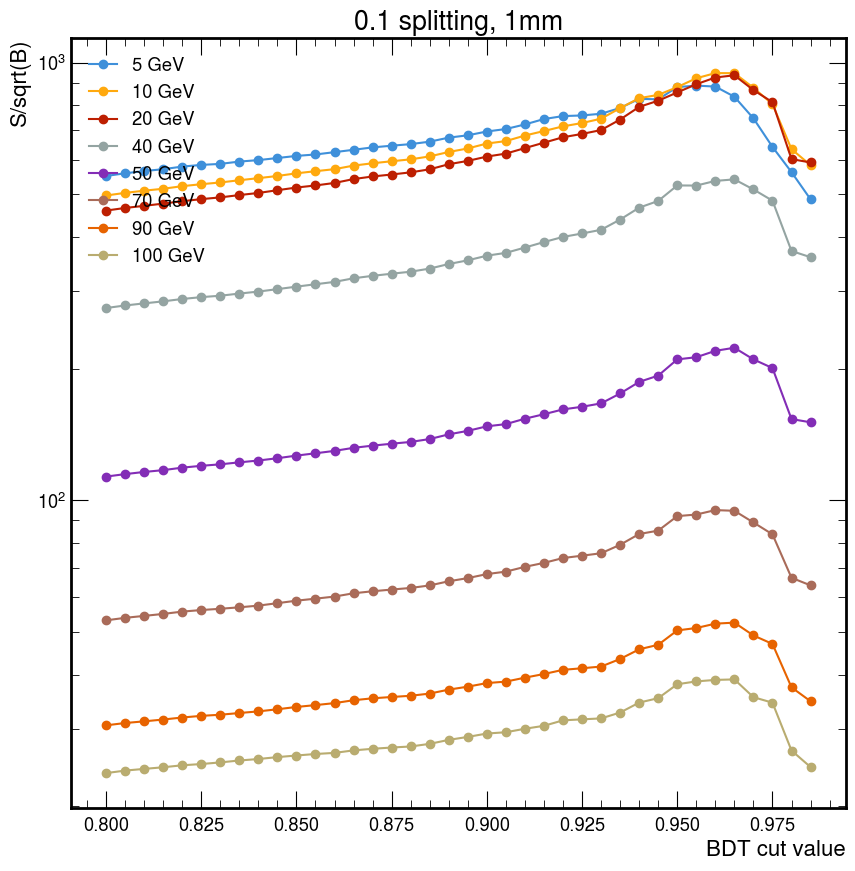

sig_2018_Mchi-5p5_dMchi-1p0_ctau-1
sig_2018_Mchi-11p0_dMchi-2p0_ctau-1
sig_2018_Mchi-22p0_dMchi-4p0_ctau-1
sig_2018_Mchi-44p0_dMchi-8p0_ctau-1
sig_2018_Mchi-55p0_dMchi-10p0_ctau-1
sig_2018_Mchi-77p0_dMchi-14p0_ctau-1
sig_2018_Mchi-99p0_dMchi-18p0_ctau-1
sig_2018_Mchi-110p0_dMchi-20p0_ctau-1


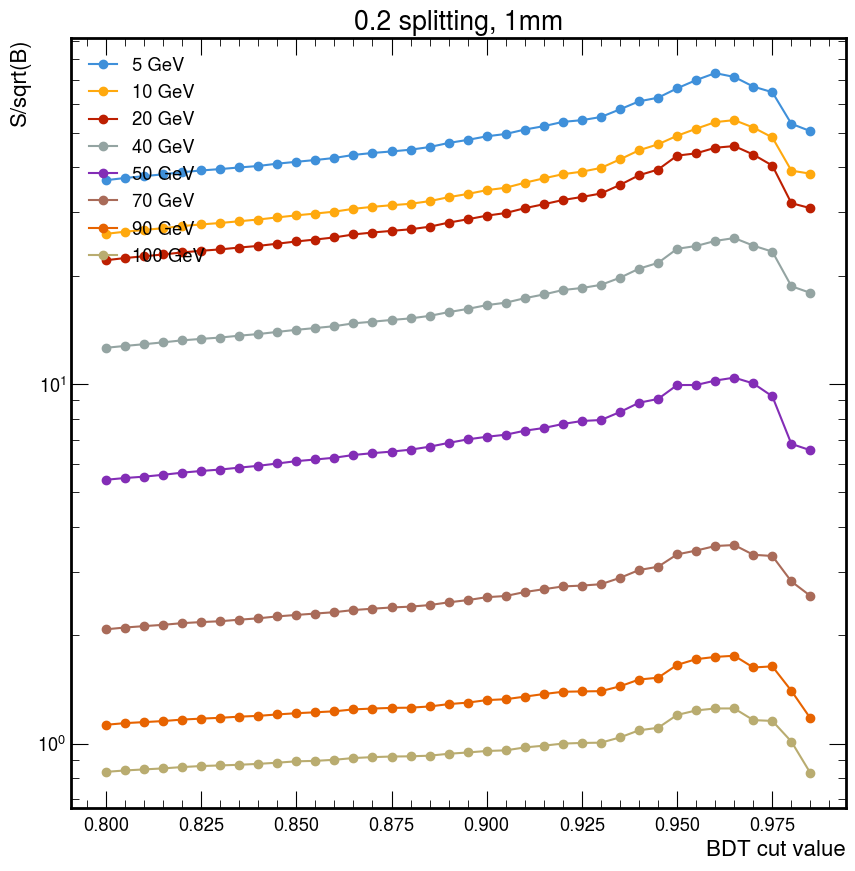

sig_2018_Mchi-5p25_dMchi-0p5_ctau-10
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10
sig_2018_Mchi-52p5_dMchi-5p0_ctau-10
sig_2018_Mchi-73p5_dMchi-7p0_ctau-10
sig_2018_Mchi-94p5_dMchi-9p0_ctau-10
sig_2018_Mchi-105p0_dMchi-10p0_ctau-10


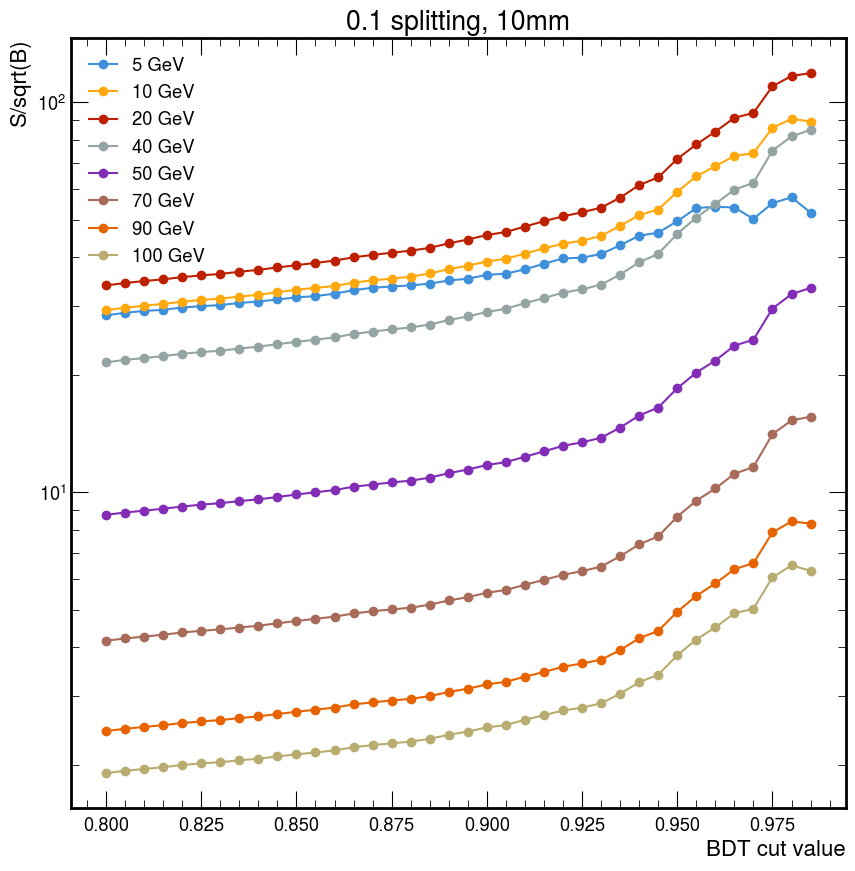

sig_2018_Mchi-5p5_dMchi-1p0_ctau-10
sig_2018_Mchi-11p0_dMchi-2p0_ctau-10
sig_2018_Mchi-22p0_dMchi-4p0_ctau-10
sig_2018_Mchi-44p0_dMchi-8p0_ctau-10
sig_2018_Mchi-55p0_dMchi-10p0_ctau-10
sig_2018_Mchi-77p0_dMchi-14p0_ctau-10
sig_2018_Mchi-99p0_dMchi-18p0_ctau-10
sig_2018_Mchi-110p0_dMchi-20p0_ctau-10


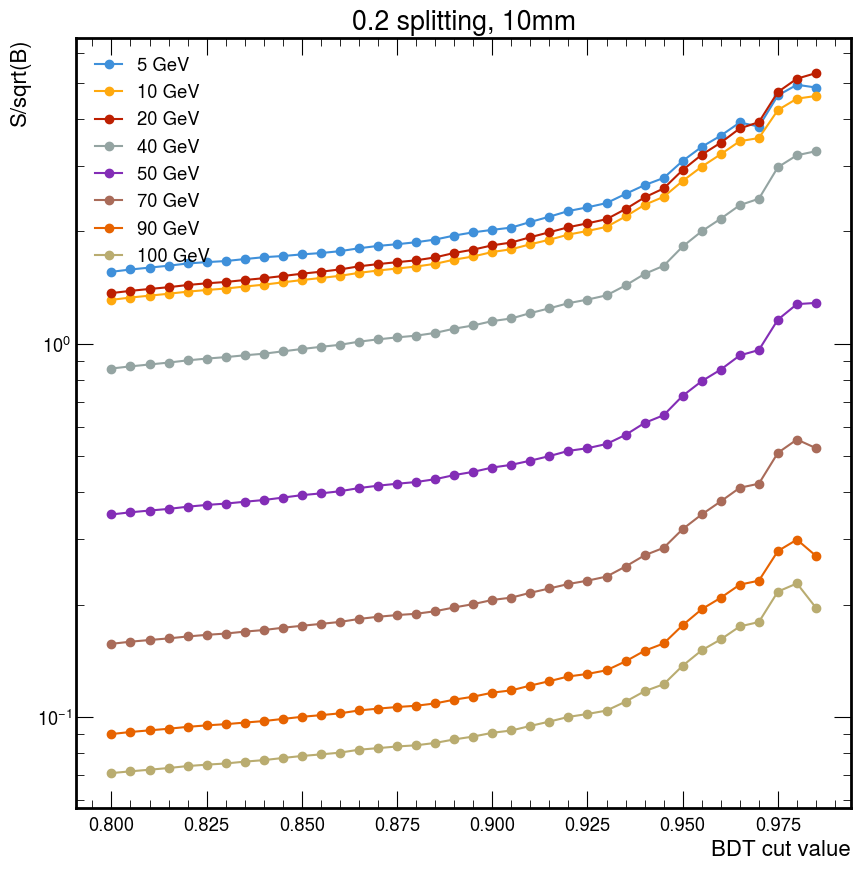

sig_2018_Mchi-5p25_dMchi-0p5_ctau-100
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100
sig_2018_Mchi-52p5_dMchi-5p0_ctau-100
sig_2018_Mchi-73p5_dMchi-7p0_ctau-100
sig_2018_Mchi-94p5_dMchi-9p0_ctau-100
sig_2018_Mchi-105p0_dMchi-10p0_ctau-100


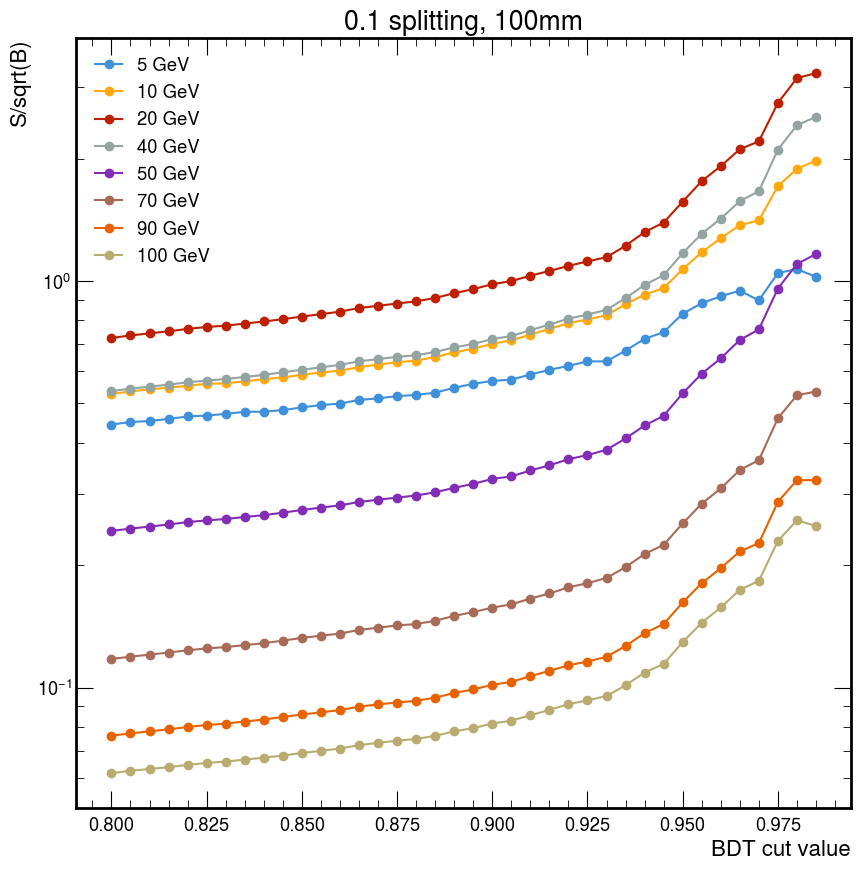

sig_2018_Mchi-5p5_dMchi-1p0_ctau-100
sig_2018_Mchi-11p0_dMchi-2p0_ctau-100
sig_2018_Mchi-22p0_dMchi-4p0_ctau-100
sig_2018_Mchi-44p0_dMchi-8p0_ctau-100
sig_2018_Mchi-55p0_dMchi-10p0_ctau-100
sig_2018_Mchi-77p0_dMchi-14p0_ctau-100
sig_2018_Mchi-99p0_dMchi-18p0_ctau-100
sig_2018_Mchi-110p0_dMchi-20p0_ctau-100


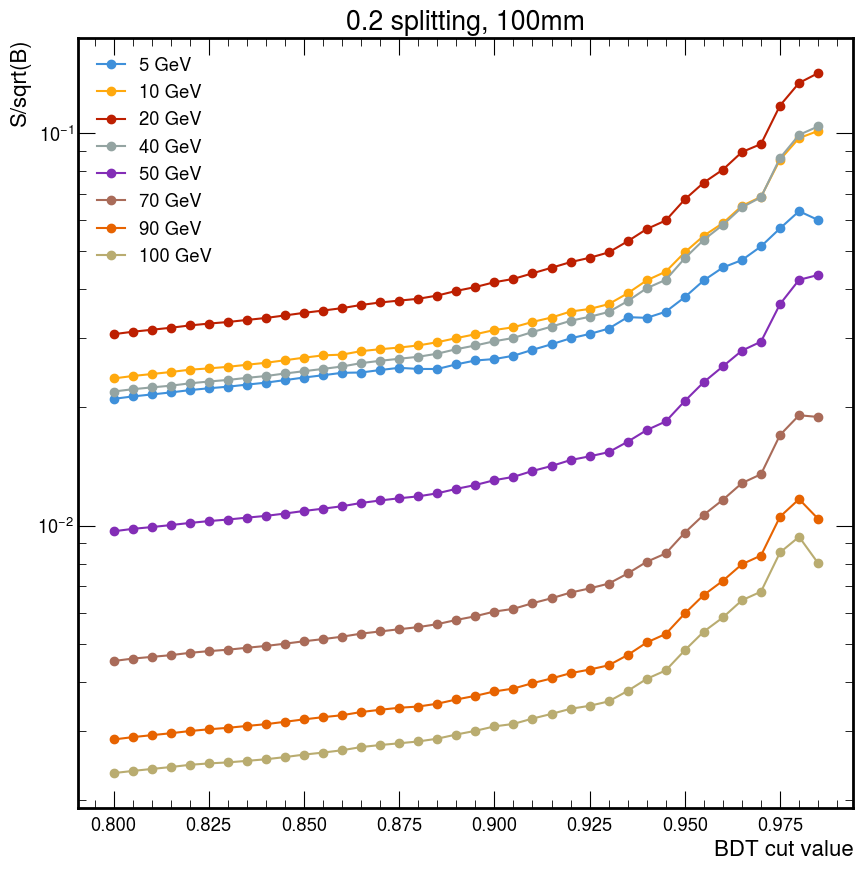

In [71]:
cmap = ["#3f90da", "#ffa90e", "#bd1f01", "#94a4a2", "#832db6", "#a96b59", "#e76300", "#b9ac70", "#717581", "#92dadd"]

for ct in [1,10,100]:
    for delta in deltas:
        for idx, m1 in enumerate(m1s):
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ct)]
            samp = samp_df.name[0]
            print(samp)
            
            plt.plot(range_bdt_scan[:-1], s_over_bs[samp][:-1], '-o', label=f'{m1} GeV', color=cmap[idx])
            
            plt.ylabel('S/sqrt(B)')
            plt.xlabel('BDT cut value')
            
            plt.title(f'{delta} splitting, {ct}mm')
        
            plt.grid()

            plt.yscale('log')
            plt.legend(loc=2)
        plt.show()

In [72]:
import mplhep as hep

In [ ]:
cmap = ["#3f90da", "#ffa90e", "#bd1f01", "#94a4a2", "#832db6", "#a96b59", "#e76300", "#b9ac70", "#717581", "#92dadd"]

for ct in [1,10,100]:
    fig,axes = plt.subplots(figsize=(7,7))
    for delta in deltas:
        for m1 in [10,40,90]:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ct)]
            samp = samp_df.name[0]
            print(samp)
            
#            plt.plot(range_bdt_scan[100:-15], s_over_bs[samp][100:-15], '-o', label=f'{m1} GeV', color=cmap[idx])
            plt.plot(range_bdt_scan[100:-16], s_over_bs[samp][100:-16], '-', label=f'{m1} GeV, {int(delta*100)}%, {ct}mm')

            
            plt.ylabel(r"$S/\sqrt{B}$")
            plt.xlabel('BDT cut value')
            
            #plt.title(f'{delta} splitting, {ct}mm')
        
            plt.grid()

            plt.yscale('log')
            plt.legend(loc=2, ncol=2)

    ymin, ymax = axes.get_ylim()
    plt.ylim([ymin, ymax*3])
    hep.cms.label('', data=False, llabel='Private Work', rlabel='')

    plt.savefig(f'plots/bdt_{ct}_sig_scan.pdf', bbox_inches = "tight")
    plt.show()

In [ ]:
#bdt_WP_idx = 260
#bdt_WP_idx = 255

In [ ]:
#bdt_tightWP_idx = 285

In [72]:
bdt_WP_idx = -7
bdt_tightWP_idx = -3

In [73]:
range_bdt_scan[bdt_tightWP_idx]

0.9800000000000002

In [74]:
range_bdt_scan[bdt_WP_idx]

0.9600000000000002

In [75]:
bkg_As[bdt_WP_idx]

33.85873370501213

In [76]:
bkg_As[bdt_tightWP_idx]

8.749193705618382

In [77]:
bkg_eff_bdtWP = bkg_As[bdt_WP_idx]/bkg_ABs[bdt_WP_idx]
#bkg_eff_bdtWP = (bkg_As[bdt_WP_idx]-bkg_As[bdt_tightWP_idx])/(bkg_ABs[bdt_WP_idx])
bkg_eff_bdtLooseWP = (bkg_As[bdt_WP_idx]-bkg_As[bdt_tightWP_idx])/(bkg_ABs[bdt_WP_idx])
bkg_eff_bdtTightWP = bkg_As[bdt_tightWP_idx]/bkg_ABs[bdt_tightWP_idx]

In [78]:
bkg_eff_bdtWP

0.013896262075795529

In [79]:
1-bkg_eff_bdtWP

0.9861037379242045

In [80]:
sig_eff_bdtTightWP = {}

for delta in deltas:
    sig_eff_bdtTightWP[str(delta)] = {}
    for ctau in ctaus:
        sig_eff_bdtTightWP[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            sig_eff_bdtTightWP[str(delta)][str(ctau)].append(sig_As[samp][bdt_tightWP_idx]/sig_ABs[samp][bdt_tightWP_idx])

In [81]:
sig_As

{'sig_2018_Mchi-5p25_dMchi-0p5_ctau-1': [9122.539068222046,
  9122.539068222046,
  9122.539068222046,
  9104.842599868774,
  9104.842599868774,
  9087.166091918945,
  9051.81102180481,
  9051.81102180481,
  9016.459045410156,
  8981.041145324707,
  8945.689960479736,
  8892.564270019531,
  8874.905920028687,
  8804.205966949463,
  8786.482141494751,
  8751.090288162231,
  8715.805765151978,
  8662.82124710083,
  8609.762786865234,
  8521.197807312012,
  8450.471956253052,
  8397.360748291016,
  8309.042339324951,
  8273.667505264282,
  8114.39905166626,
  7937.476959228516,
  7760.470209121704,
  7477.659698486328,
  7247.776239395142,
  6823.505567550659,
  6381.863416671753,
  5692.36456489563,
  5126.963132858276,
  4313.336748123169,
  3553.1737785339355,
  2315.759168624878,
  1661.8313751220703,
  1307.9306240081787,
  0.0],
 'sig_2018_Mchi-5p25_dMchi-0p5_ctau-10': [470.82554733753204,
  470.82554733753204,
  470.82554733753204,
  468.21697890758514,
  468.21697890758514,
  466.9

In [82]:
sig_eff_bdtWP = {}

for delta in deltas:
    sig_eff_bdtWP[str(delta)] = {}
    for ctau in ctaus:
        sig_eff_bdtWP[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            sig_eff_bdtWP[str(delta)][str(ctau)].append(sig_As[samp][bdt_WP_idx]/sig_ABs[samp][bdt_WP_idx])

In [83]:
sig_eff_bdtLooseWP = {}

for delta in deltas:
    sig_eff_bdtLooseWP[str(delta)] = {}
    for ctau in ctaus:
        sig_eff_bdtLooseWP[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            sig_eff_bdtLooseWP[str(delta)][str(ctau)].append((sig_As[samp][bdt_WP_idx]-sig_As[samp][bdt_tightWP_idx])/sig_ABs[samp][bdt_WP_idx])

In [84]:
sig_eff_bdtTightWP

{'0.1': {'1': [0.17152884819314465,
   0.22183764576258225,
   0.22845651124549768,
   0.23423969336869988,
   0.23377236812805766,
   0.21065817014309238,
   0.20237334278561178,
   0.18115239288019575],
  '10': [0.32899536856234807,
   0.5351843098156408,
   0.6004507958369628,
   0.6647687854630782,
   0.6455624730145779,
   0.6356917451379943,
   0.5915614104589816,
   0.5825130186708041],
  '100': [0.3649866812730336,
   0.580601309465667,
   0.7328001373925312,
   0.774495863226907,
   0.7809383212734693,
   0.7590768310824827,
   0.7304086384160209,
   0.7189502339497538]},
 '0.2': {'1': [0.24842550573770222,
   0.2626331062549775,
   0.25405782864691934,
   0.25668937724451485,
   0.2189303382949006,
   0.22479634140474808,
   0.19407668043348397,
   0.18572456830745143],
  '10': [0.5399070791652586,
   0.6013981138732176,
   0.6616658321515503,
   0.6528363255404986,
   0.63936131963253,
   0.6096063737567801,
   0.563417338358733,
   0.5367826759382327],
  '100': [0.475307106

In [85]:
sig_eff_bdtWP

{'0.1': {'1': [0.5291885170017917,
   0.6509371336439213,
   0.6903415399759171,
   0.6662263442619751,
   0.6584934036887415,
   0.5916287346321759,
   0.5565307416607305,
   0.5166019681050908],
  '10': [0.612126572147419,
   0.7960233332077533,
   0.8505134967884215,
   0.8781380237420927,
   0.8582726594253715,
   0.8369785875349773,
   0.8067170269015241,
   0.7948534208357774],
  '100': [0.616190466173086,
   0.771971364778365,
   0.8757049390542913,
   0.8973078188828424,
   0.9008580605210461,
   0.8804738765520036,
   0.8729535831918864,
   0.8630870348522377]},
 '0.2': {'1': [0.6760616015226635,
   0.7048639204922686,
   0.7126887806423788,
   0.6747478119229363,
   0.6459702658595442,
   0.5547411777235282,
   0.47428716641535557,
   0.4516331112910298],
  '10': [0.7759778691564108,
   0.8397463714311405,
   0.8771128000970518,
   0.8683747259218894,
   0.8400708094211051,
   0.8189072152673723,
   0.7743670308526048,
   0.7477337128272846],
  '100': [0.671981566106692,
   0

In [86]:
bkg_eff_bdtWP

0.013896262075795529

In [87]:
bkg_eff_bdtTightWP

0.003590833896637308

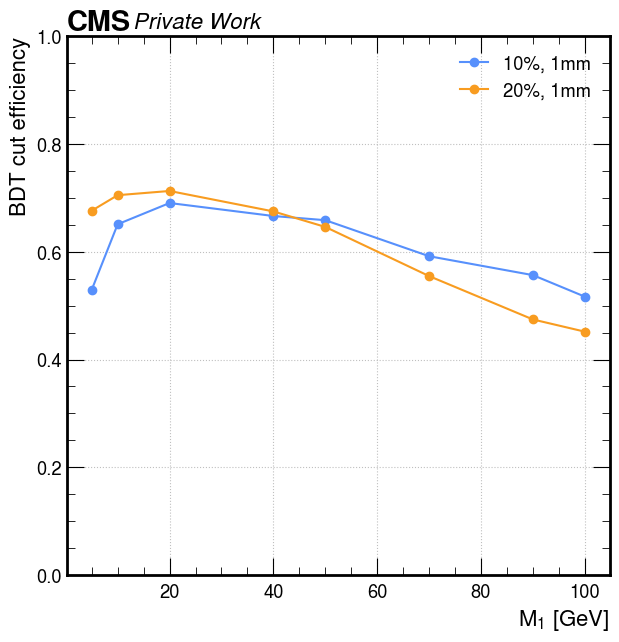

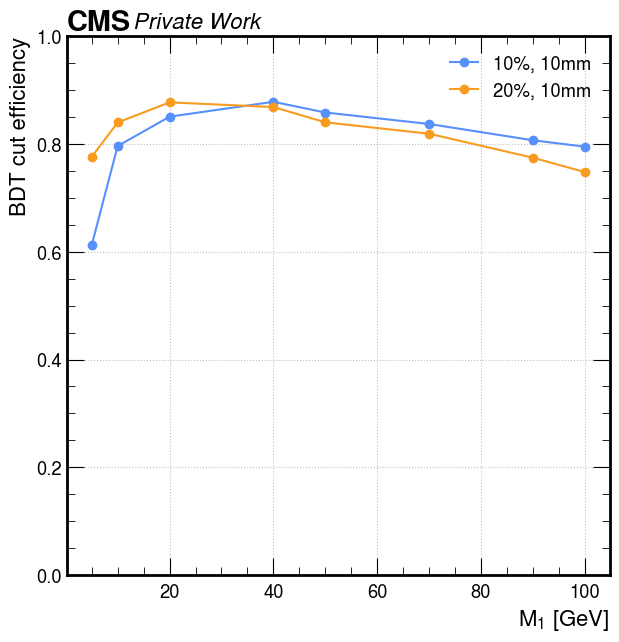

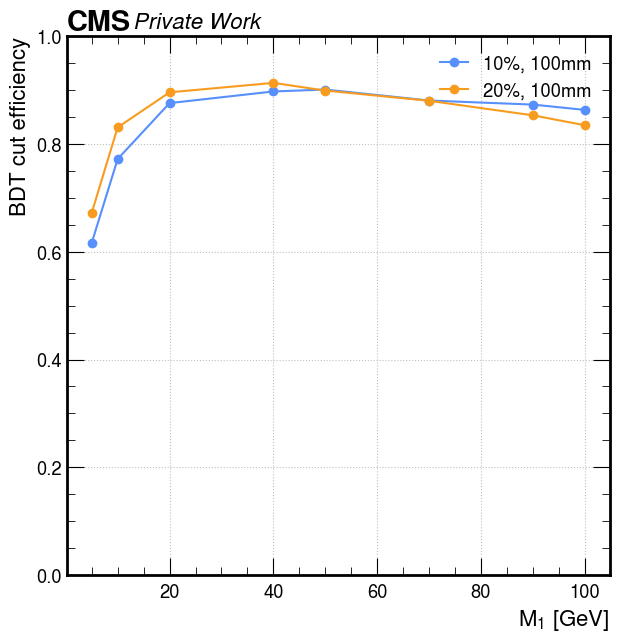

In [90]:
for ct in [1,10,100]:
    fig,axes = plt.subplots(figsize=(7,7))
    for delta in [0.1,0.2]:
        plt.plot(m1s, sig_eff_bdtWP[str(delta)][str(ct)], '-o', label=f'{int(delta*100)}%, {ct}mm')
            
        plt.ylabel('BDT cut efficiency')
        plt.xlabel(r"$M_{1}$ [GeV]")

        plt.ylim([0,1])

        #plt.title(f'Signal: {ct}mm')
        plt.legend(loc=1)
    hep.cms.label('', data=False, llabel='Private Work', rlabel='')

    plt.grid()

    #plt.savefig(f'plots/bdt_{ct}_sig_eff.pdf', bbox_inches = "tight")
    plt.show()

In [ ]:
for ct in [1,10,100]:
    fig,axes = plt.subplots(figsize=(7,7))
    for delta in [0.1,0.2]:
        plt.plot(m1s, sig_eff_bdtTightWP[str(delta)][str(ct)], '-o', label=f'{int(delta*100)}%, {ct}mm')
            
        plt.ylabel('BDT cut efficiency')
        plt.xlabel(r"$M_{1}$ [GeV]")

        plt.ylim([0,1])

        #plt.title(f'Signal: {ct}mm')
        plt.legend(loc=1)
    hep.cms.label('', data=False, llabel='Private Work', rlabel='')

    plt.grid()

    plt.savefig(f'plots/bdt_{ct}_tight_sig_eff.png', bbox_inches = "tight")
    plt.show()

In [ ]:
for ct in [1,10,100]:
    fig,axes = plt.subplots(figsize=(7,7))
    for delta in [0.1,0.2]:
        plt.plot(m1s, sig_eff_bdtWP[str(delta)][str(ct)], '-o', label=f'Loose; {int(delta*100)}%, {ct}mm')
        plt.plot(m1s, sig_eff_bdtTightWP[str(delta)][str(ct)], '-o', label=f'Tight; {int(delta*100)}%, {ct}mm',linestyle='dashed')
            
        plt.ylabel('BDT cut efficiency')
        plt.xlabel(r"$M_{1}$ [GeV]")

        plt.ylim([0,1])

        #plt.title(f'Signal: {ct}mm')
        plt.legend(loc=1)
    hep.cms.label('', data=False, llabel='Private Work', rlabel='')

    plt.grid()

    #plt.savefig(f'plots/bdt_{ct}_sig_eff.pdf', bbox_inches = "tight")
    plt.show()

In [ ]:
for ct in [1,10,100]:
    for delta in [0.1,0.2]:
        fig,axes = plt.subplots(figsize=(7,7))
        plt.plot(m1s, sig_eff_bdtWP[str(delta)][str(ct)], '-o', label=f'[0.96,1]; {int(delta*100)}%, {ct}mm')
        plt.plot(m1s, sig_eff_bdtLooseWP[str(delta)][str(ct)], '-o', label=f'Loose [0.96,0.98]; {int(delta*100)}%, {ct}mm',linestyle='dashed')
        plt.plot(m1s, sig_eff_bdtTightWP[str(delta)][str(ct)], '-o', label=f'Tight [0.98,1]; {int(delta*100)}%, {ct}mm',linestyle='dashed')
            
        plt.ylabel('BDT cut efficiency')
        plt.xlabel(r"$M_{1}$ [GeV]")

        plt.ylim([0,1])

        #plt.title(f'Signal: {ct}mm')
        plt.legend(loc=1)
        hep.cms.label('', data=False, llabel='Private Work', rlabel='')
    
        plt.grid()
        plt.title(rf"$\Delta$={delta}, {ct}mm", position=(0.8, 0.5))
    
        #plt.savefig(f'plots/bdt_{ct}_sig_eff.pdf', bbox_inches = "tight")
        plt.show()

In [39]:
yield_SR_incl = {}
yield_SR_tight = {}
yield_SR_loose = {}

for delta in deltas:
    yield_SR_incl[str(delta)] = {}
    yield_SR_tight[str(delta)] = {}
    yield_SR_loose[str(delta)] = {}
    for ctau in ctaus:
        yield_SR_incl[str(delta)][str(ctau)] = []
        yield_SR_tight[str(delta)][str(ctau)] = []
        yield_SR_loose[str(delta)][str(ctau)] = []
        for m1 in m1s:
            samp_df = si[(si.m1 == m1) & (si.delta == delta) & (si.ctau == ctau)]
            samp = samp_df.name[0]

            yield_SR_incl[str(delta)][str(ctau)].append(sig_As[samp][bdt_WP_idx])
            yield_SR_tight[str(delta)][str(ctau)].append(sig_As[samp][bdt_tightWP_idx])
            yield_SR_loose[str(delta)][str(ctau)].append(sig_As[samp][bdt_WP_idx] - sig_As[samp][bdt_tightWP_idx])

In [44]:
samp_df = si[(si.m1 == 10) & (si.delta == 0.1) & (si.ctau == 1)]
samp = samp_df.name[0]

sig_As[samp][bdt_WP_idx]

5503.072615623474

In [45]:
yield_SR_incl

{'0.1': {'1': [5126.963132858276,
   5503.072615623474,
   5377.291916131973,
   3121.6014766693115,
   1277.1691190302372,
   552.6470804512501,
   304.14469066634774,
   226.23804688453674],
  '10': [313.8231108188629,
   398.63511288166046,
   488.9937110841274,
   319.143007427454,
   126.56787721812725,
   59.47451755031943,
   33.947162673575804,
   26.18805081443861],
  '100': [5.339857645332813,
   7.42048916593194,
   11.154479743912816,
   8.28410274302587,
   3.7576378430239856,
   1.7976234452798963,
   1.1447556141065434,
   0.916141983034322]},
 '0.2': {'1': [425.6844488978386,
   311.0355914533138,
   263.9607742279768,
   145.35356137529016,
   59.45005163550377,
   20.61259187106043,
   10.13408219779376,
   7.285338872345164],
  '10': [21.004182644188404,
   18.7330314014107,
   20.116219711489975,
   12.586414982099086,
   4.962869999930263,
   2.2013629416469485,
   1.2146043874381576,
   0.9396136966097401],
  '100': [0.264441286213696,
   0.3431233004666865,
   0.

In [40]:
bkg_SR_incl = bkg_As[bdt_WP_idx]
bkg_SR_tight = bkg_As[bdt_tightWP_idx]
bkg_SR_loose = bkg_SR_incl - bkg_SR_tight

bkg_SR_tight

8.749193705618382

In [46]:
bkg_SR_incl

33.85873370501213

In [89]:
import mplhep as hep

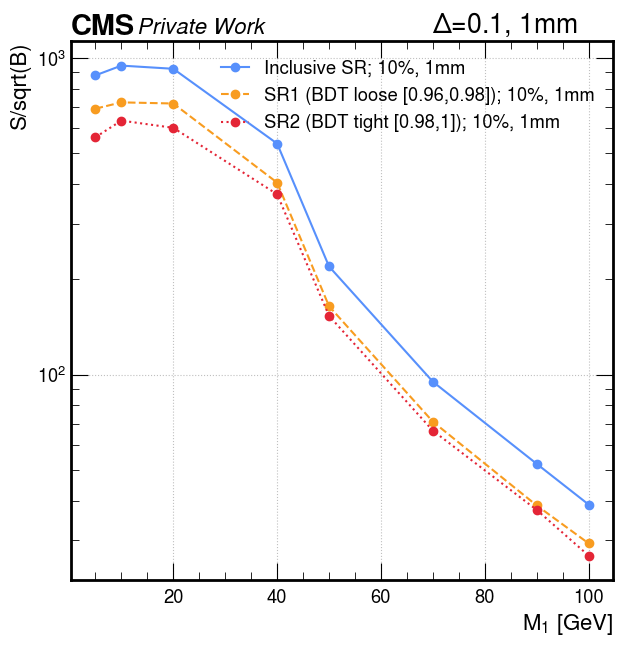

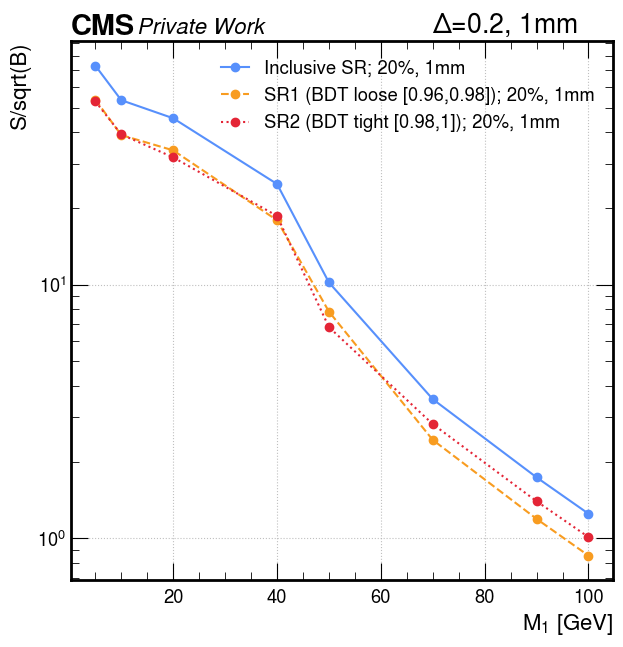

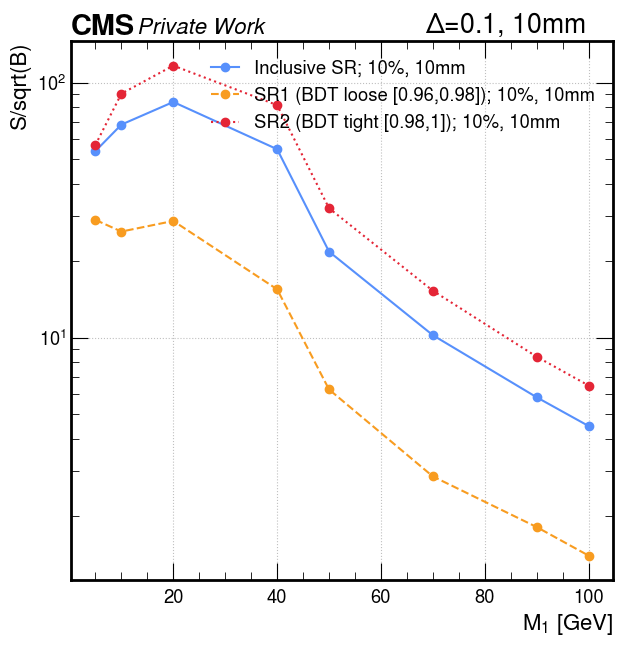

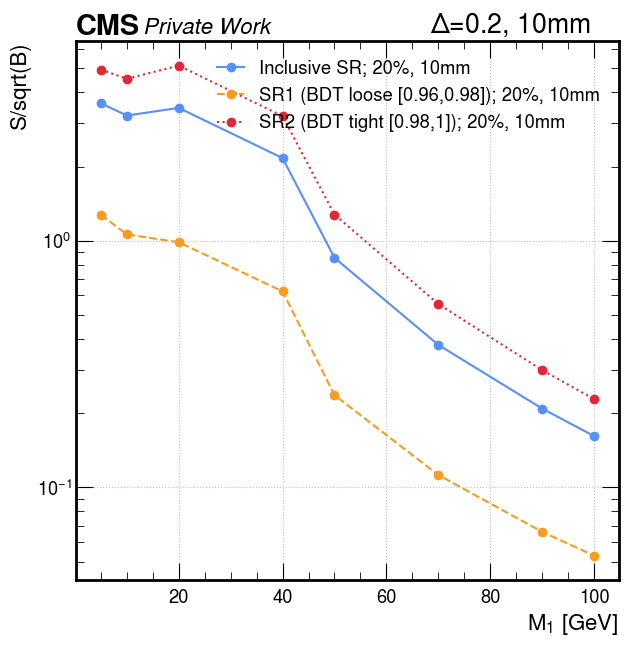

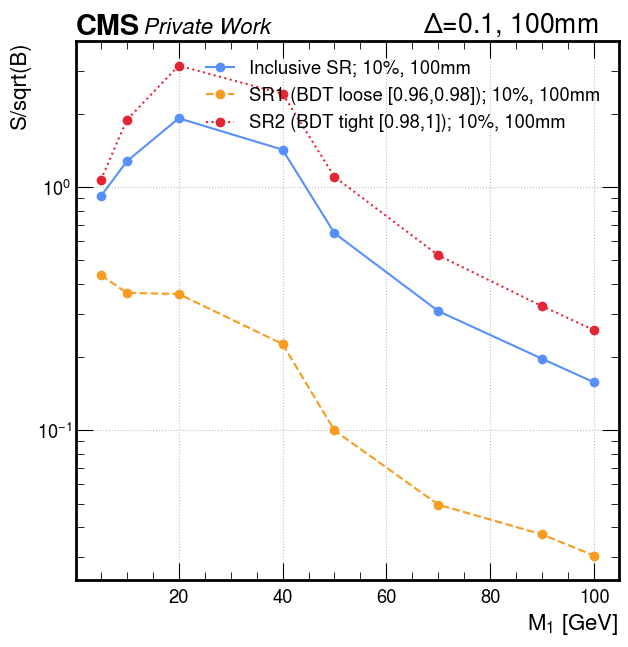

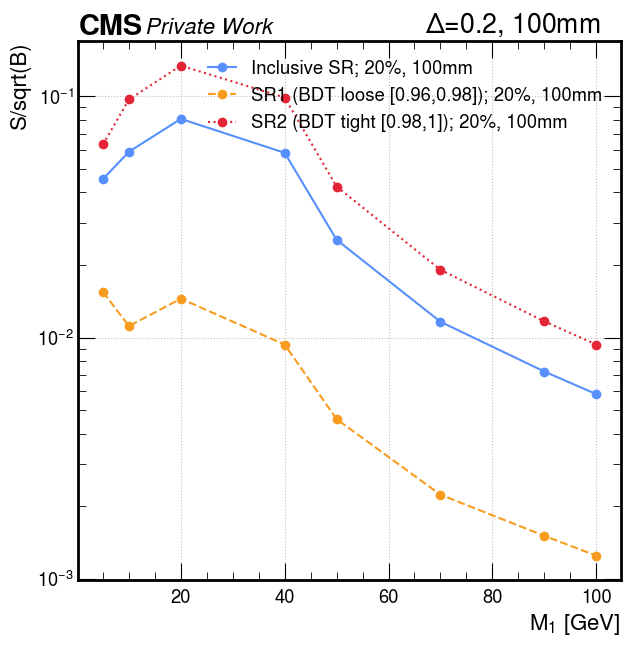

In [47]:
for ct in [1,10,100]:
    for delta in [0.1,0.2]:
        fig,axes = plt.subplots(figsize=(7,7))
        
        hep.cms.label('', data=False, llabel='Private Work', rlabel='')
        
        plt.plot(m1s, yield_SR_incl[str(delta)][str(ct)]/np.sqrt(bkg_SR_incl), '-o', label=f'Inclusive SR; {int(delta*100)}%, {ct}mm')
        plt.plot(m1s, yield_SR_loose[str(delta)][str(ct)]/np.sqrt(bkg_SR_loose), '-o', label=f'SR1 (BDT loose [0.96,0.98]); {int(delta*100)}%, {ct}mm',linestyle='dashed')
        plt.plot(m1s, yield_SR_tight[str(delta)][str(ct)]/np.sqrt(bkg_SR_tight), '-o', label=f'SR2 (BDT tight [0.98,1]); {int(delta*100)}%, {ct}mm',linestyle='dotted')
        
        plt.ylabel('S/sqrt(B)')
        plt.xlabel(r"$M_{1}$ [GeV]")

        #plt.title(f'Signal: {ct}mm')
        plt.legend(loc=1)
        

        plt.yscale('log')
        plt.grid()

        plt.title(rf"$\Delta$={delta}, {ct}mm", position=(0.8, 0.5))
        #plt.savefig(f'plots/bdt_{ct}_sig_eff.pdf', bbox_inches = "tight")
        plt.show()

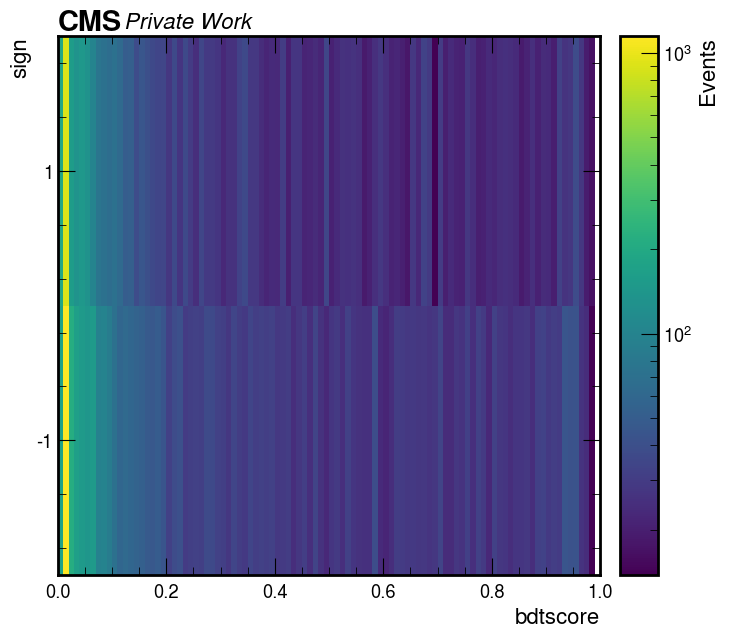

In [36]:
# Plot settings
#fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'bdtscore_vs_sel_vtx_sign'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
#ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

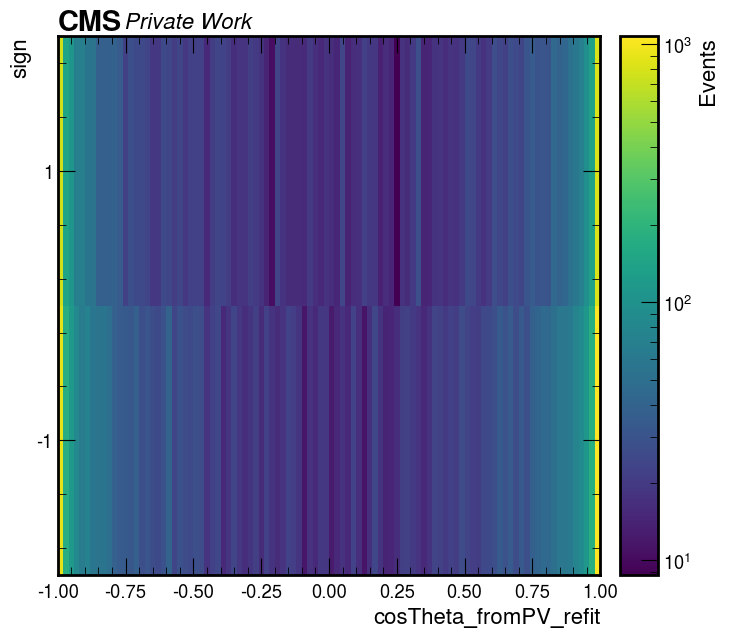

In [37]:
# Plot settings
#fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_CosThetaColl_fromPV_refit_vs_sel_vtx_sign'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
#ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

## Data and Background

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data/sel_vtx//data_VR_lead_jet_phi_vs_lead_jet_eta_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data/sel_vtx//data_VR_lead_jet_phi_vs_lead_jet_eta_cut10.png


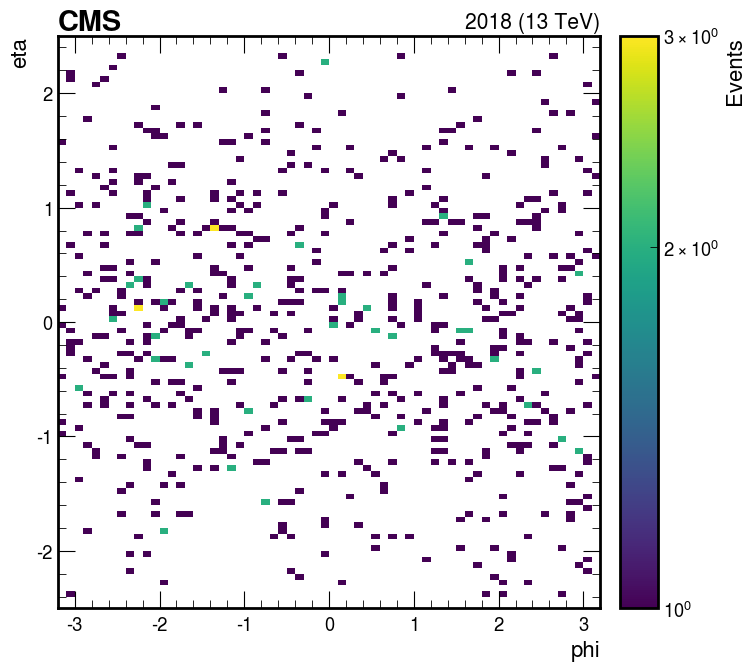

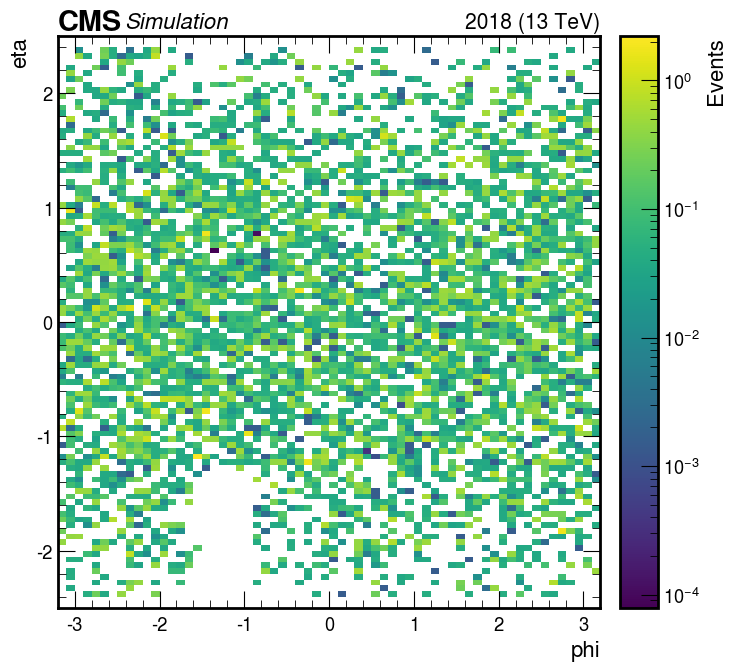

In [51]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'lead_jet_phi_vs_lead_jet_eta'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data/sel_vtx//data_VR_sel_vtx_phi_vs_METphi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data/sel_vtx//data_VR_sel_vtx_phi_vs_METphi_cut10.png


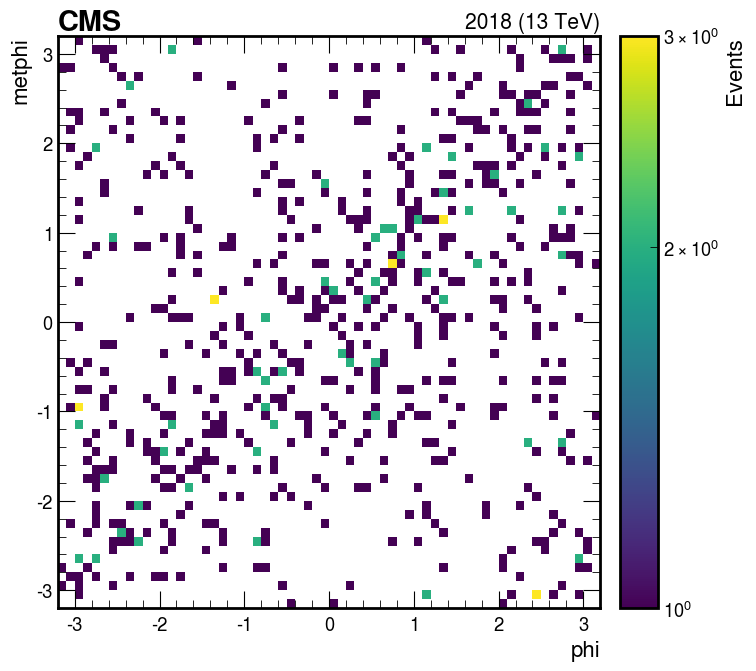

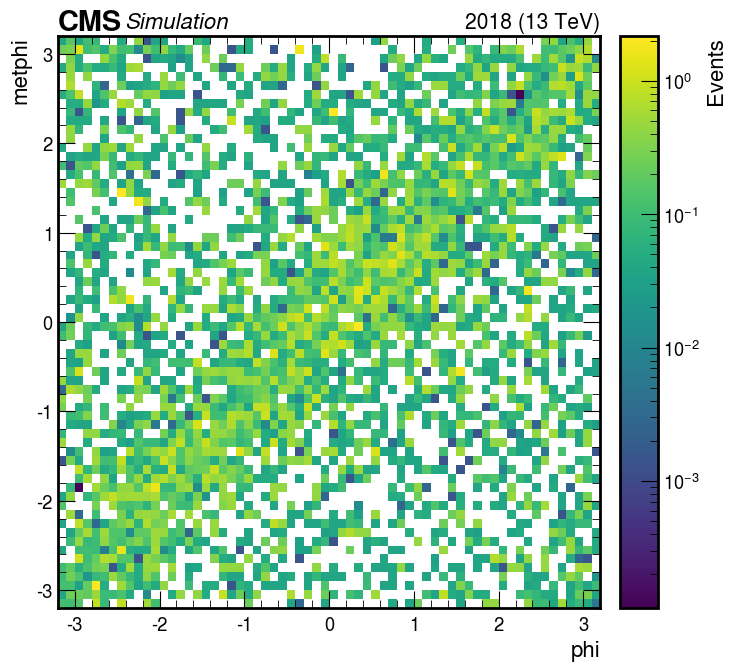

In [52]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'sel_vtx_phi_vs_METphi'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data/sel_vtx//data_VR_METphi_vs_lead_jet_phi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data/sel_vtx//data_VR_METphi_vs_lead_jet_phi_cut10.png


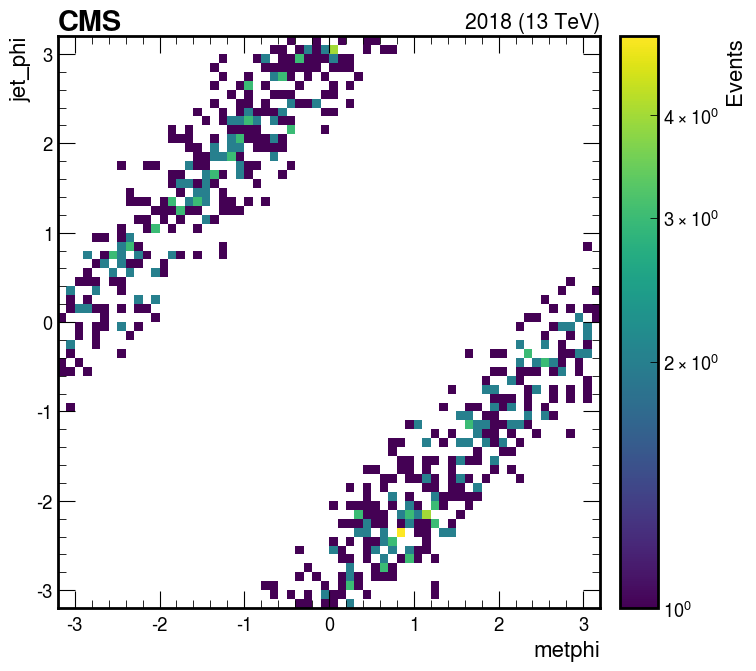

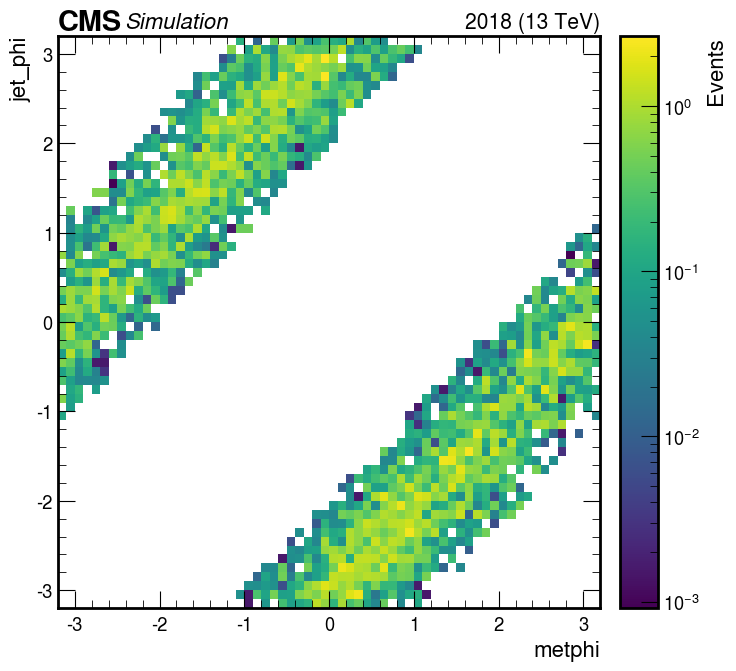

In [53]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'METphi_vs_lead_jet_phi'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut10.png


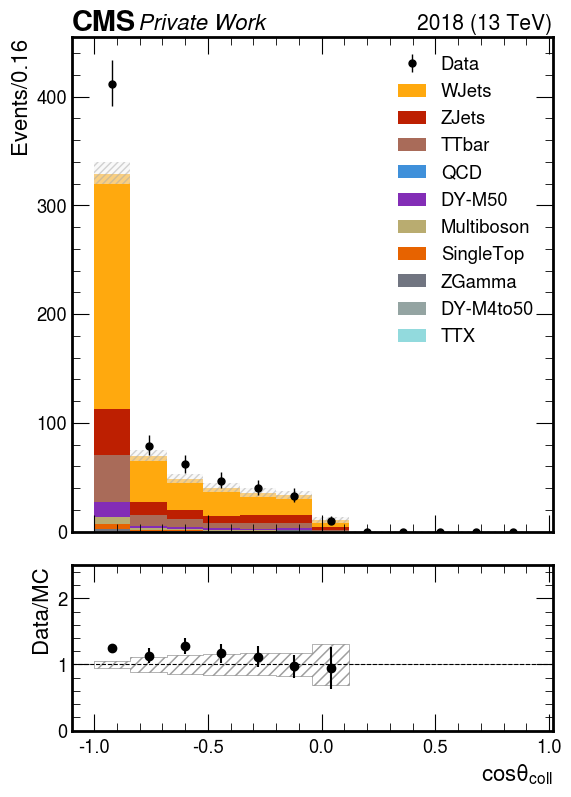

In [54]:
variable = 'sel_vtx_CosThetaColl_fromPV_refit'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 8j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$cos\theta_{coll}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.16',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_nJets_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_nJets_cut10.png


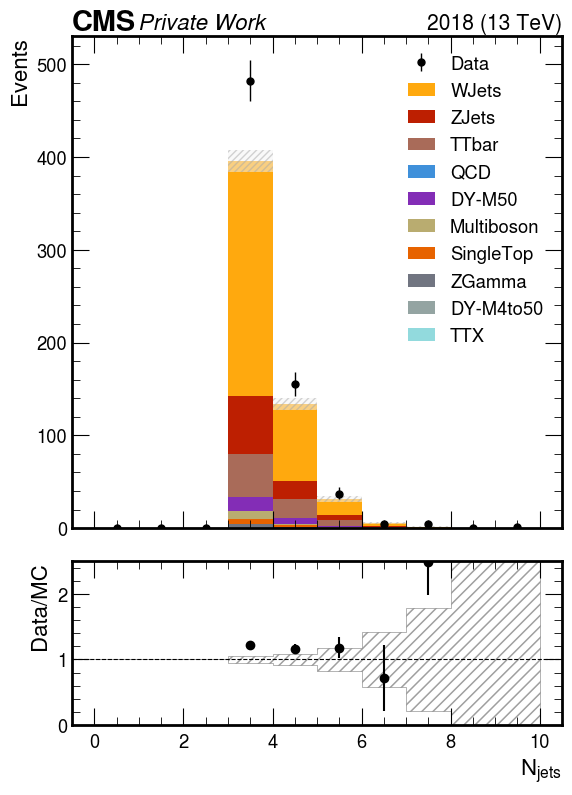

In [55]:
variable = 'nJets'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$N_{jets}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_PFMET1000_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_PFMET1000_cut10.png


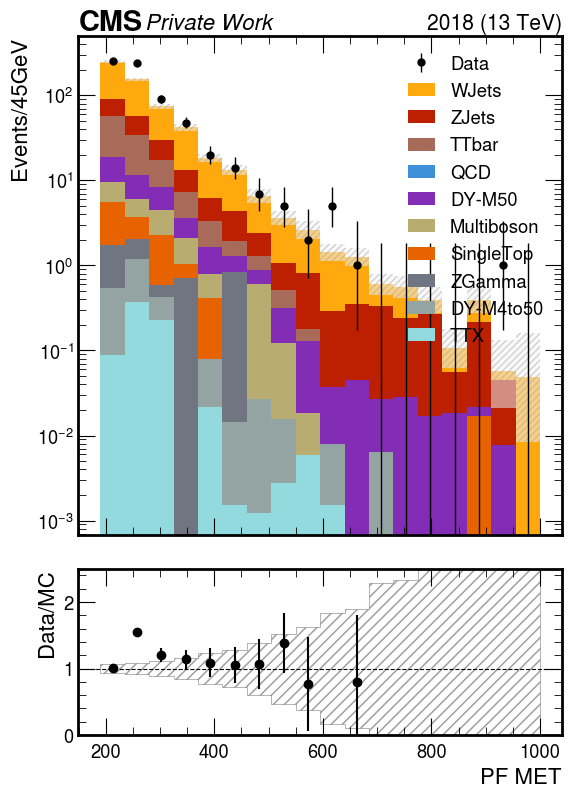

In [56]:
variable = 'PFMET1000'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': [200, 1000],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"PF MET",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/45GeV',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_lead_jet_pt_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_lead_jet_pt_cut10.png


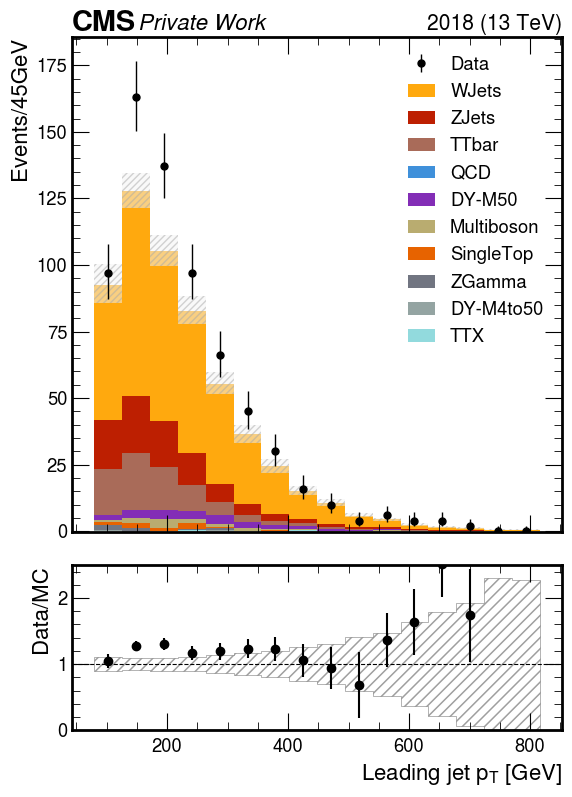

In [57]:
variable = 'lead_jet_pt'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': [50,800],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"Leading jet $p_{T}$ [GeV]",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/45GeV',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_jetMETdPhi_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_jetMETdPhi_cut10.png


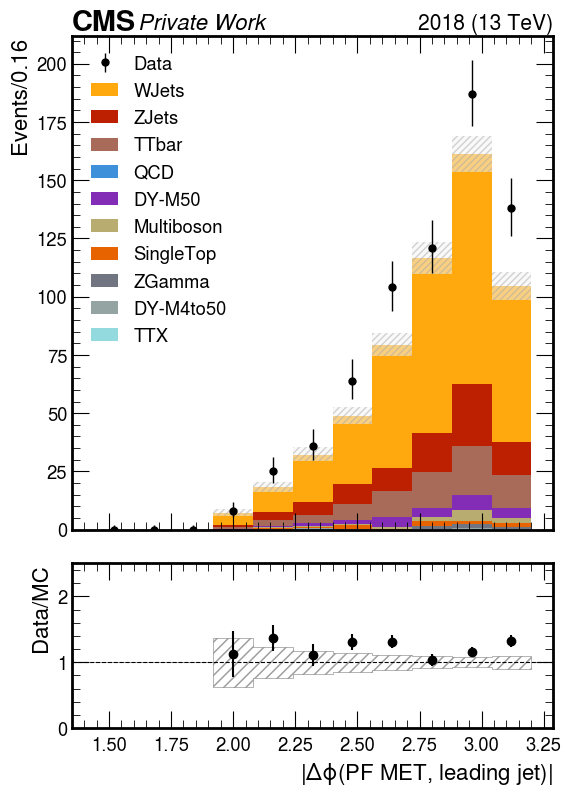

In [58]:
variable = 'jetMETdPhi'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': [1.5,3.5],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"|$\Delta\phi$(PF MET, leading jet)|",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.16',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_mass_refit_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_mass_refit_cut10.png


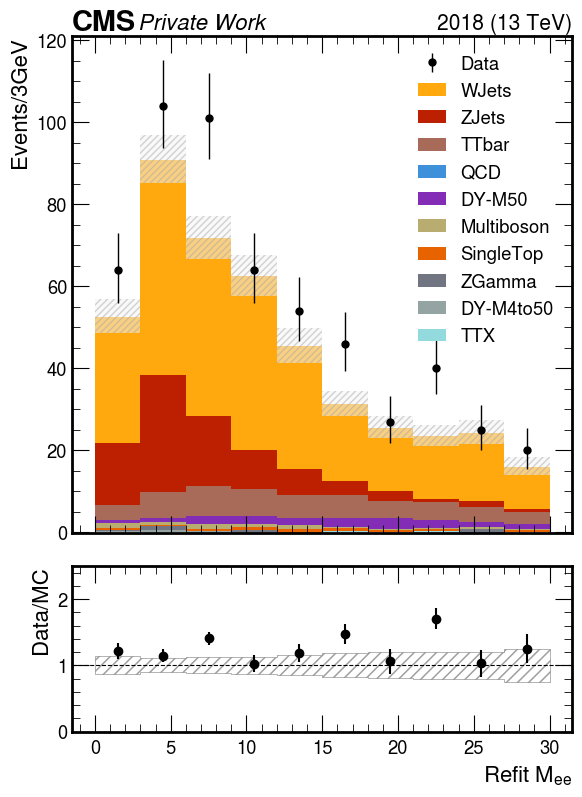

In [65]:
variable = 'sel_vtx_mass_refit'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"Refit $M_{ee}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/3GeV',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_dR_refit_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_dR_refit_cut10.png


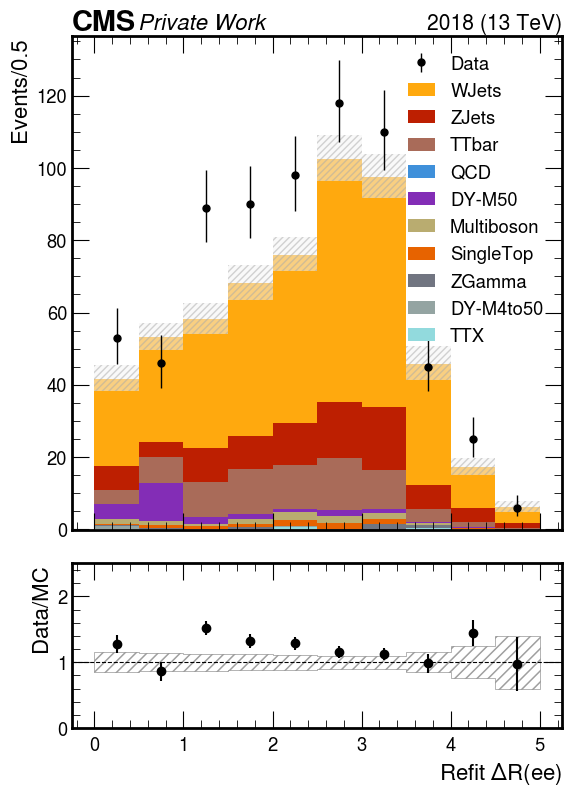

In [68]:
variable = 'sel_vtx_dR_refit'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"Refit $\Delta R(ee)$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.5',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_cut10.png


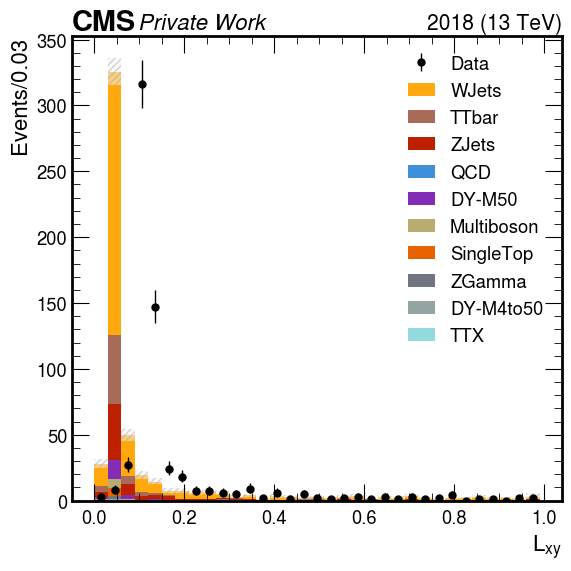

In [84]:
variable = 'sel_vtx_vxy1'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 3j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$L_{xy}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.03',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

#ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_bkg_1d_stacked_errbar(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_data_1d(data_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_fromPV_vectorSub_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_fromPV_vectorSub_cut10.png


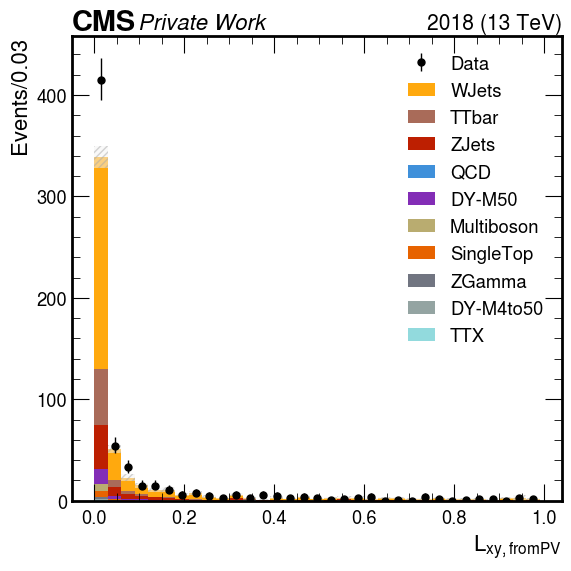

In [85]:
variable = 'sel_vtx_vxy1_fromPV_vectorSub'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 3j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$L_{xy, fromPV}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.03',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

#ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_bkg_1d_stacked_errbar(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_data_1d(data_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_PVx_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_PVx_cut10.png


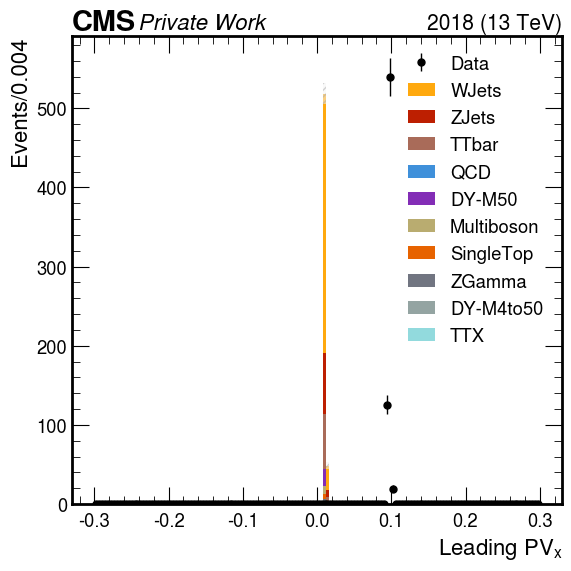

In [86]:
variable = 'PVx'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [-0.3,0.3],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"Leading $PV_{x}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

#ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_bkg_1d_stacked_errbar(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_data_1d(data_histo, plot_dict, style_dict)

Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_PVy_cut10.png
Saved: ./AN_Plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_trackdxy_0p001/data_bkg/sel_vtx//data_VR_PVy_cut10.png


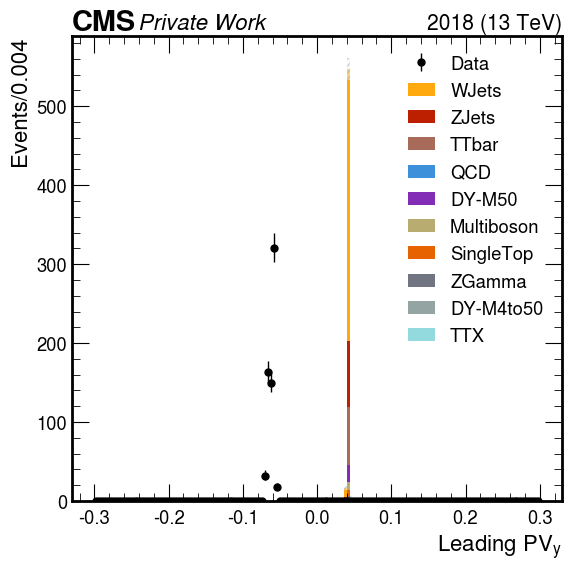

In [87]:
variable = 'PVy'
cut = 'cut10'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [-0.3,0.3],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"Leading $PV_{y}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./AN_Plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

#ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

ptools.plot_bkg_1d(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_bkg_1d_stacked_errbar(bkg_histo, plot_dict, style_dict, processes = 'all')
ptools.plot_data_1d(data_histo, plot_dict, style_dict)

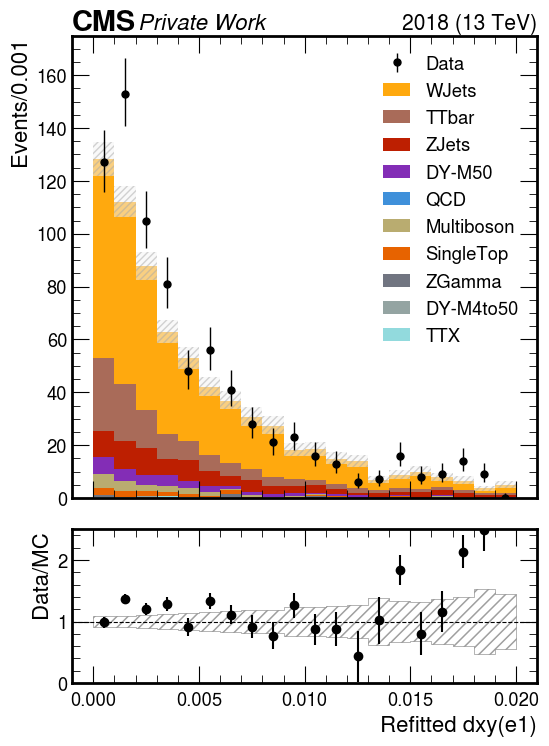

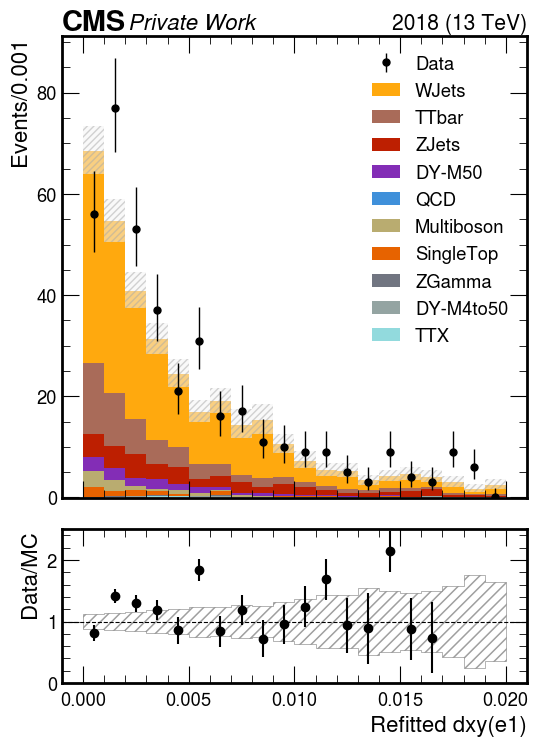

In [17]:
variable = 'sel_e1_dxy_refit'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [0,0.02],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': 'Refitted dxy(e1)',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

In [ ]:
variable = 'sel_e1_dxy'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [0,0.02],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': 'dxy(e1)',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

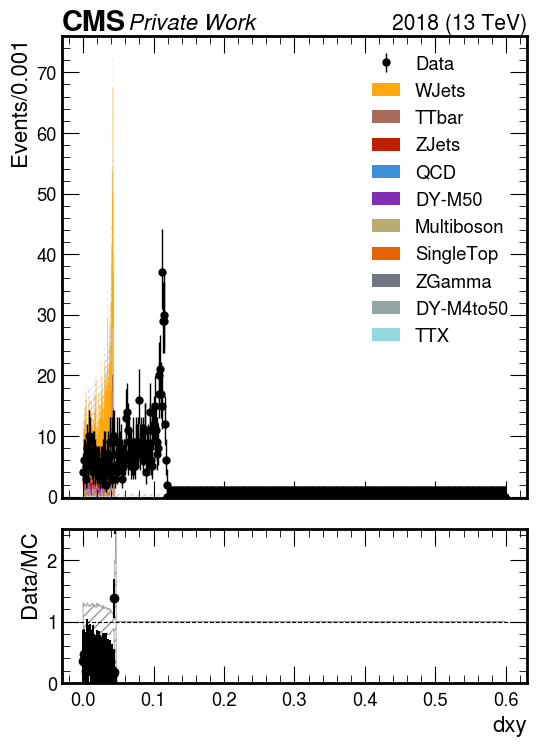

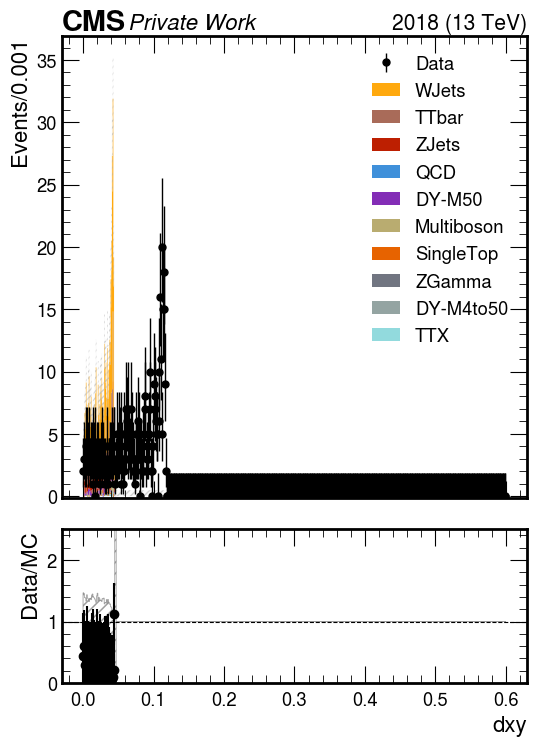

In [35]:
variable = 'sel_e1_dxy_manual'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [0,0.6],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

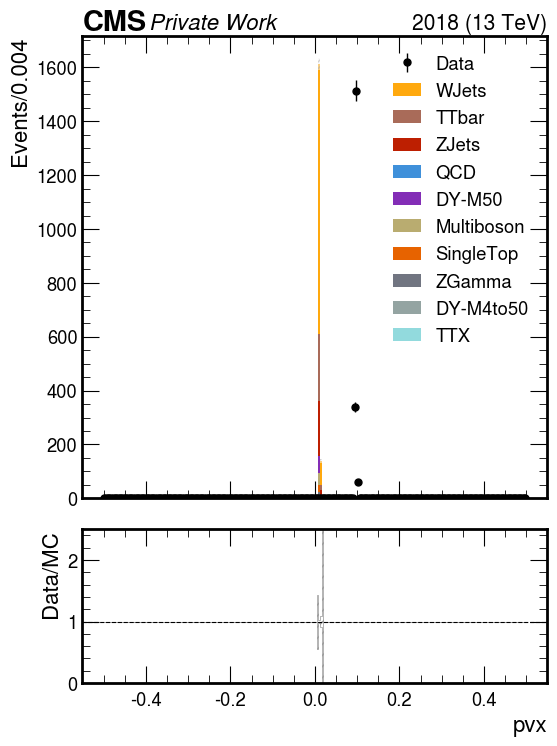

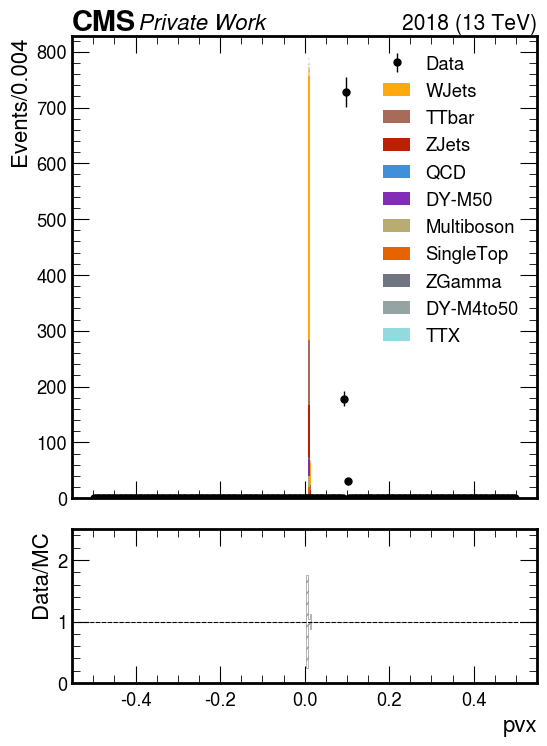

In [16]:
variable = 'PVx'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [-0.5,0.5],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

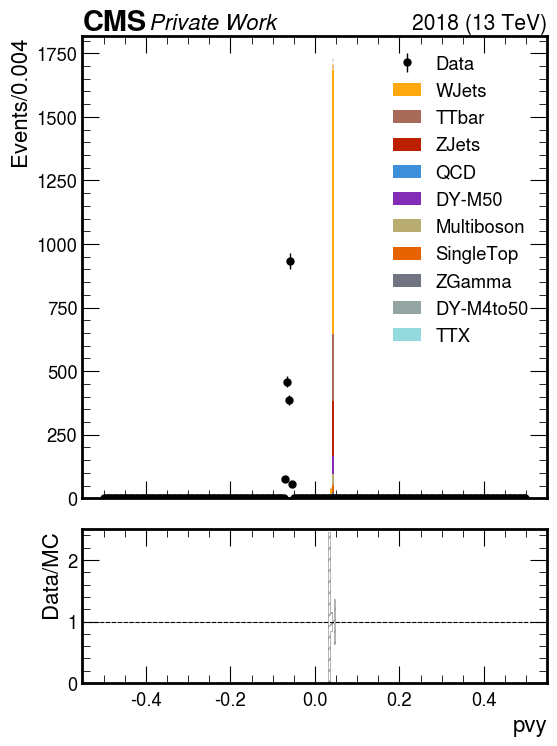

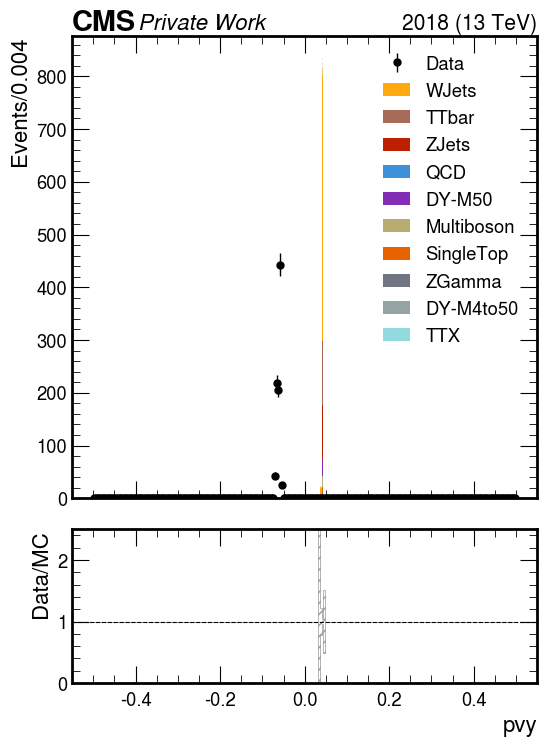

In [17]:
variable = 'PVy'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [-0.5,0.5],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

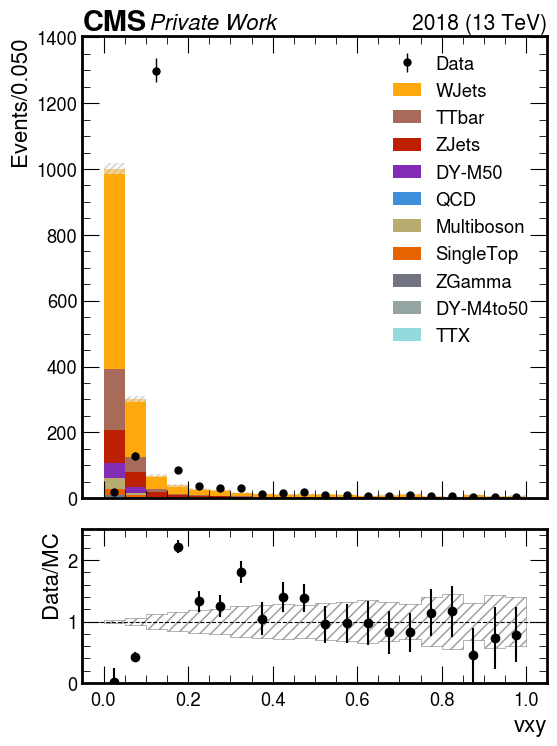

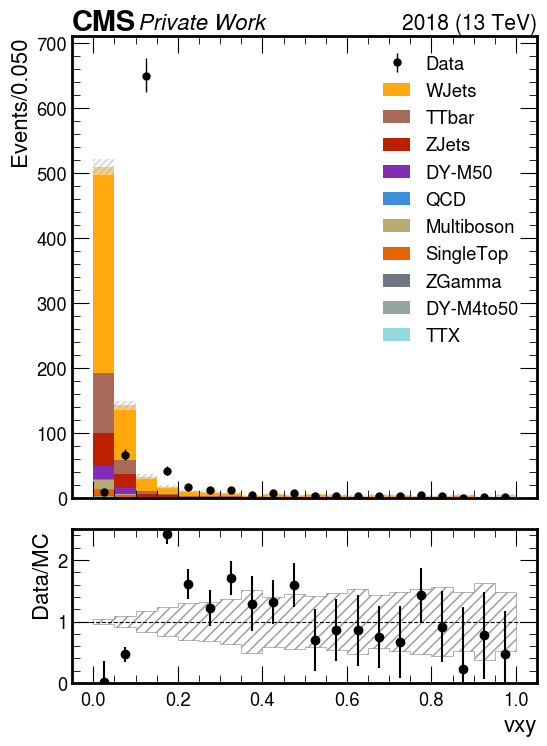

In [18]:
variable = 'sel_vtx_vxy1'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

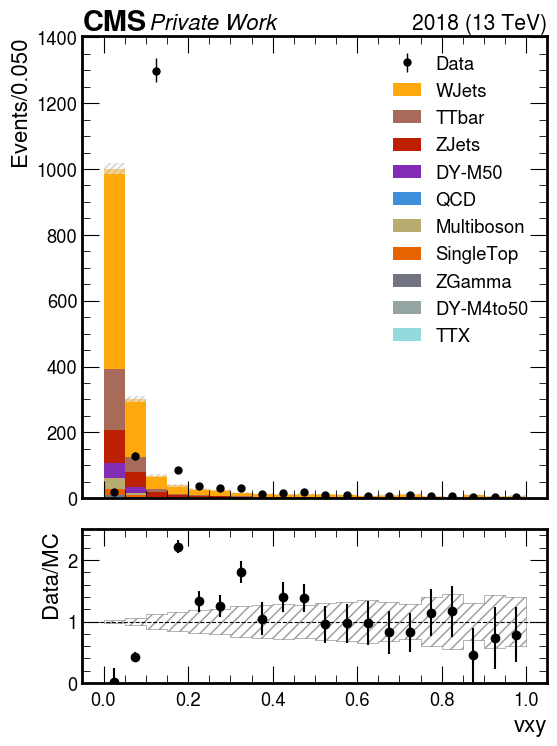

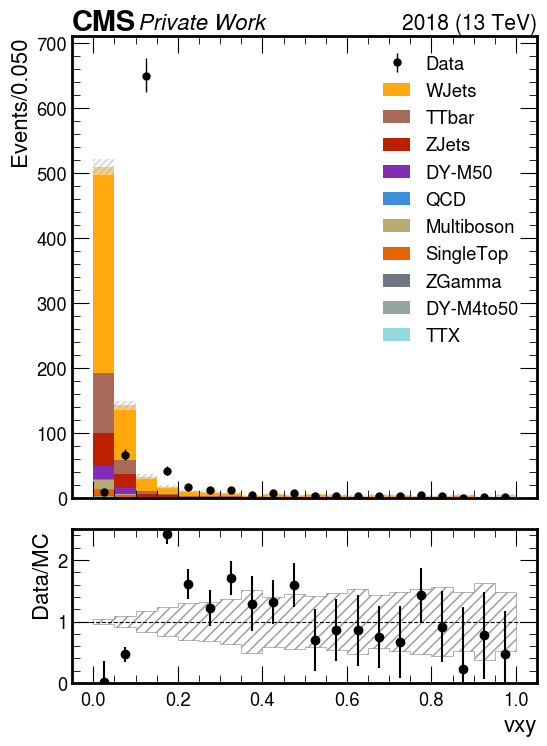

In [19]:
variable = 'sel_vtx_vxy1_fromPV_scalarSub'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

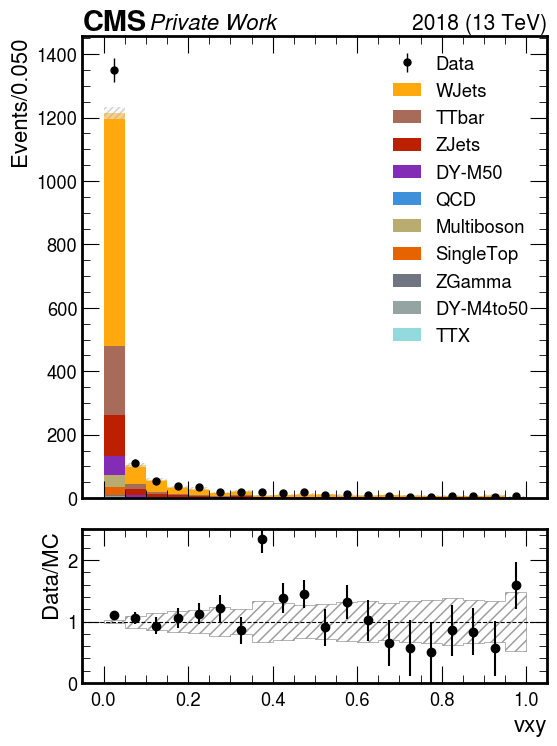

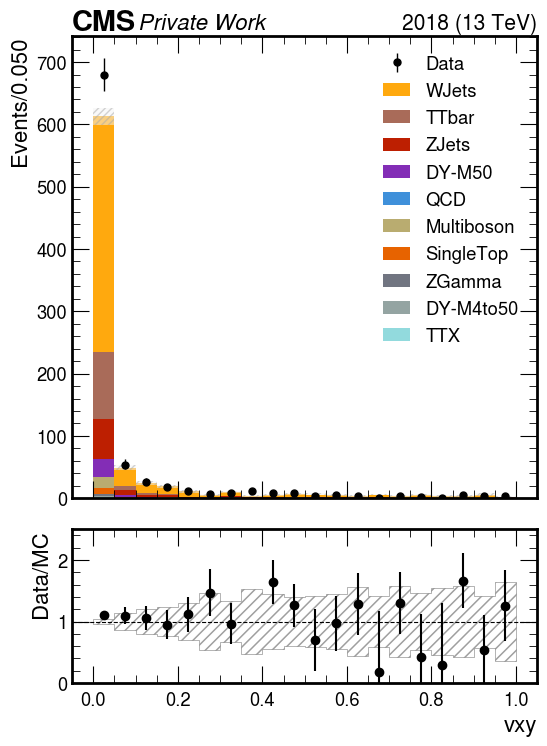

In [20]:
variable = 'sel_vtx_vxy1_fromPV_vectorSub'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_refit_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_refit_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1507: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1537: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_refit_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_refit_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1507: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1537: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_refit_cut11.png


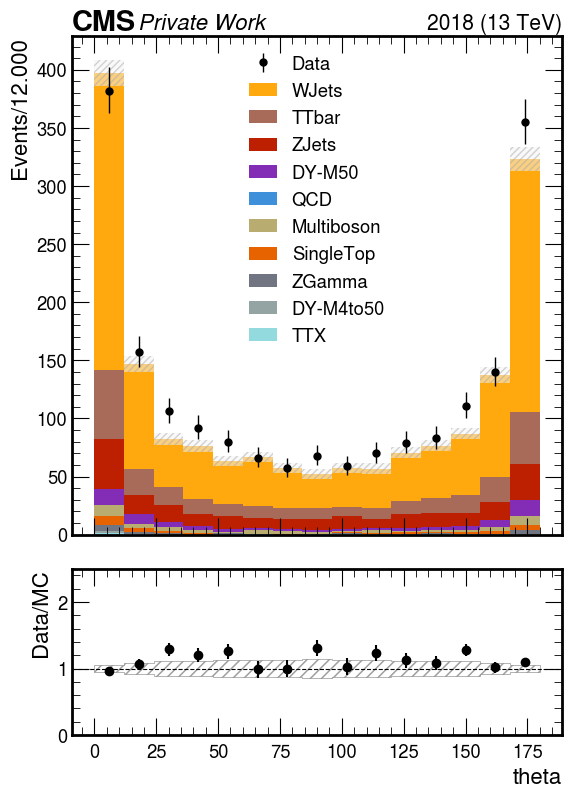

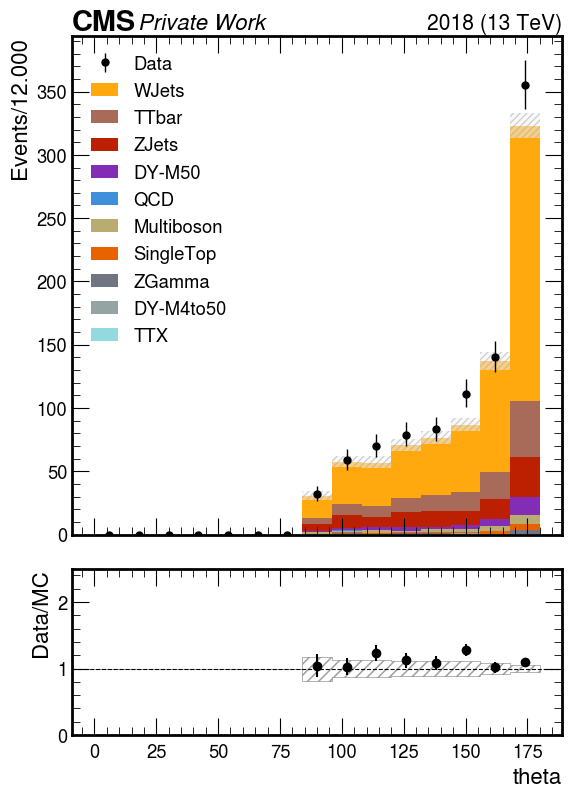

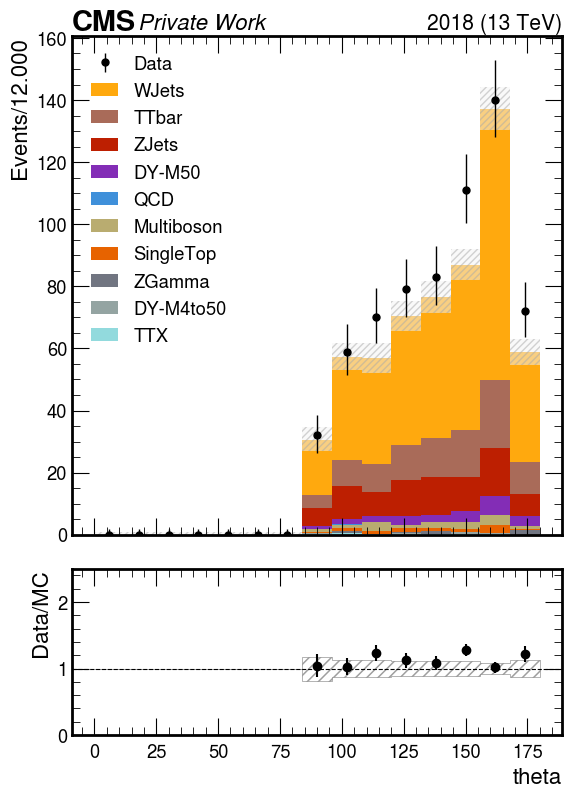

In [21]:
variable = 'sel_vtx_ThetaColl_fromPV_refit'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 12j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_ThetaColl_fromPV_cut11.png


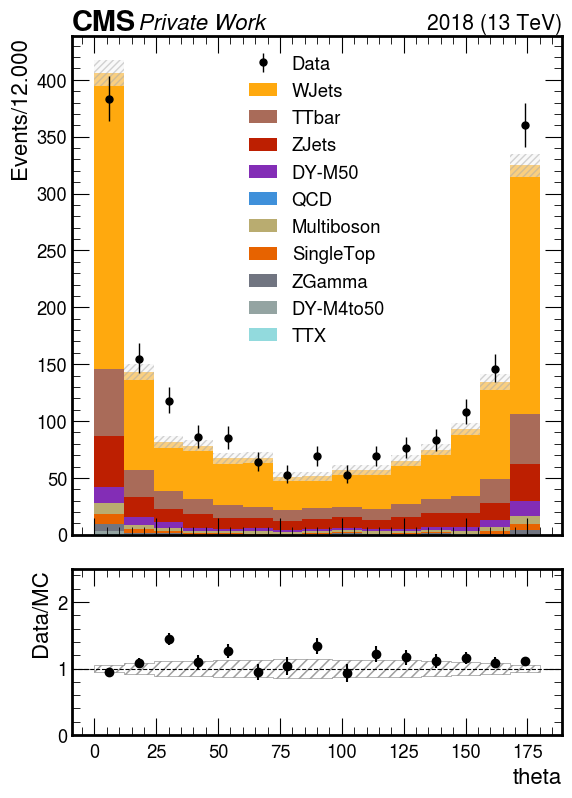

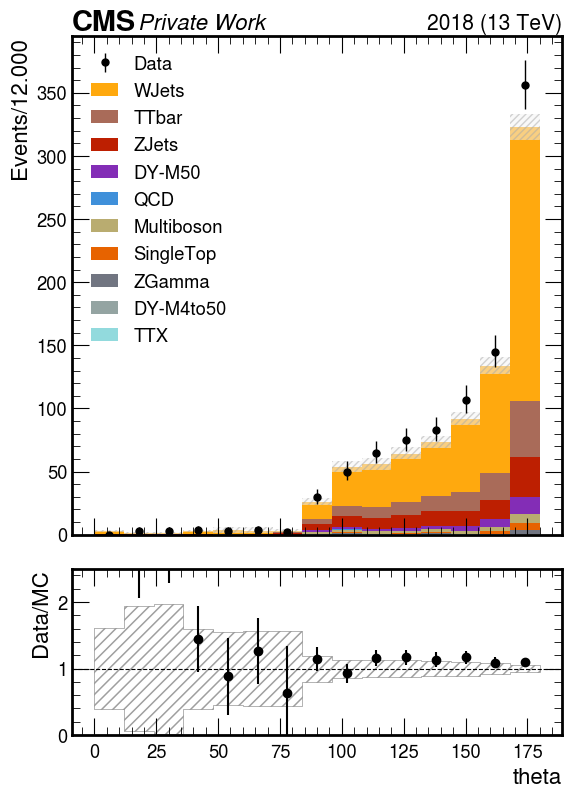

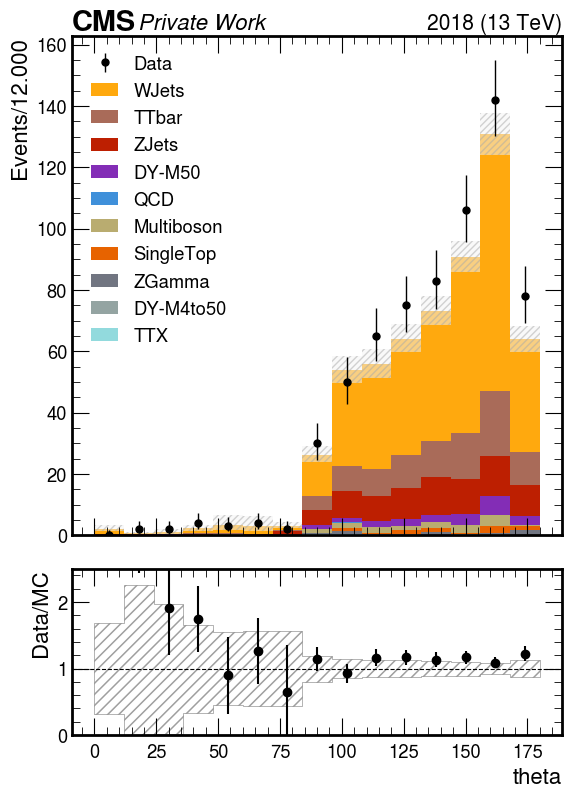

In [22]:
variable = 'sel_vtx_ThetaColl_fromPV'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 12j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_nJets_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1507: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1537: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_nJets_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_nJets_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1507: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1537: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_nJets_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_nJets_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1507: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1537: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_nJets_cut11.png


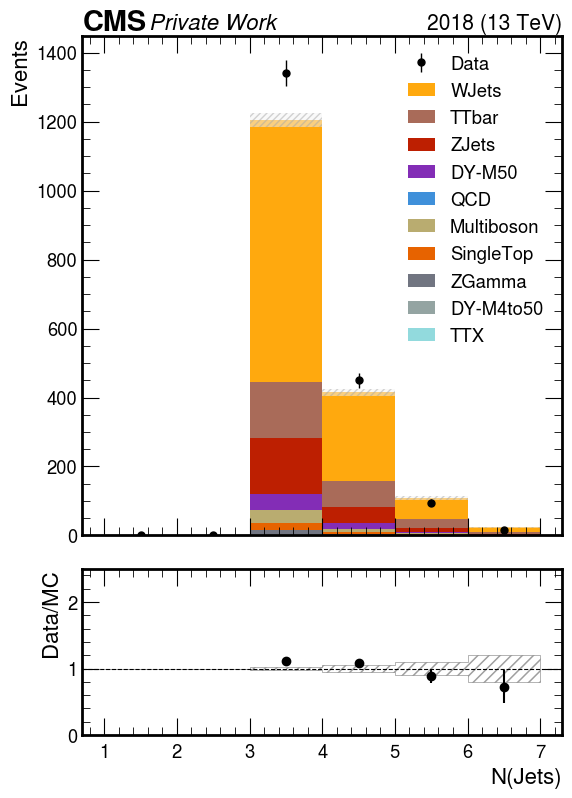

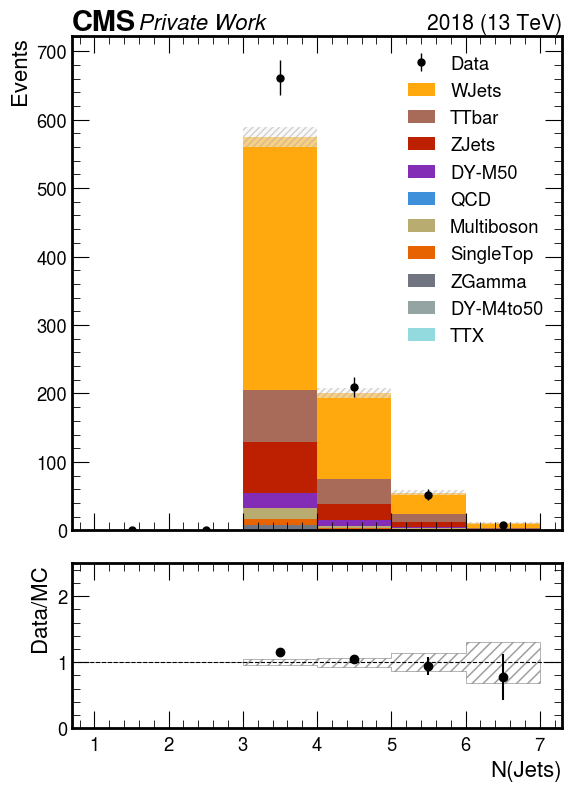

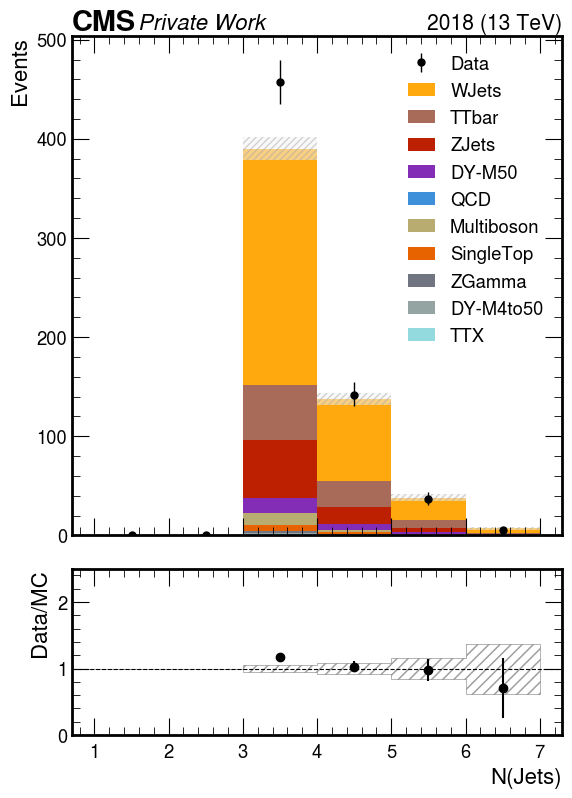

In [23]:
variable = 'nJets'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [1,7],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': 'N(Jets)',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut11.png


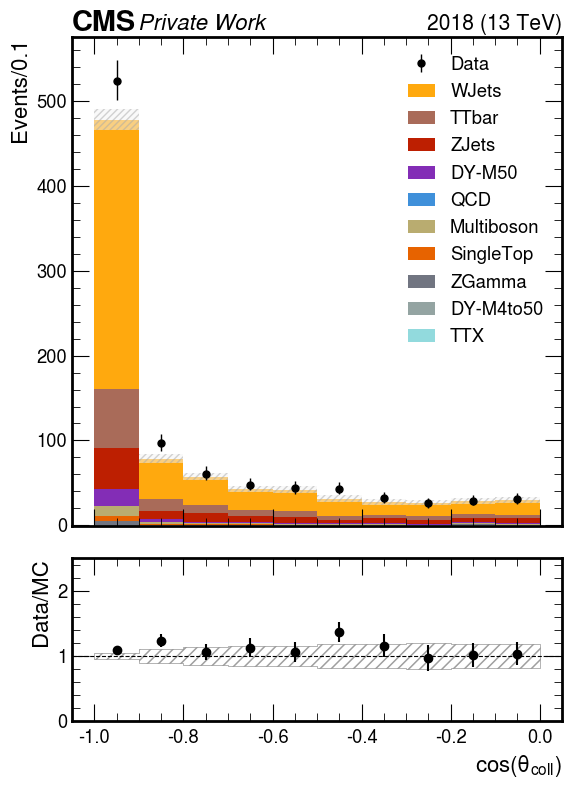

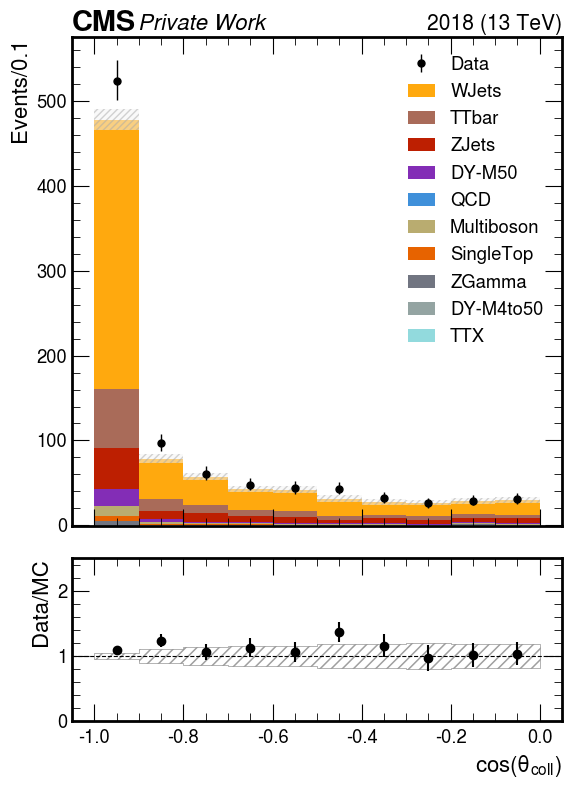

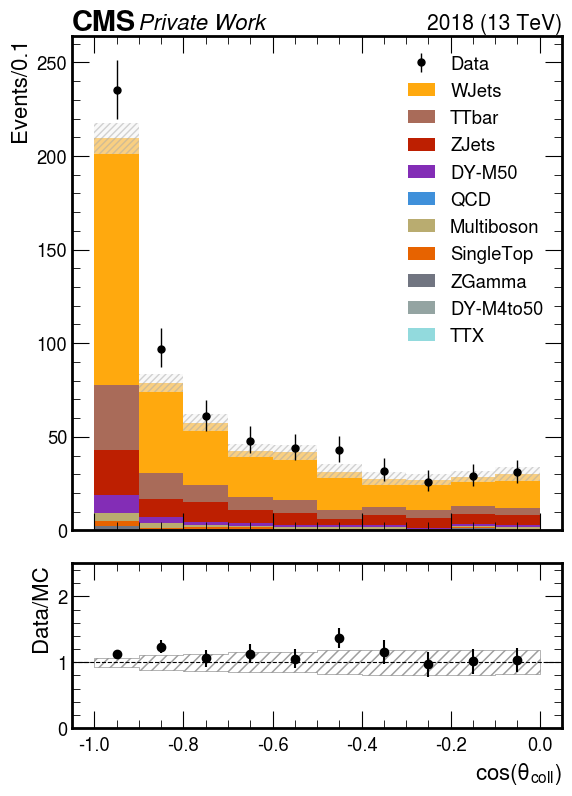

In [24]:
variable = 'sel_vtx_CosThetaColl_fromPV_refit'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': [-1,0],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"cos($\theta_{coll}$)",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.1',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


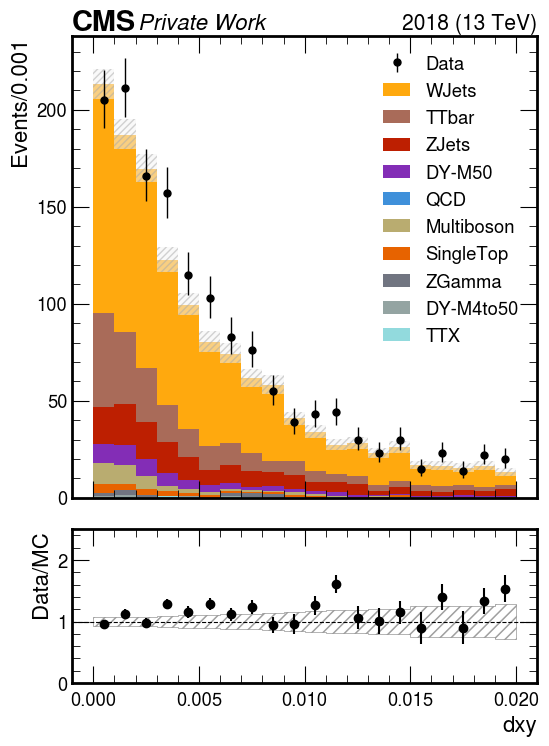

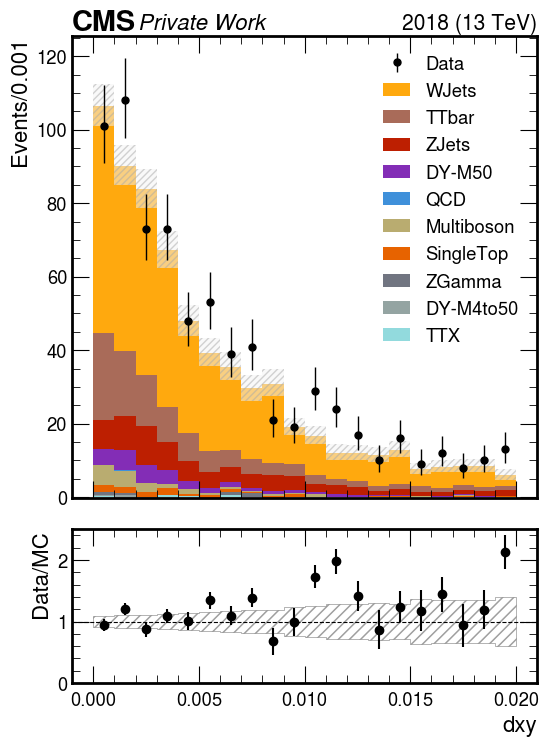

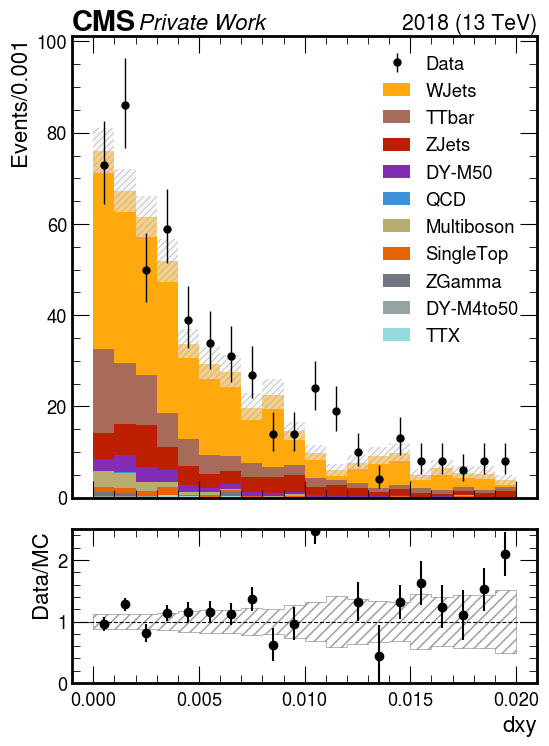

In [25]:
variable = 'sel_e1_dxy'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [0,0.02],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1532: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms/home/kyungmip/nobac

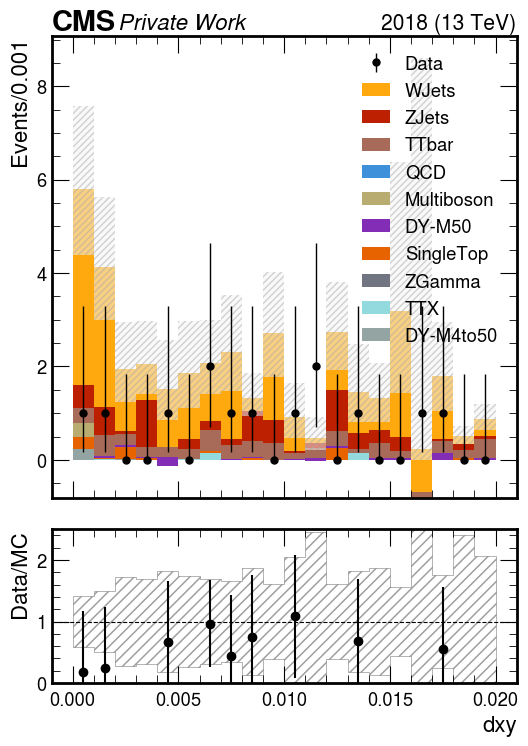

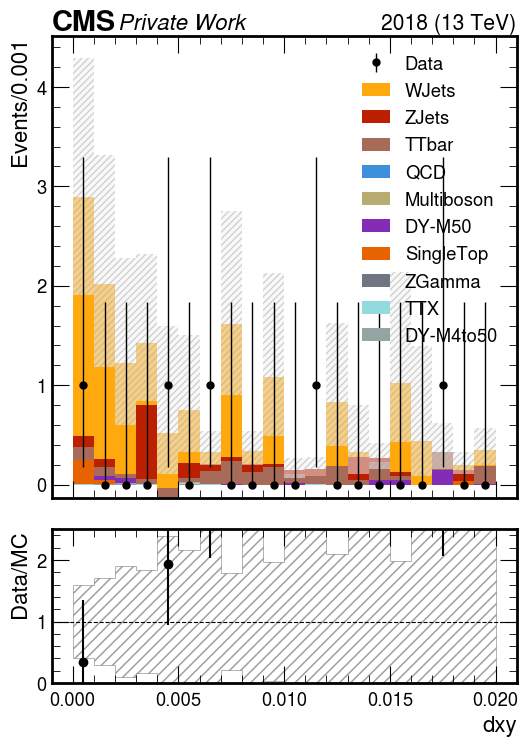

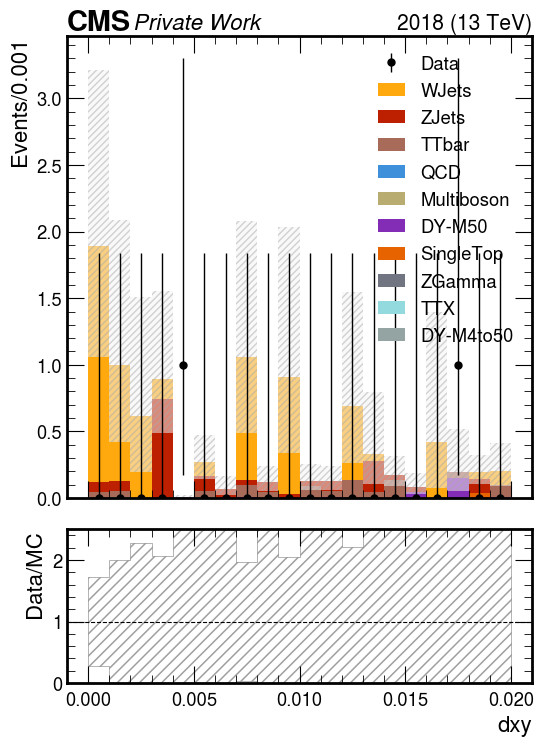

In [29]:
variable = 'sel_e1_dxy_fromPV'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 1j,
    'xlim': [0,0.02],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': False,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut11.png


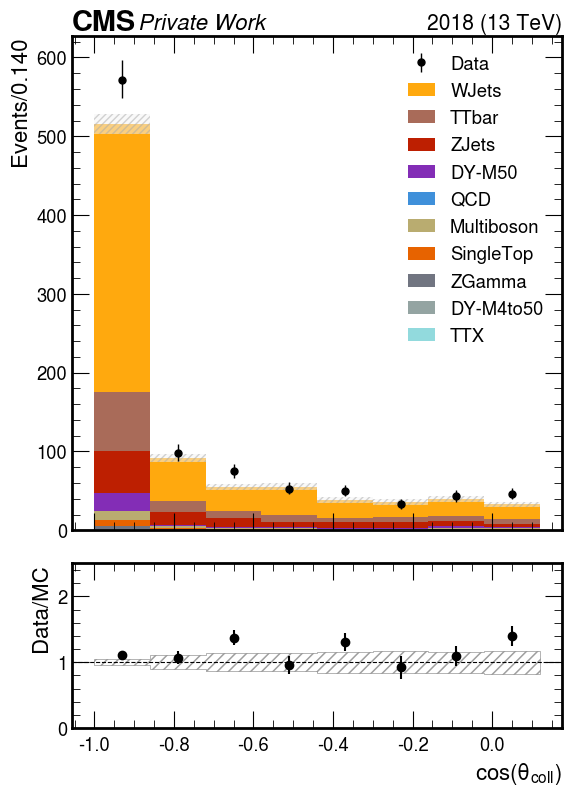

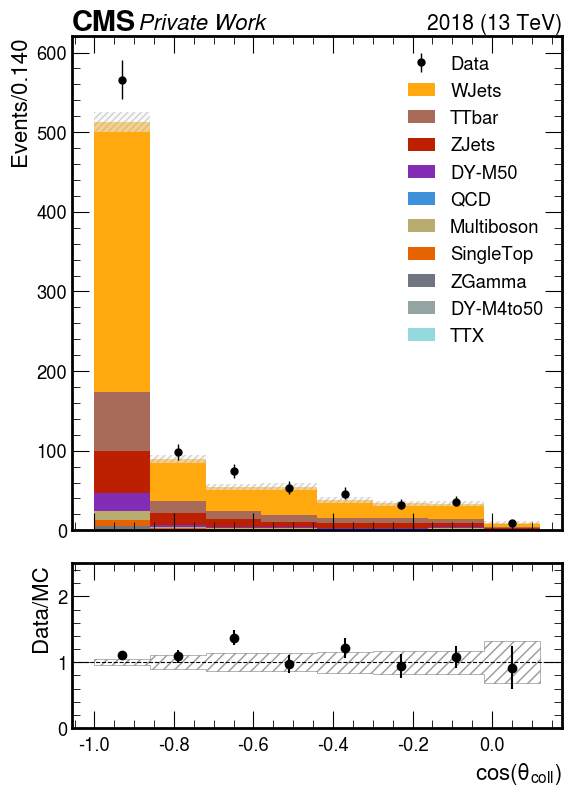

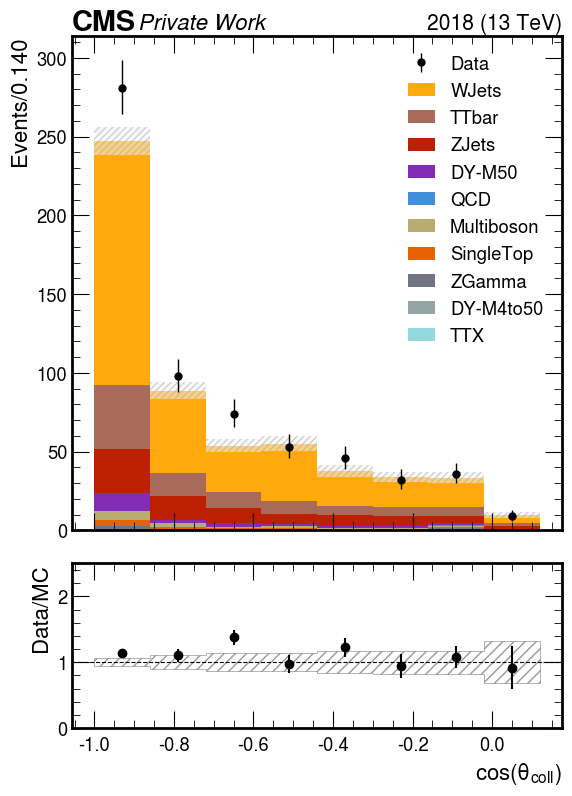

In [27]:
variable = 'sel_vtx_CosThetaColl_fromPV'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 7j,
    'xlim': [-1,0],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"cos($\theta_{coll}$)",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_METdPhi_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_METdPhi_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_METdPhi_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_METdPhi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_METdPhi_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_track/data_bkg/sel_vtx//data_VR_sel_vtx_METdPhi_cut11.png


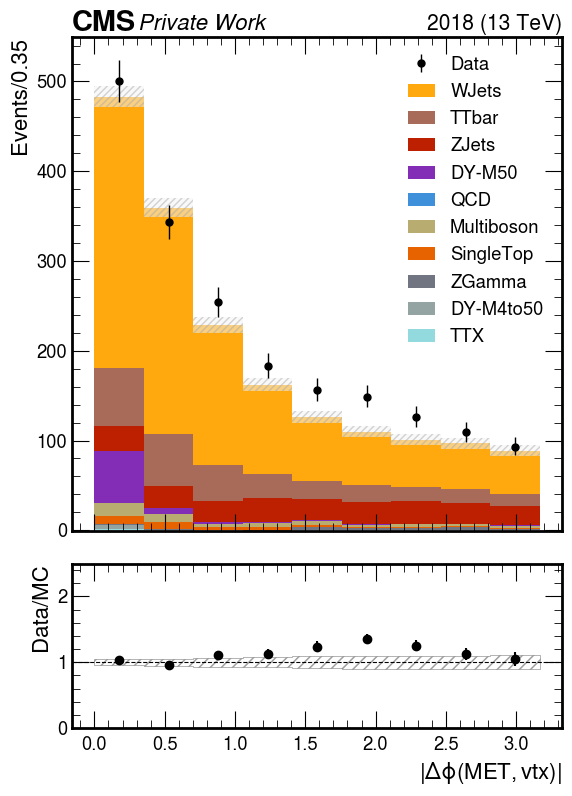

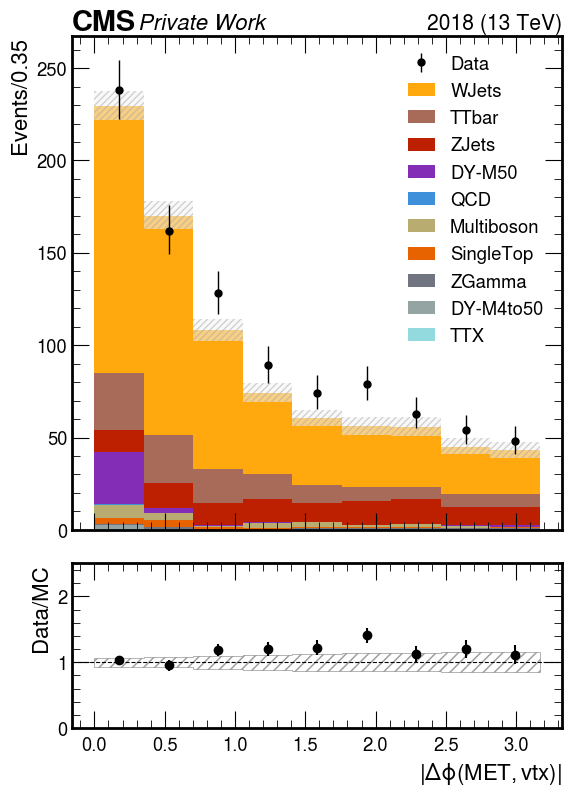

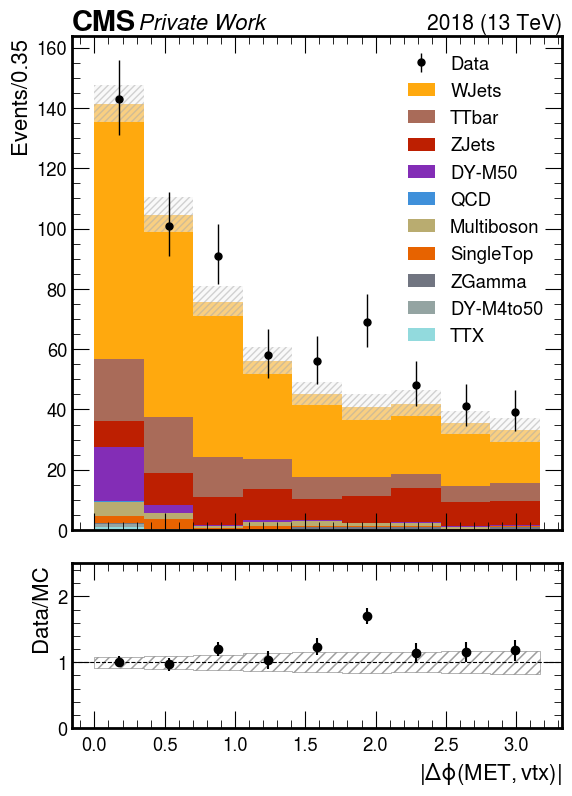

In [28]:
variable = 'sel_vtx_METdPhi'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 11j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$|\Delta\phi(MET, vtx)$|",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.35',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1504: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1529: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1534: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut9.png
Saved: ./plots/VR_Collinear_fromPV_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1504: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1529: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1534: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1504: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1529: RuntimeWarning: invalid value encountered in divide
  data_err = np.sqrt(hist_data.values())/hist_data.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1534: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut11.png


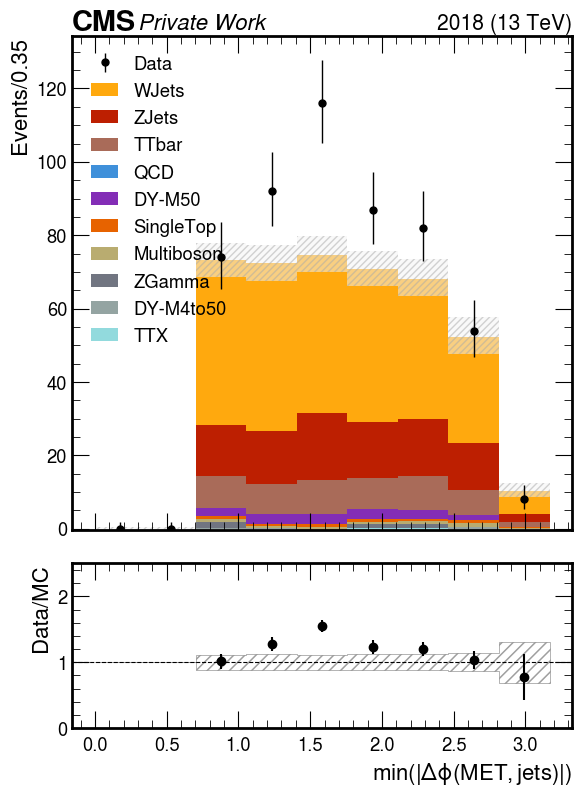

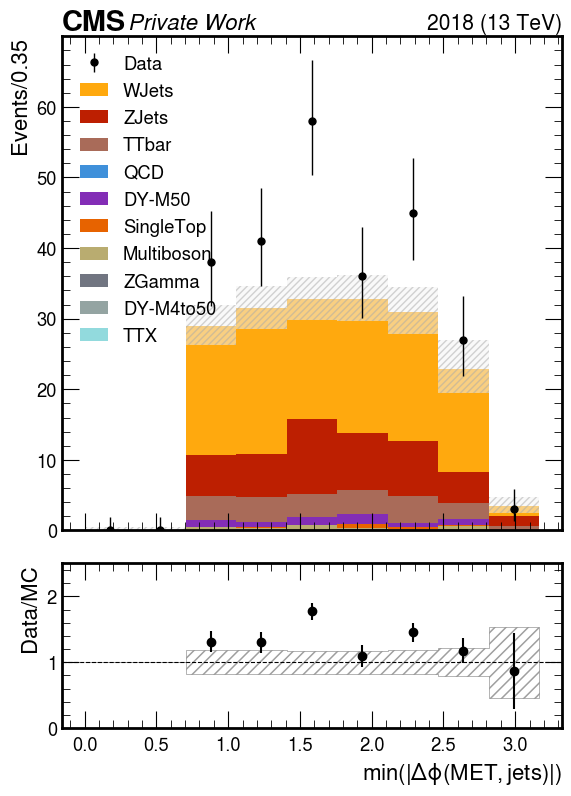

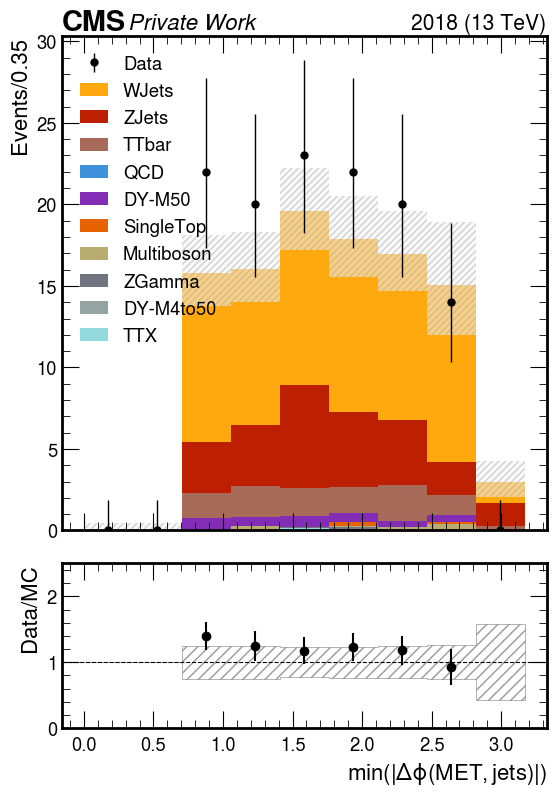

In [26]:
variable = 'minJetMETdPhi'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 11j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$min(|\Delta\phi(MET, jets)$|)",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': 'Events/0.35',   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1504: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1531: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1504: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1531: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1504: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1531: RuntimeWarning: invalid value encountered in divide
  bkg_err = np.sqrt(hist_bkg.values())/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_minJetMETdPhi_cut11.png


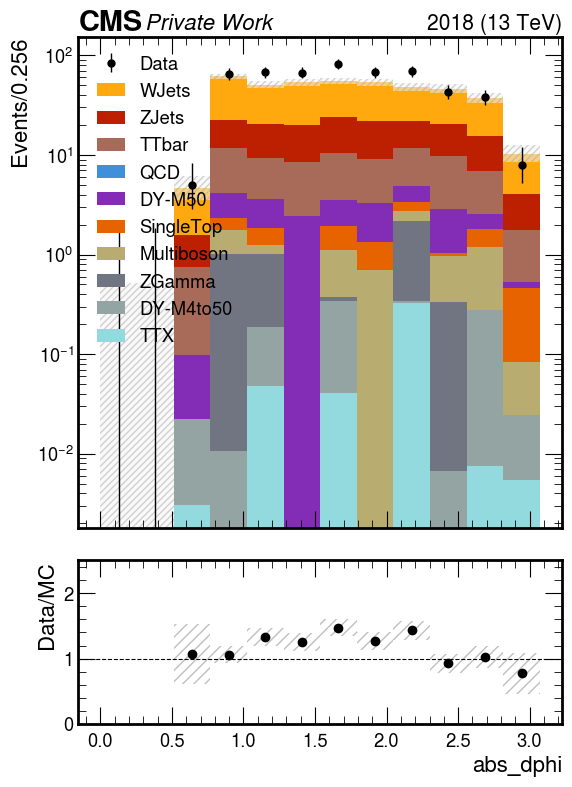

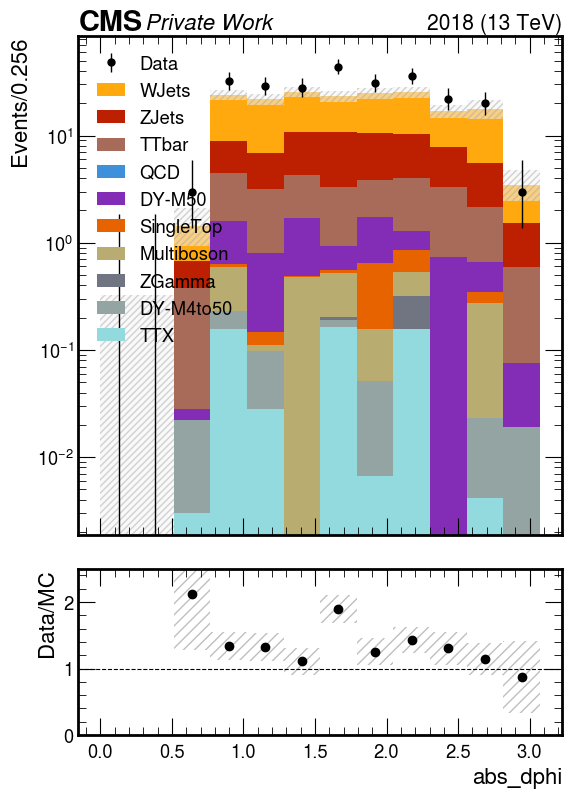

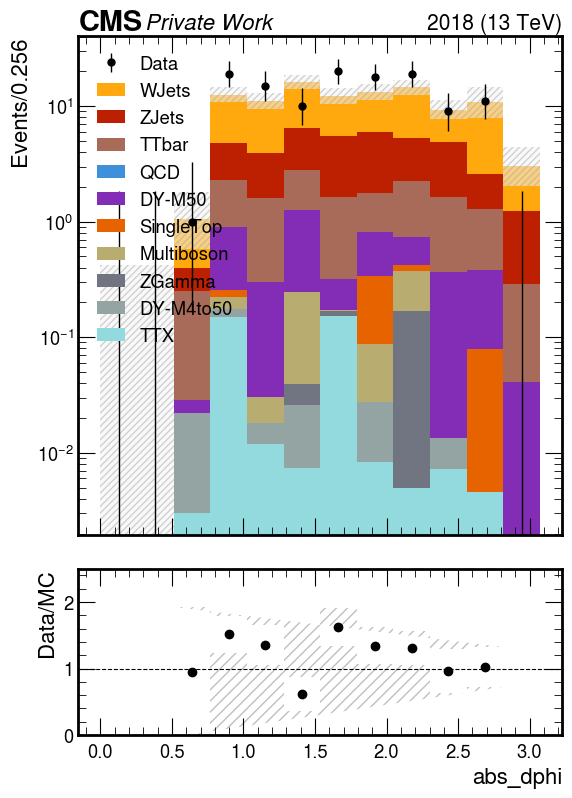

In [67]:
# variable = 'PFMET1000'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 8j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Data',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dEta_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dEta_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dEta_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dEta_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dEta_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dEta_cut11.png


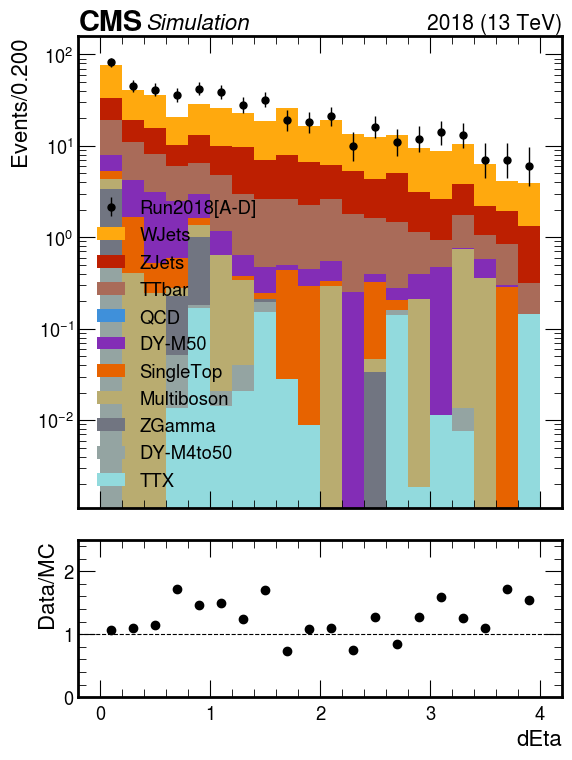

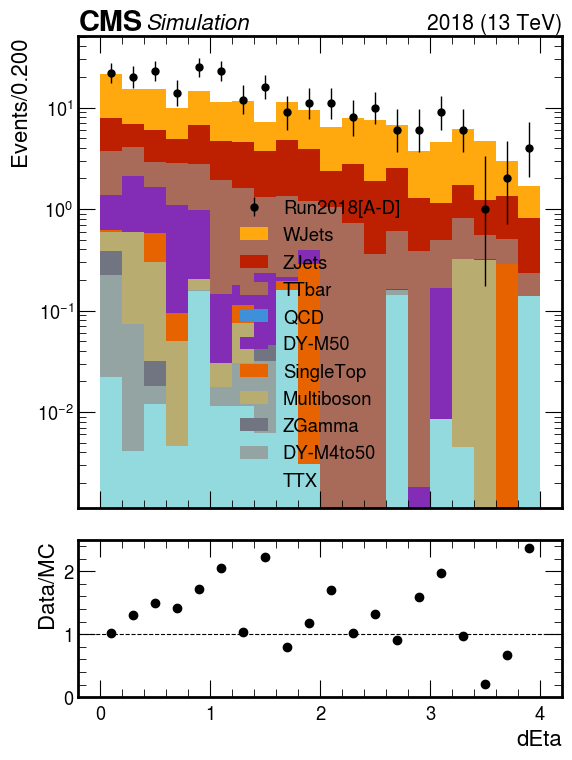

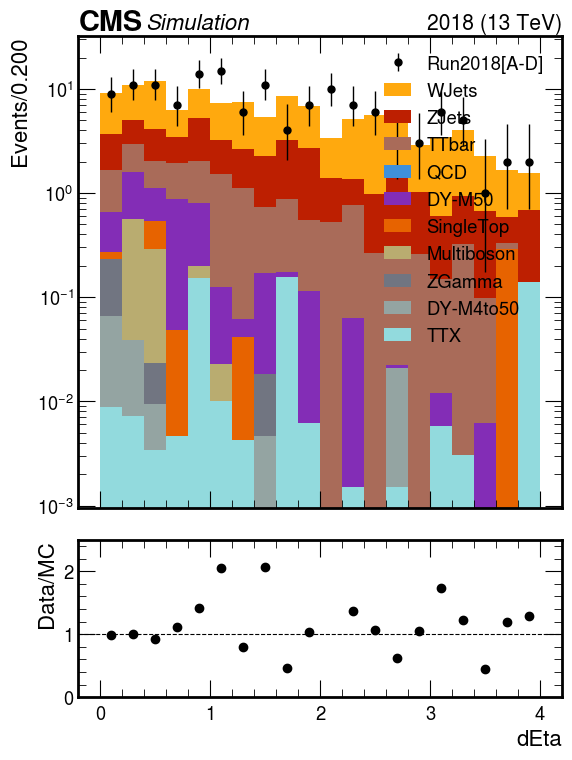

In [31]:
variable = 'sel_vtx_dEta'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': [0,4],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dPhi_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dPhi_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dPhi_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dPhi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dPhi_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_dPhi_cut11.png


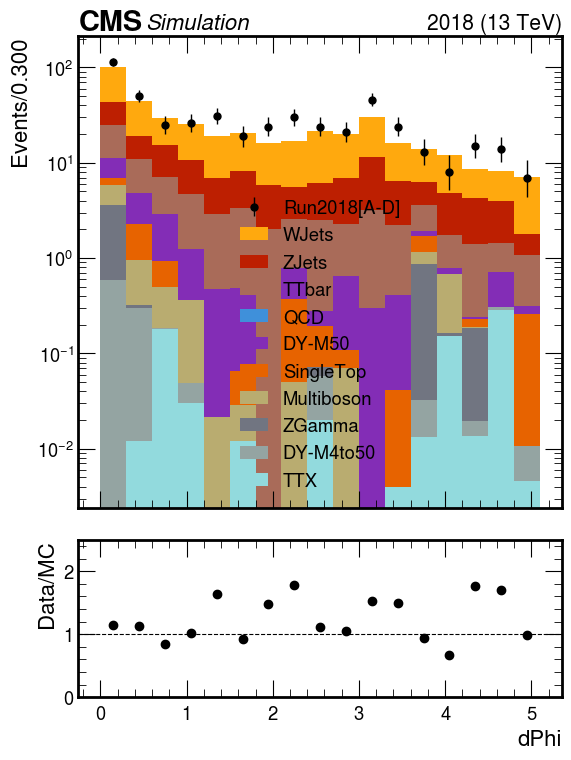

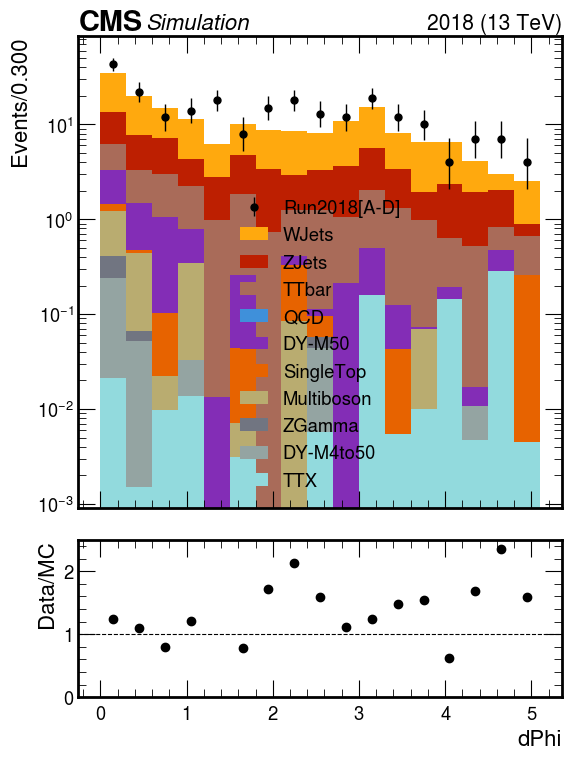

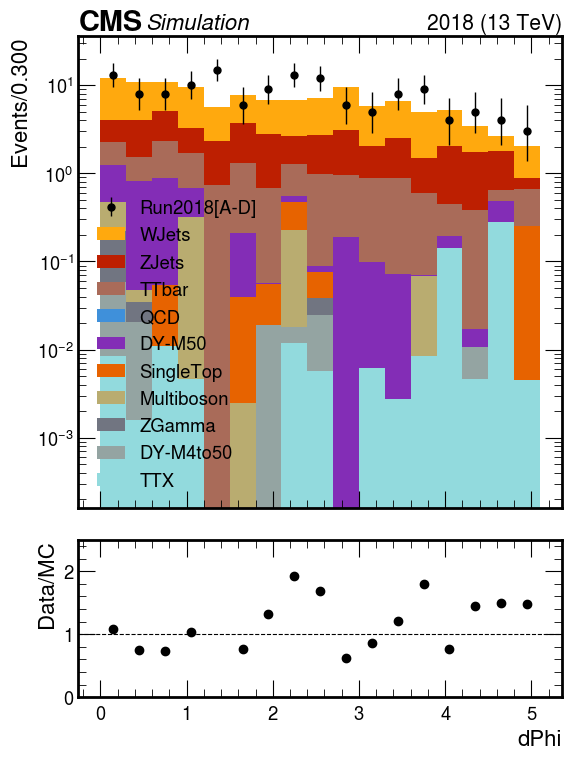

In [32]:
variable = 'sel_vtx_dPhi'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 15j,
    'xlim': [0,5],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_cut11.png


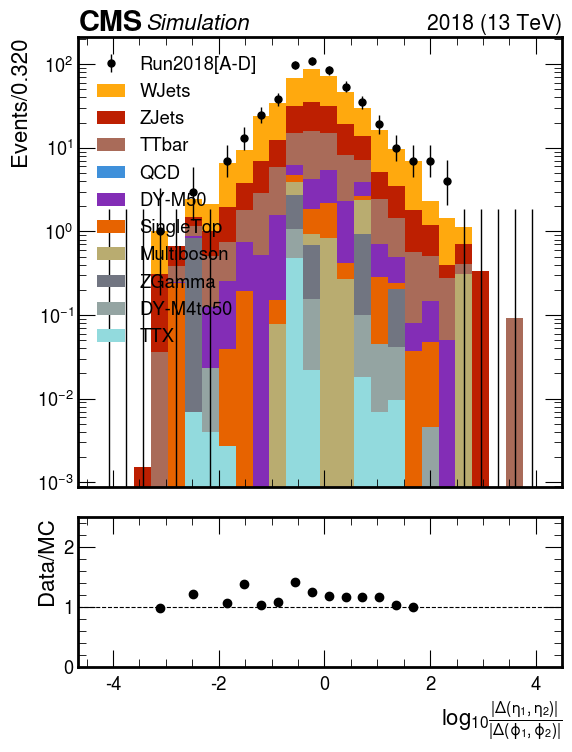

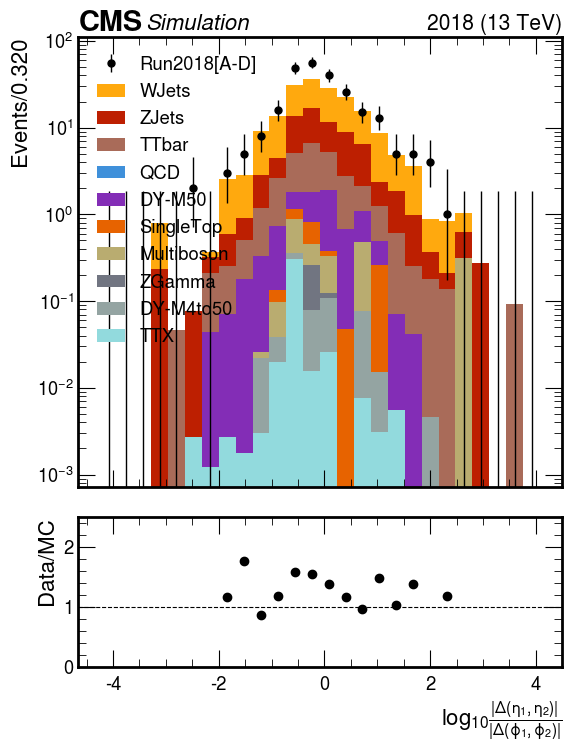

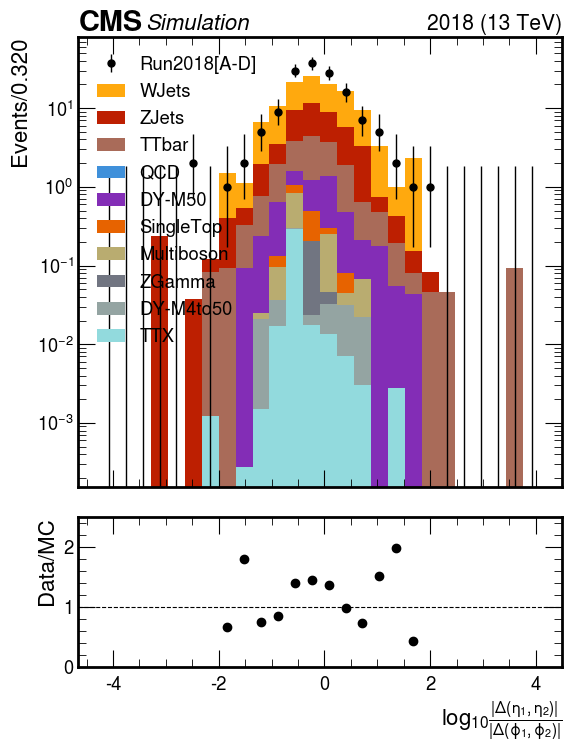

In [46]:
variable = 'sel_vtx_log10dEtadPhi'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 8j,
    'xlim': [-4,4],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$log_{10}\frac{|\Delta(\eta_{1},\eta_{2})|}{|\Delta(\phi_{1},\phi_{2})|}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_vs_CosThetaColl_fromPV_refit_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_log10dEtadPhi_vs_CosThetaColl_fromPV_refit_cut10.png


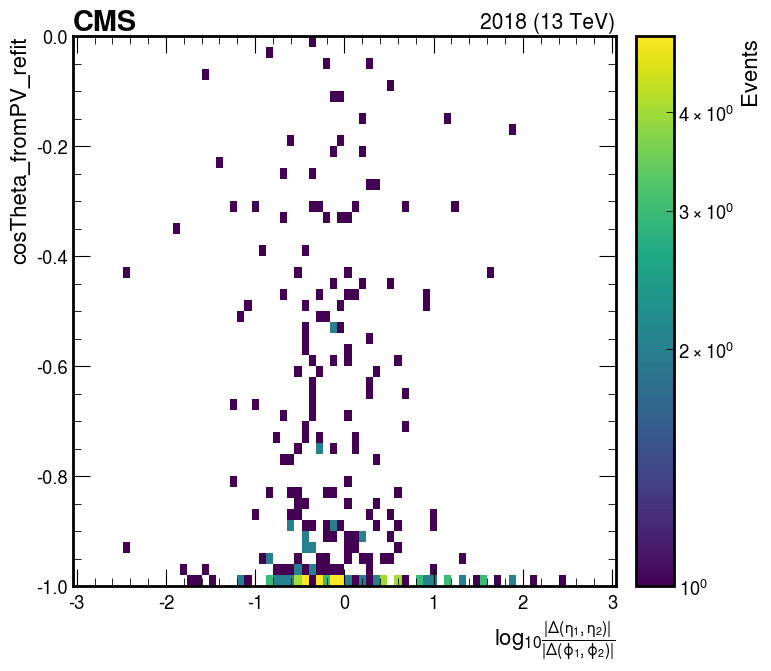

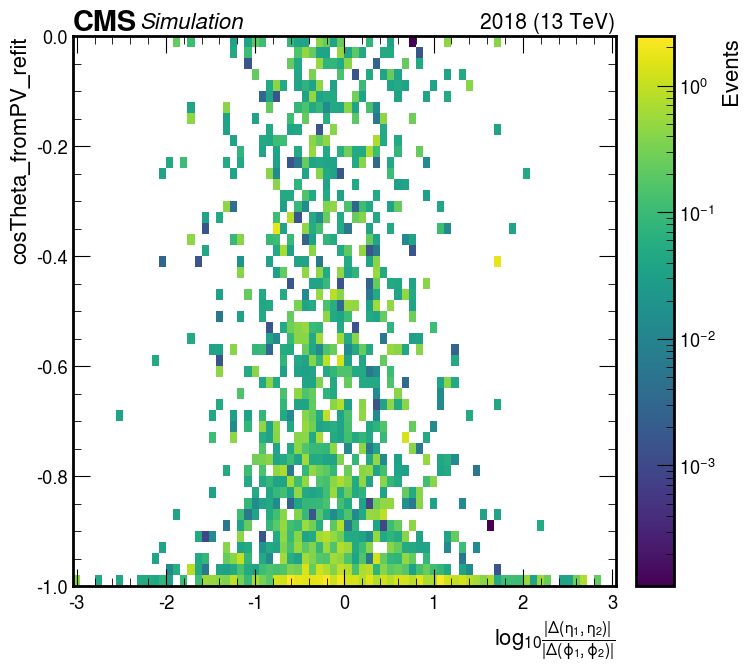

In [52]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut10'
variable = 'sel_vtx_log10dEtadPhi_vs_CosThetaColl_fromPV_refit'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 2j,
    'yrebin': 1j,
    'xlim': [-4,4],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': [-1.1,0],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': r"$log_{10}\frac{|\Delta(\eta_{1},\eta_{2})|}{|\Delta(\phi_{1},\phi_{2})|}$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_mindxy_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_mindxy_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_mindxy_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_mindxy_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_mindxy_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_mindxy_cut11.png


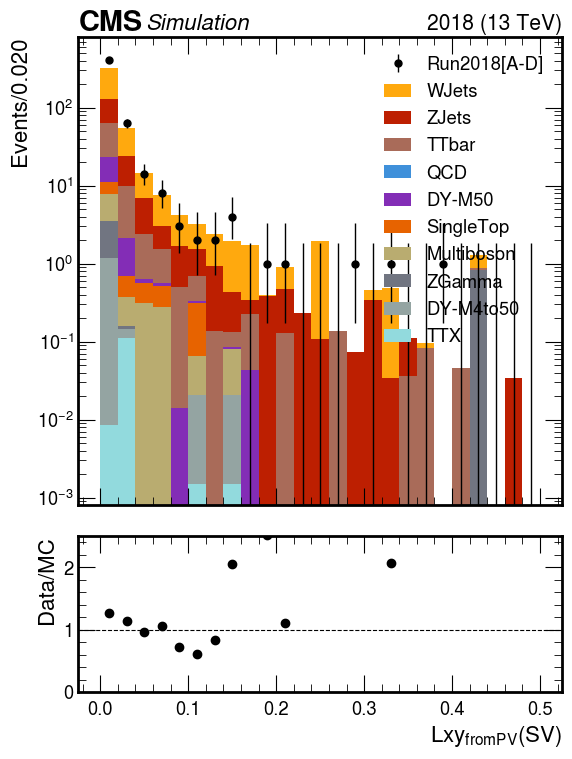

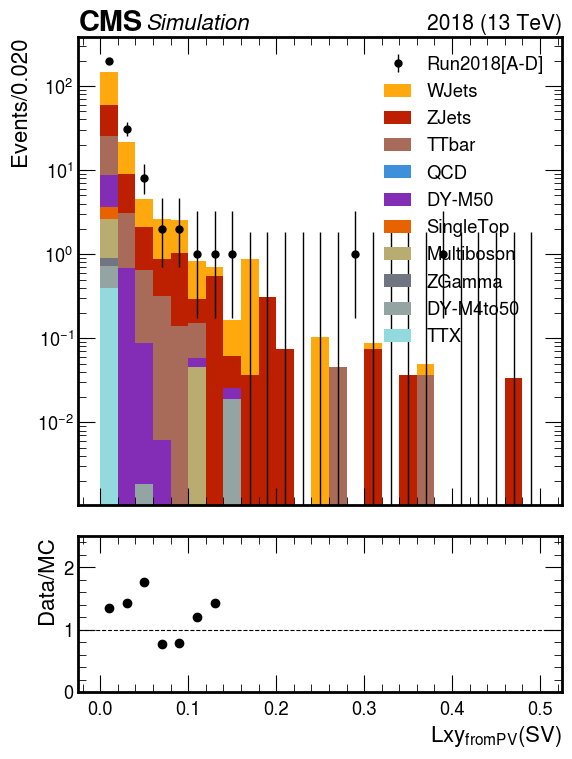

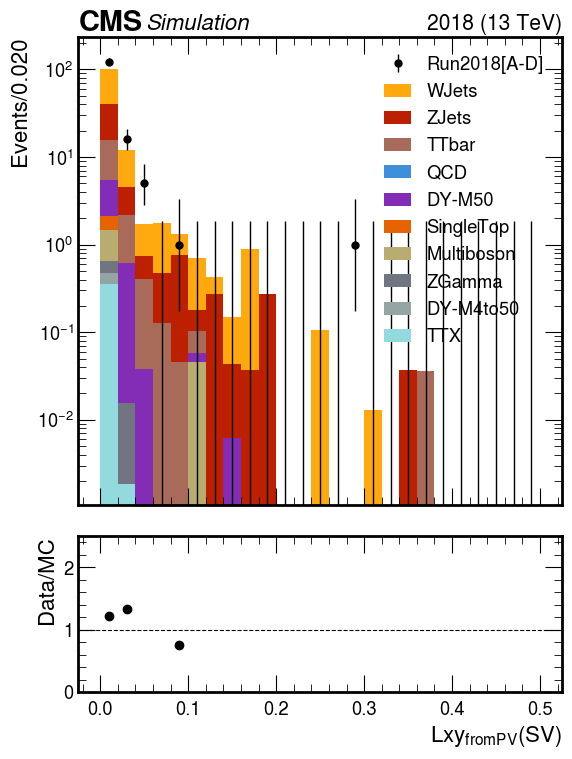

In [7]:
variable = 'sel_vtx_mindxy'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 2j,
    'xlim': [0,0.5],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$Lxy_{fromPV}(SV)$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_PV/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_PV/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_PV/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v9_m0p99_PV/data_bkg/sel_vtx//data_VR_sel_vtx_vxy1_cut10.png


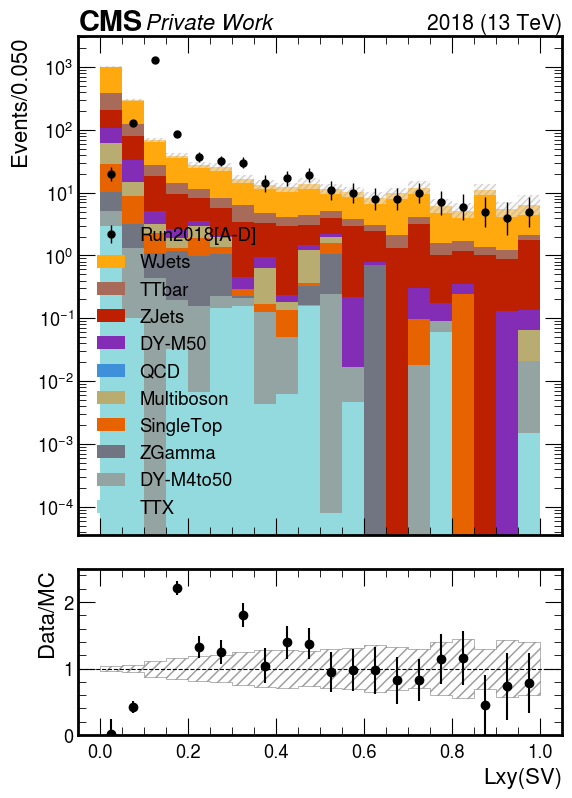

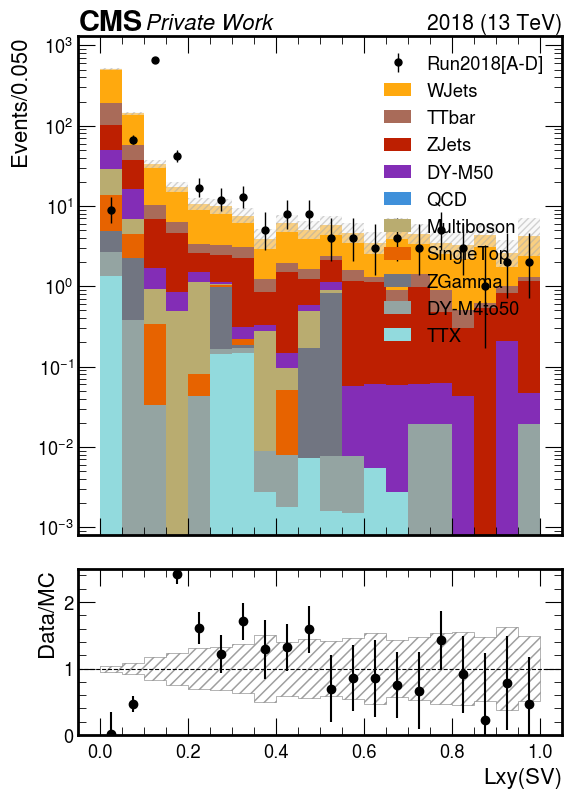

In [15]:
variable = 'sel_vtx_vxy1'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': 'Lxy(SV)',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV1_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV1_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV1_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV1_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV1_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV1_cut11.png


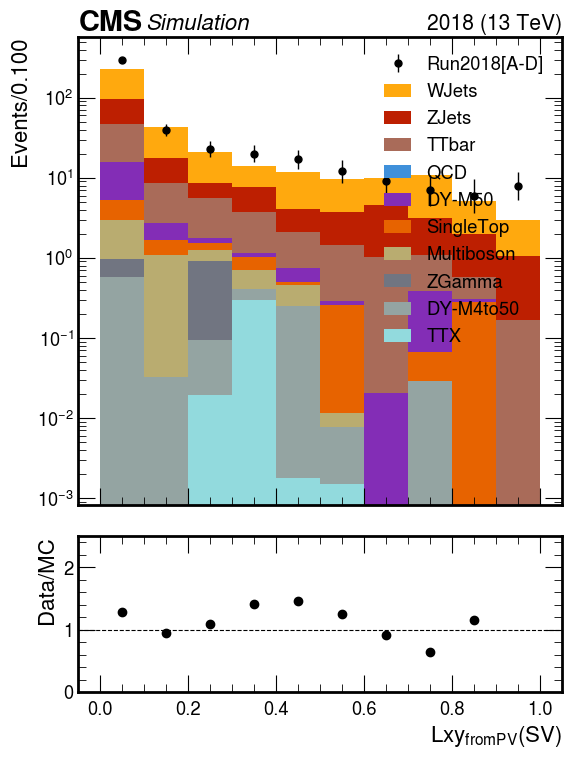

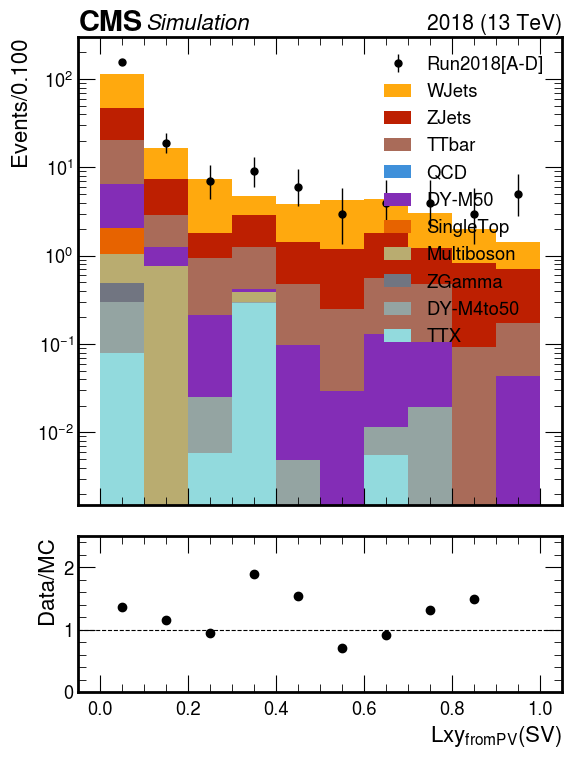

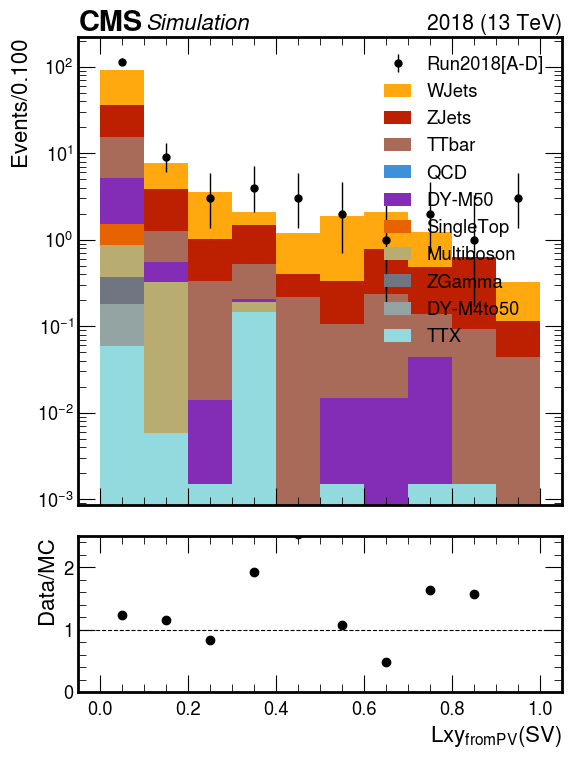

In [9]:
variable = 'sel_vtx_vxy_fromPV1'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$Lxy_{fromPV}(SV)$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV10_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV10_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV10_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV10_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV10_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vxy_fromPV10_cut11.png


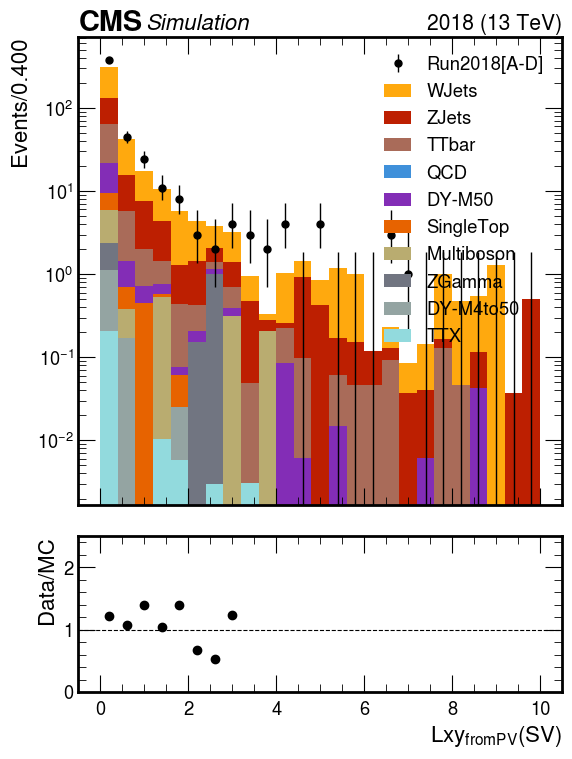

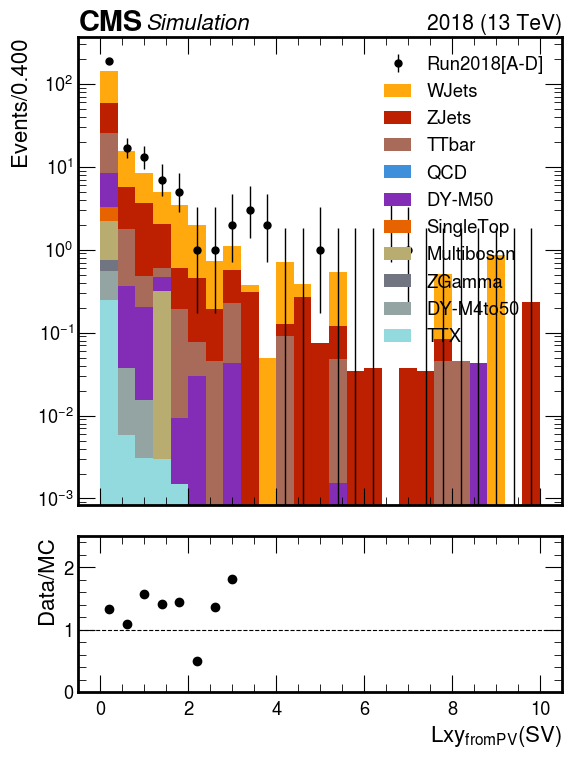

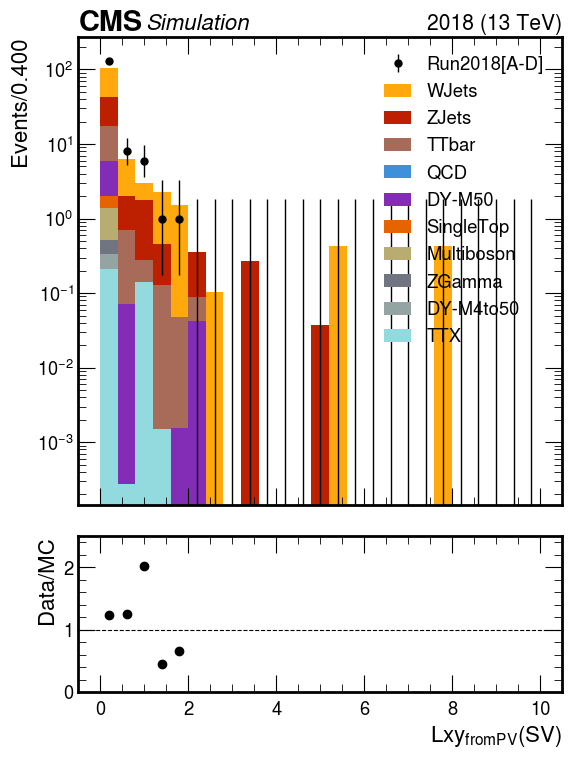

In [10]:
variable = 'sel_vtx_vxy_fromPV10'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 4j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r"$Lxy_{fromPV}(SV)$",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy1_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy1_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy1_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy1_cut10.png


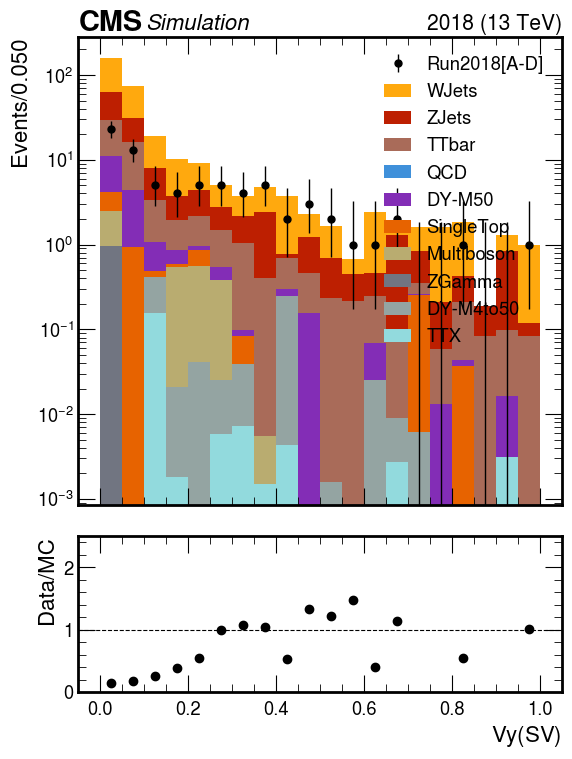

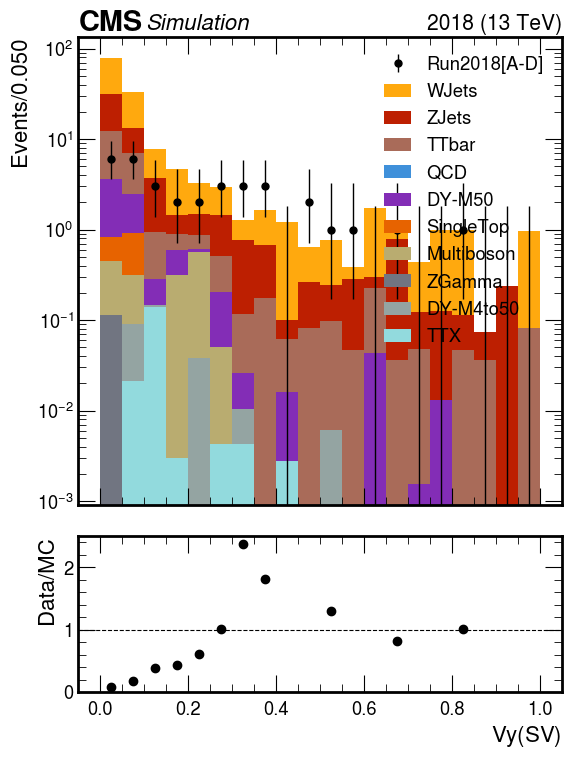

In [11]:
variable = 'sel_vtx_vy1'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r'$Vy(SV)$',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy_fromPV1_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy_fromPV1_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy_fromPV1_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy_fromPV1_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy_fromPV1_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_data.values()/hist_bkg.values()
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_vy_fromPV1_cut11.png


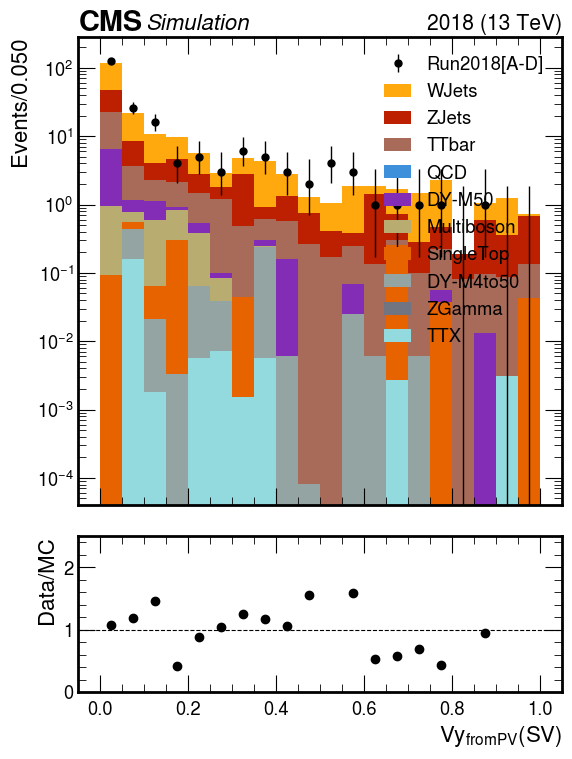

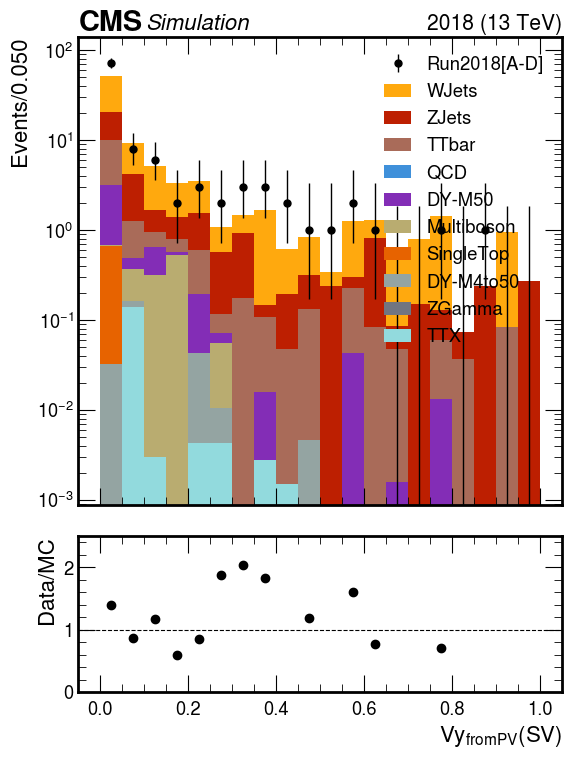

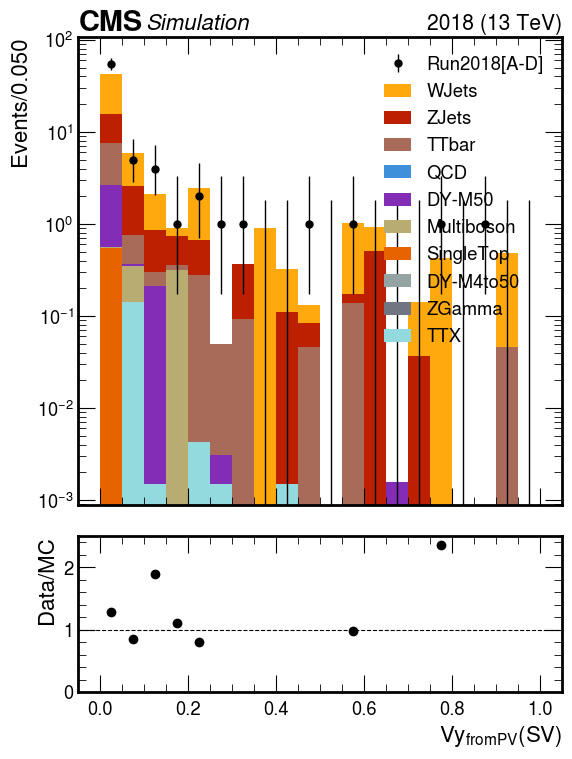

In [12]:
variable = 'sel_vtx_vy_fromPV1'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 5j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': r'$Vy_{fromPV}(SV)$',   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_cut10.png


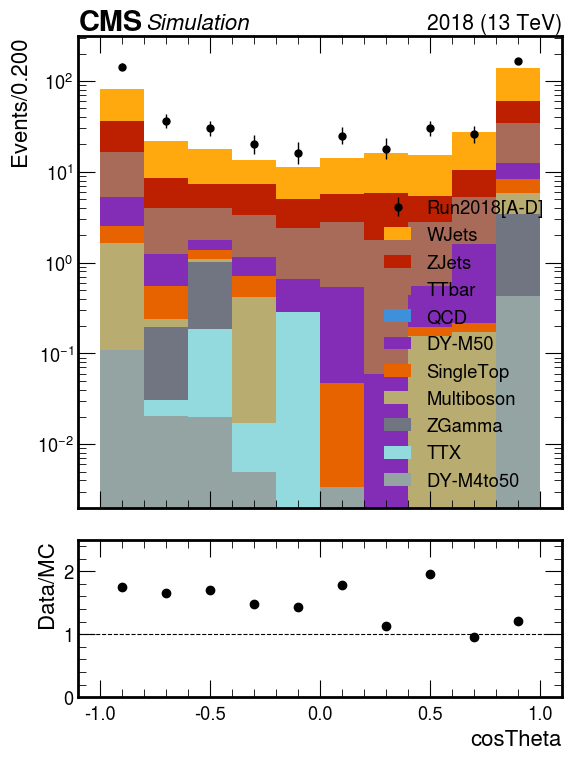

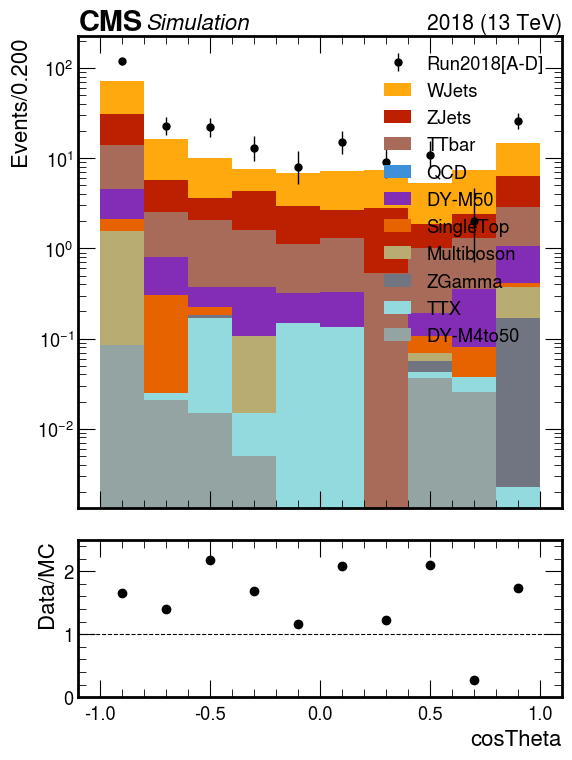

In [12]:
variable = 'sel_vtx_CosThetaColl'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_cut10.png


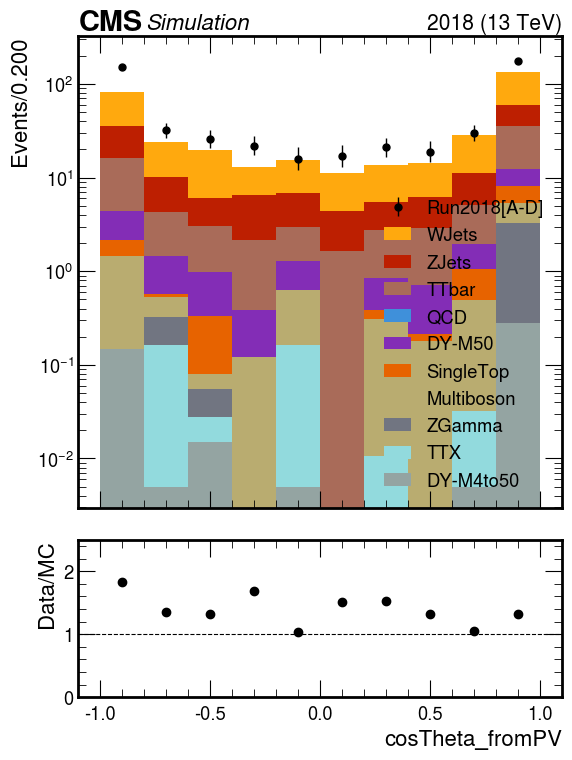

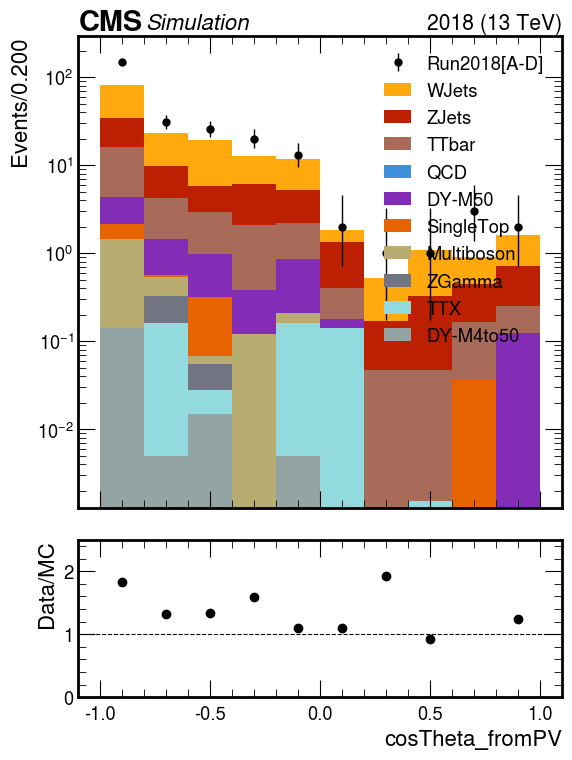

In [13]:
variable = 'sel_vtx_CosThetaColl_fromPV'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut10.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut11.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms_data/d3/kyungmip/CMSSW_10_6_26/src/iDMe/python_analysis/studies/Beamspot/../../analysisTools/plotTools.py:1420: RuntimeWarning: invalid value encountered in divide
  ratio = hist_data.values()/hist_bkg.values()


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_CosThetaColl_fromPV_refit_cut11.png


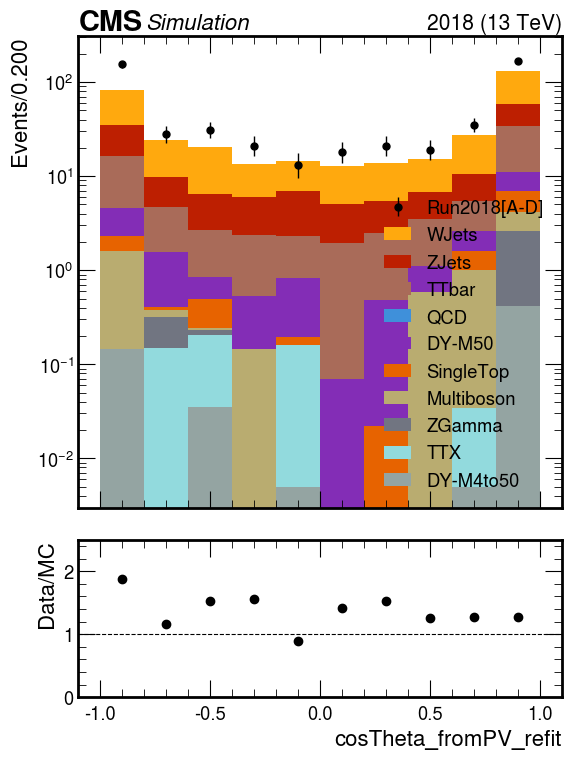

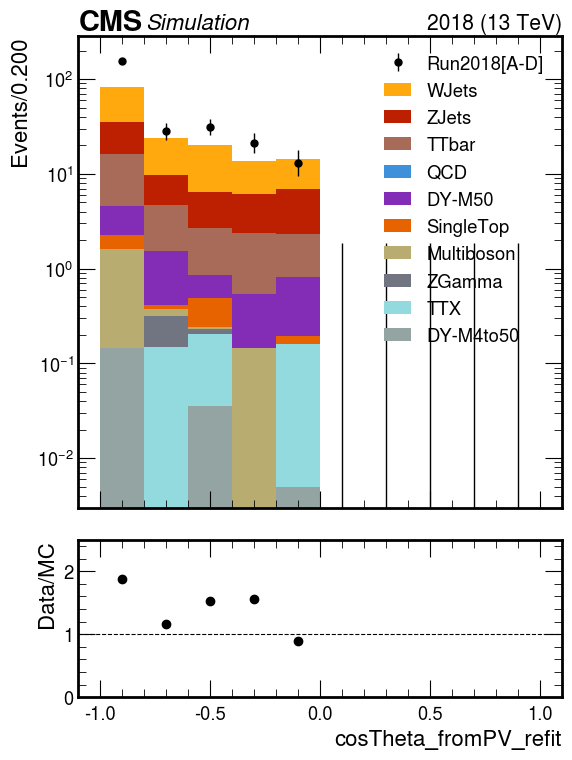

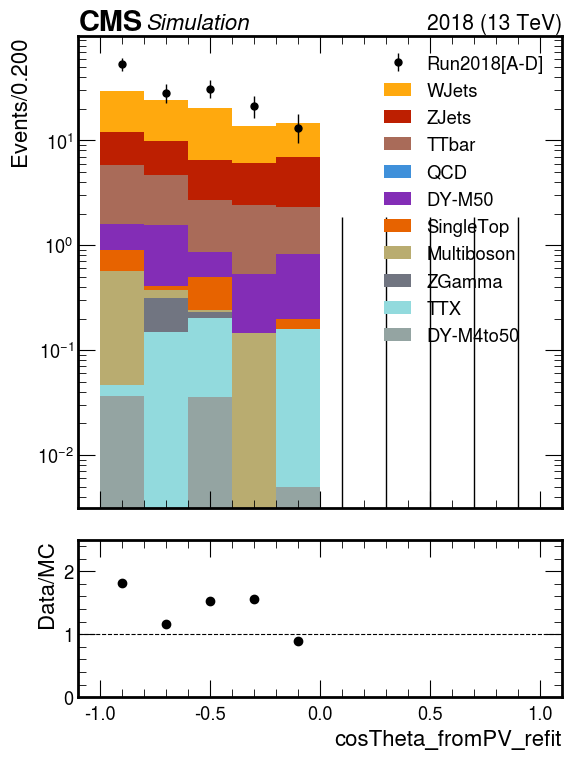

In [14]:
variable = 'sel_vtx_CosThetaColl_fromPV_refit'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 10j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut11'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_vs_CosThetaColl_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_vs_CosThetaColl_cut9.png


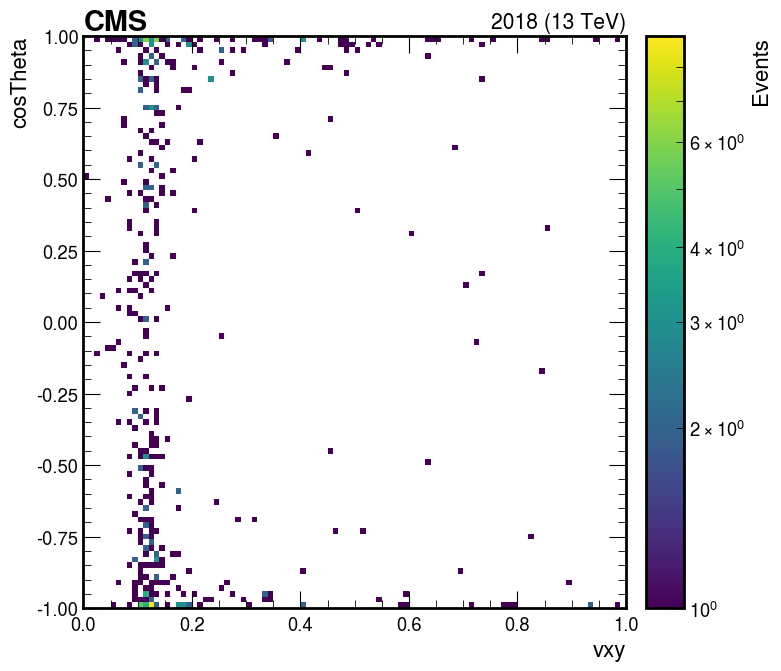

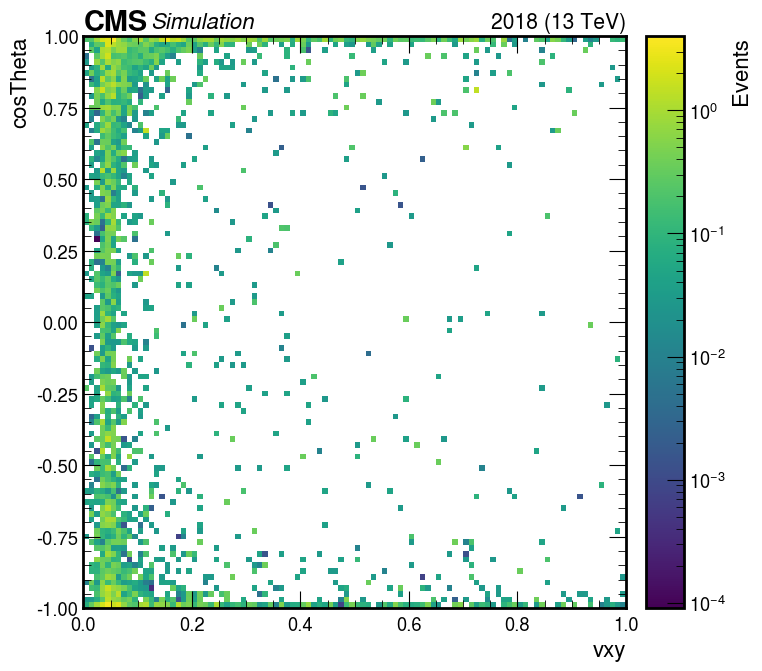

In [15]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_vxy1_vs_CosThetaColl'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy10_vs_CosThetaColl_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy10_vs_CosThetaColl_cut9.png


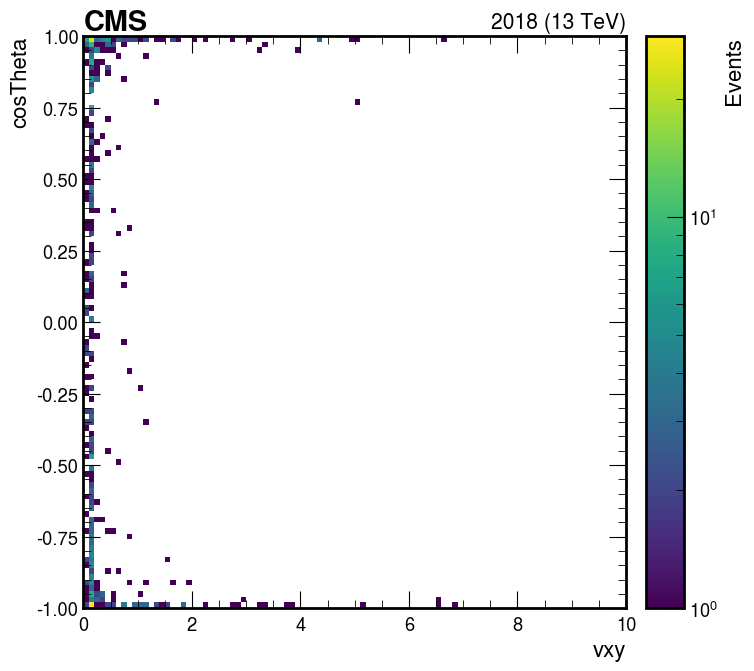

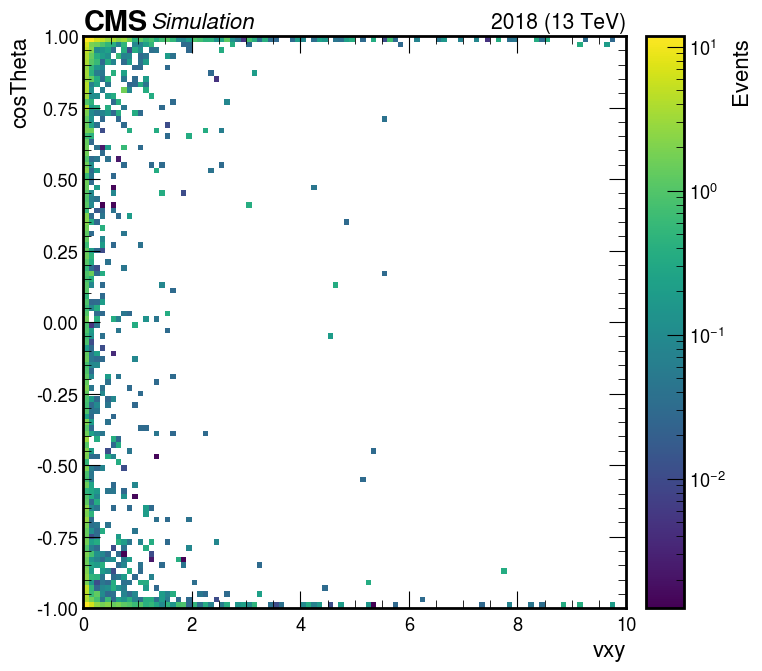

In [16]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_vxy10_vs_CosThetaColl'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_fromPV_vs_CosThetaColl_fromPV_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_fromPV_vs_CosThetaColl_fromPV_cut9.png


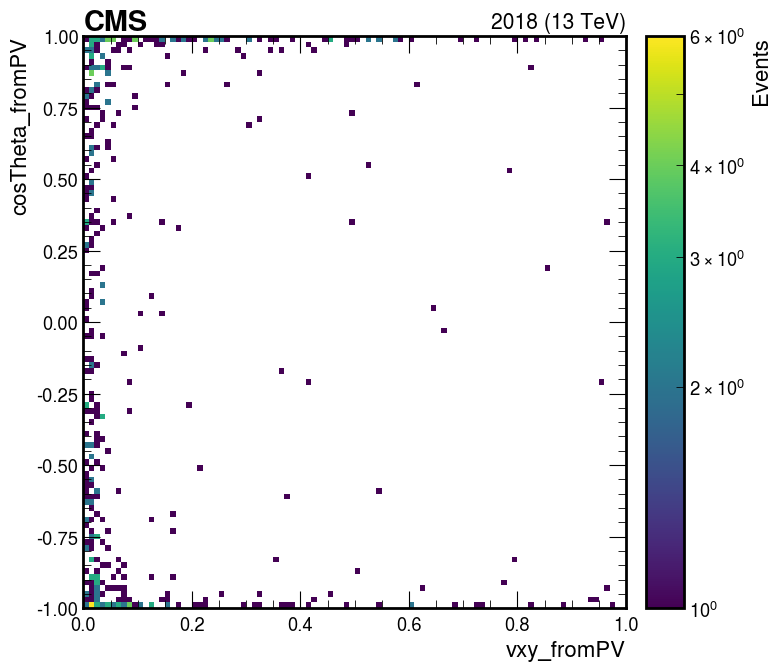

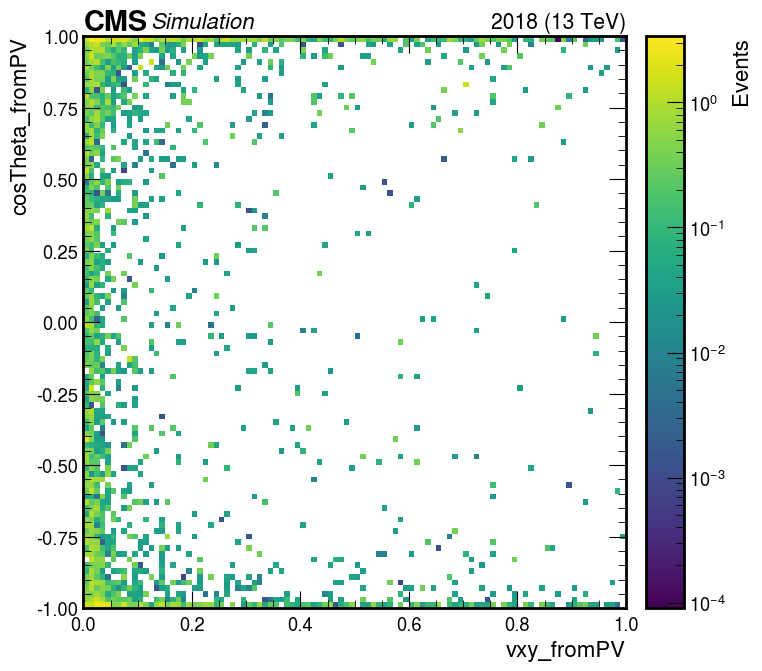

In [17]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_vxy1_fromPV_vs_CosThetaColl_fromPV'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy10_fromPV_vs_CosThetaColl_fromPV_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy10_fromPV_vs_CosThetaColl_fromPV_cut9.png


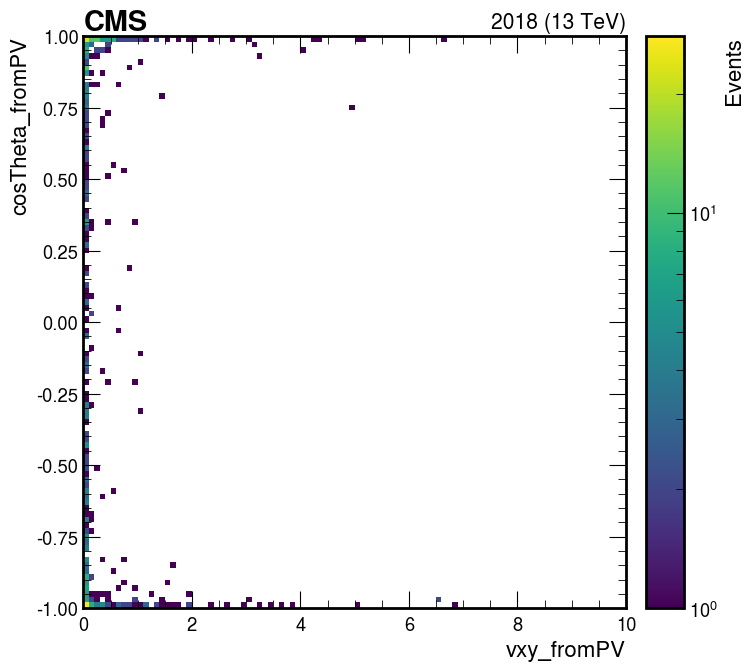

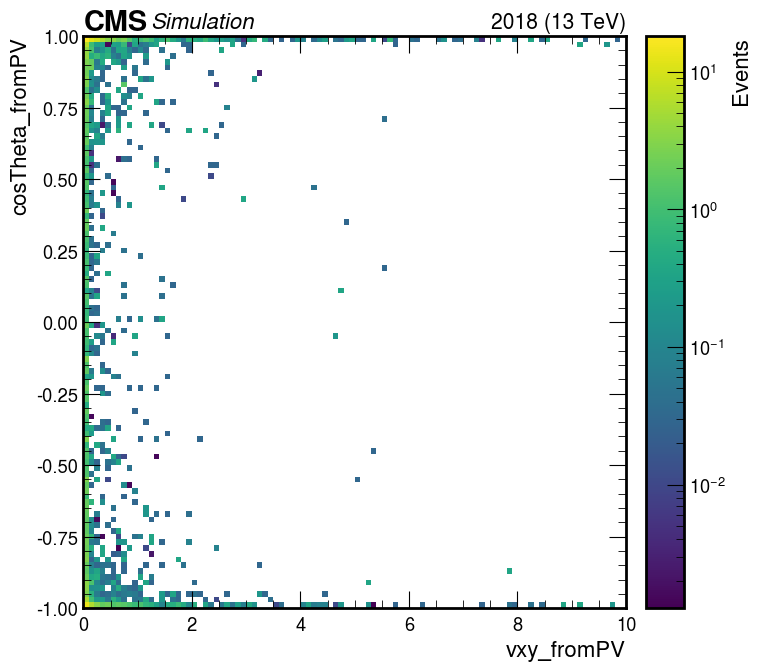

In [18]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_vxy10_fromPV_vs_CosThetaColl_fromPV'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_fromPV_vs_CosThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_fromPV_vs_CosThetaColl_fromPV_refit_cut9.png


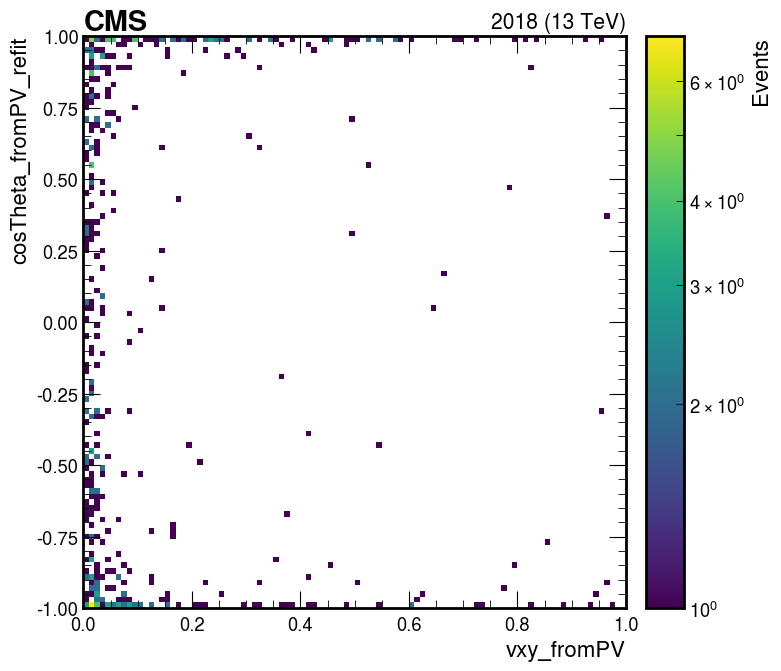

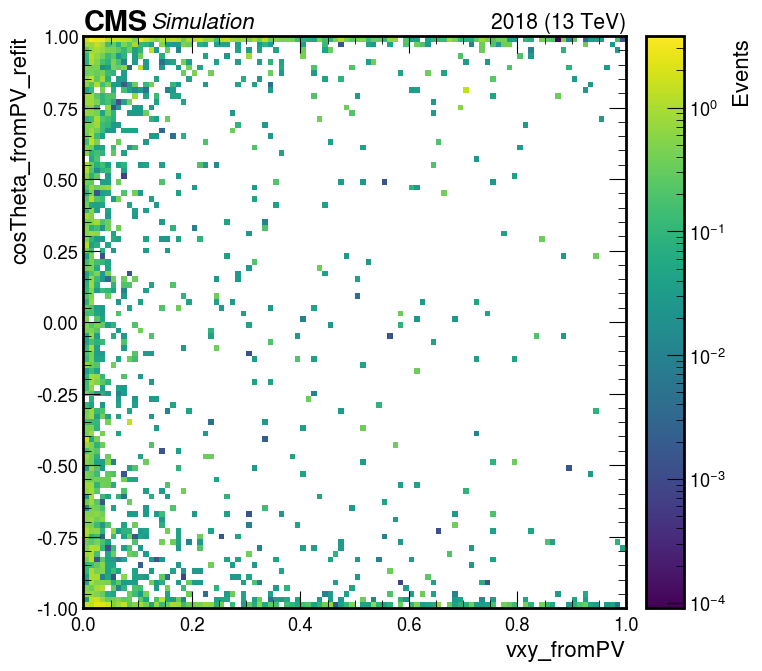

In [19]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_vxy1_fromPV_vs_CosThetaColl_fromPV_refit'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy10_fromPV_vs_CosThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy10_fromPV_vs_CosThetaColl_fromPV_refit_cut9.png


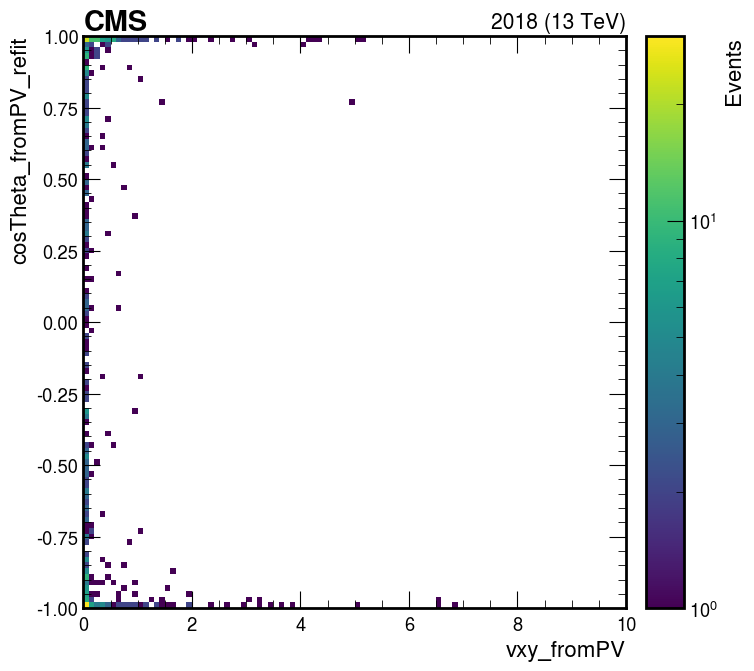

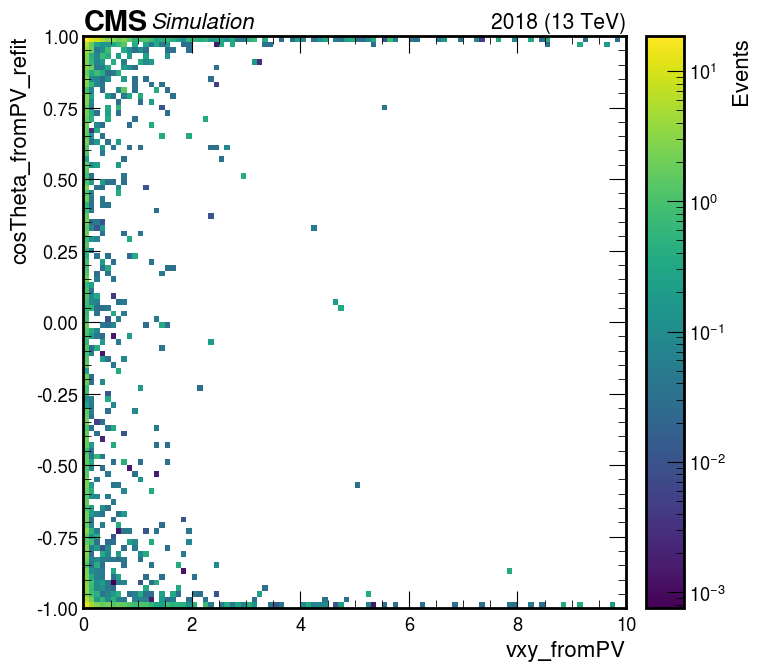

In [20]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_vxy10_fromPV_vs_CosThetaColl_fromPV_refit'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_CosThetaColl_vs_CosThetaColl_fromPV_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_CosThetaColl_vs_CosThetaColl_fromPV_cut9.png


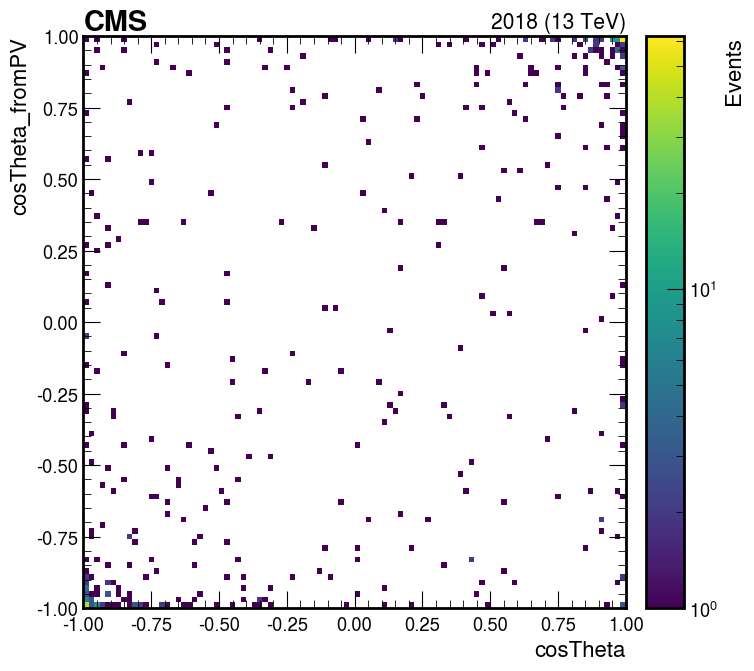

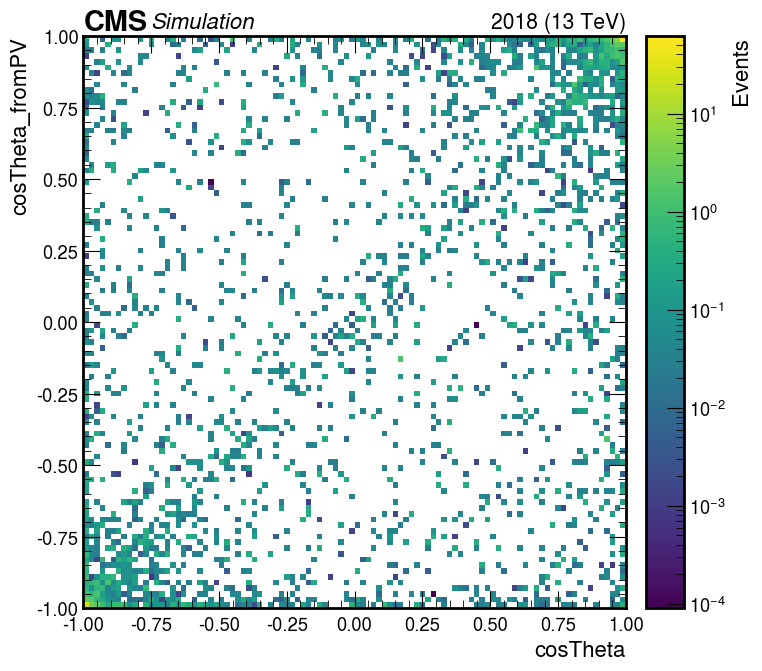

In [21]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'CosThetaColl_vs_CosThetaColl_fromPV'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_CosThetaColl_fromPV_vs_CosThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_CosThetaColl_fromPV_vs_CosThetaColl_fromPV_refit_cut9.png


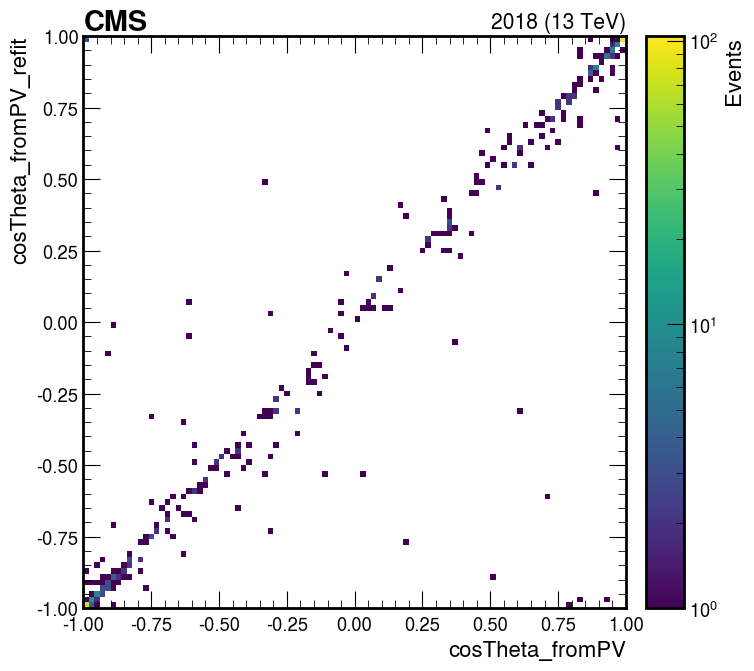

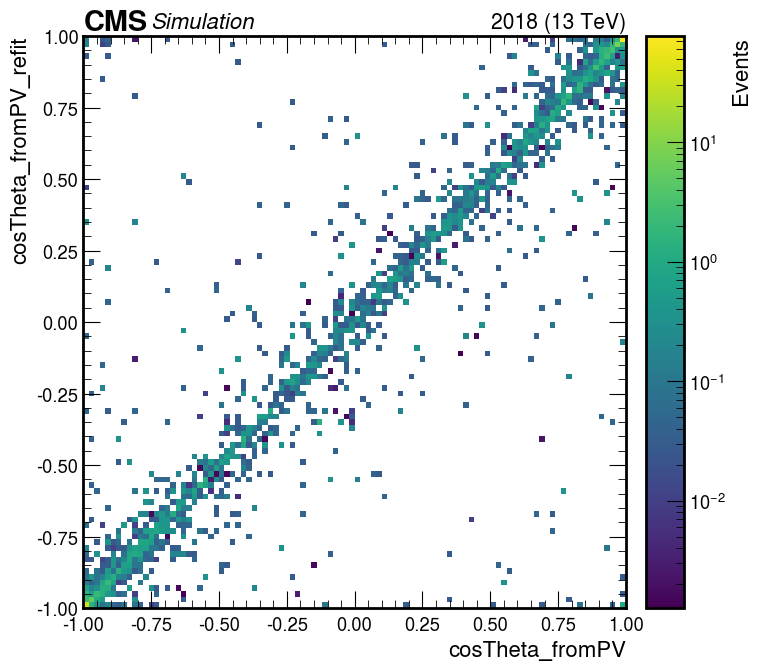

In [22]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'CosThetaColl_fromPV_vs_CosThetaColl_fromPV_refit'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_pt_ratio_cut9.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_pt_ratio_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_pt_ratio_cut10.png


/uscms/home/kyungmip/nobackup/miniconda3/envs/debug/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data_bkg/sel_vtx//data_VR_sel_vtx_pt_ratio_cut10.png


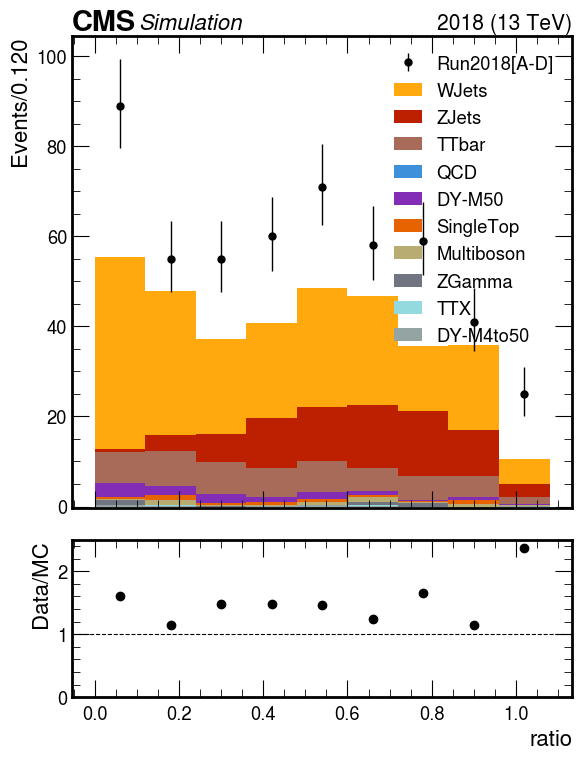

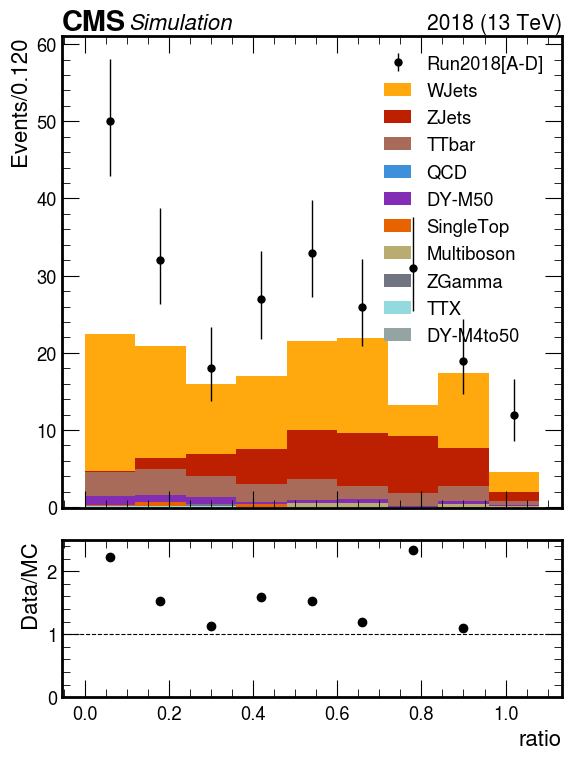

In [23]:
variable = 'sel_vtx_pt_ratio'
cut = 'cut9'

fig, ax = plt.subplots(figsize=(6,6))

# Plot settings
plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_dict = {
    'fig': fig,
    'ax': ax,
    'rebin': 6j,
    'xlim': [0,1],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': True, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data_bkg/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# ISR cut
cut = 'cut9'
#style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

# VR cut
cut = 'cut10'
style_dict['fig'], style_dict['ax'] = plt.subplots(figsize=(6,6))
plot_dict['cut'] = cut
style_dict['outName'] = f'data_VR_{variable}_{cut}.png'
ptools.plot_data_MC_ratio(data_histo, bkg_histo, plot_dict, style_dict)

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_pt_ratio_vs_CosThetaColl_fromPV_refit_cut9.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_pt_ratio_vs_CosThetaColl_fromPV_refit_cut9.png


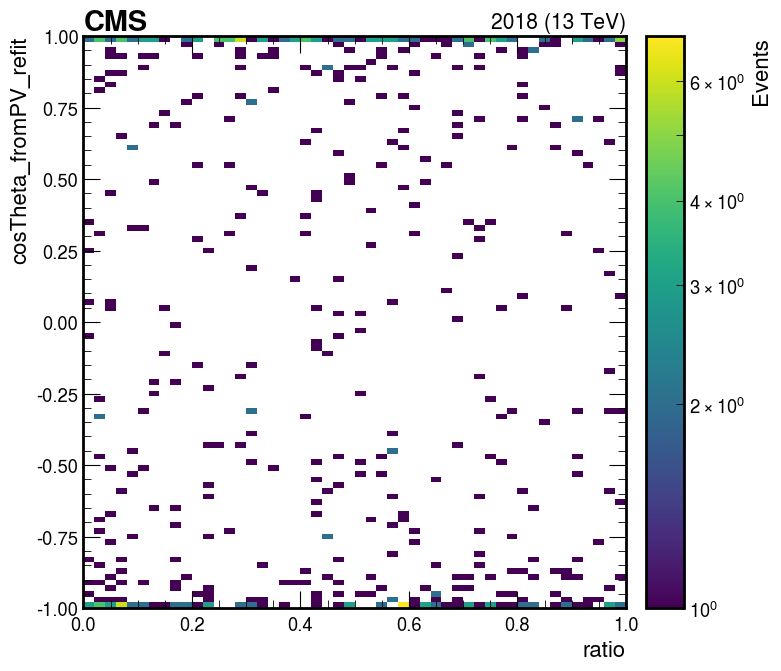

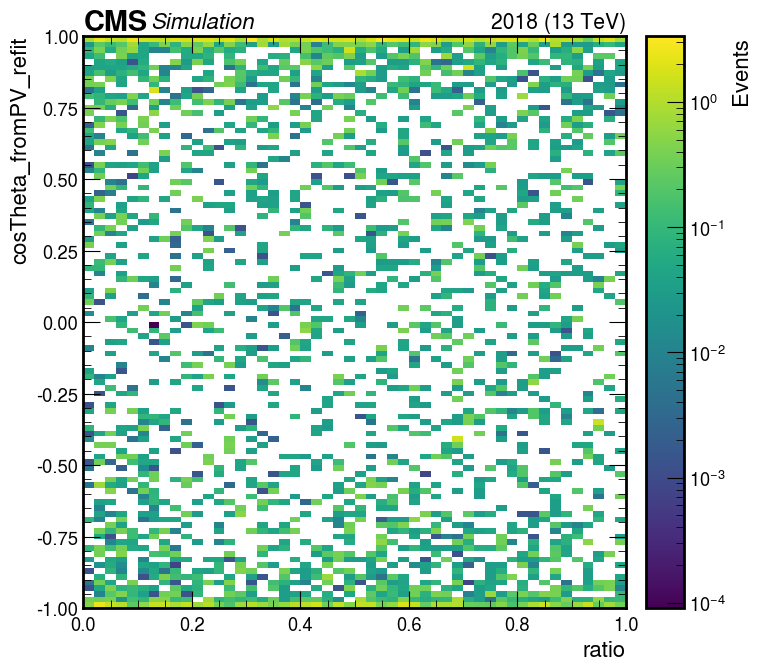

In [24]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut9'
variable = 'sel_vtx_pt_ratio_vs_CosThetaColl_fromPV_refit'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': [0,1],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_vs_CosThetaColl_cut4.png
Saved: ./plots/VR_Collinear_fromPV_refit_HEMvetos_good_vtx_v8_m0p95/data/sel_vtx//data_VR_sel_vtx_vxy1_vs_CosThetaColl_cut4.png


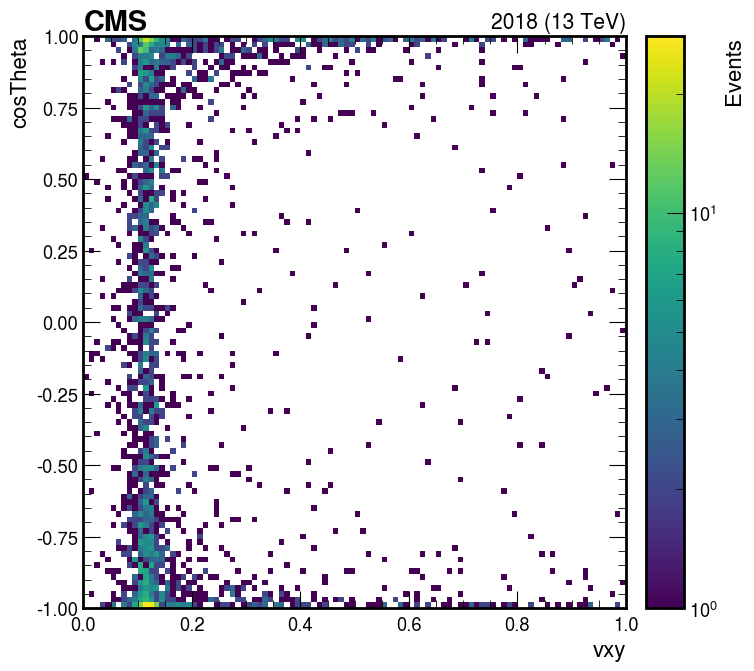

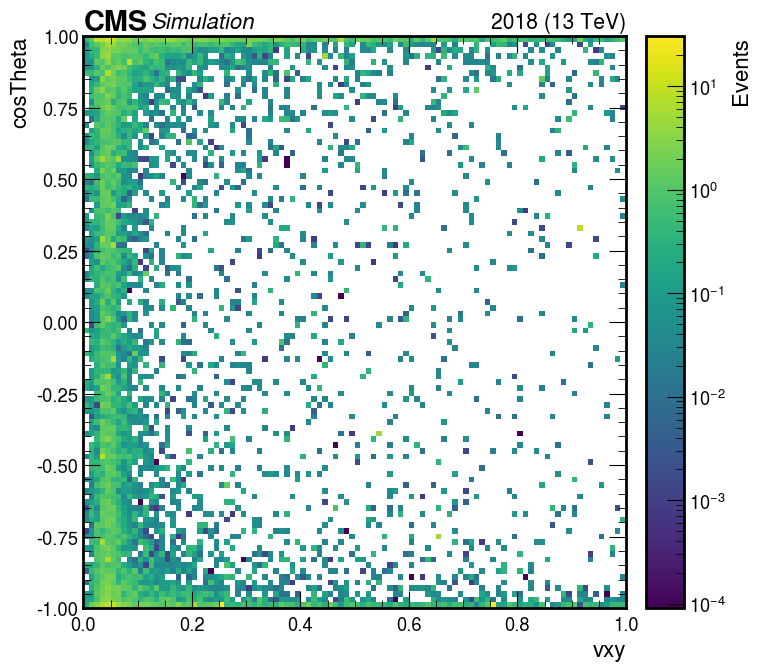

In [25]:
# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

cut = 'cut4'
variable = 'sel_vtx_vxy1_vs_CosThetaColl'

plot_dict = {
    'variable': variable,
    'cut': cut,
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': f'./plots/{suffix}/data/sel_vtx/',
    'outName': f'data_VR_{variable}_{cut}.png'
}

# Data
ptools.plot_data_2D(data_histo, plot_dict, style_2d_dict)


# Bkg

style_2d_dict['fig'], style_2d_dict['ax'] = plt.subplots(figsize=(7,7))
ptools.plot_bkg_2D(bkg_histo, plot_dict, style_2d_dict, processes = 'all')

NameError: name 'sig_histo' is not defined

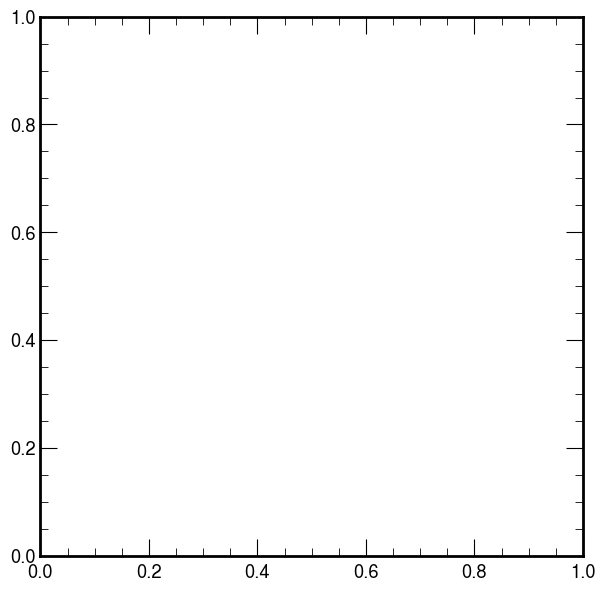

In [26]:
m1 = 30
delta = 0.1
ctau = 100

# Plot settings
fig, ax = plt.subplots(figsize=(7,7))

plot_dict = {
    'variable': 'sel_vtx_vx_vs_vy',
    'cut': 'cut9',
    'year': 2018
}

style_2d_dict = {
    'fig': fig,
    'ax': ax,
    'xrebin': 1j,
    'yrebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]  
    'ylim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doLogz': True,
    'xlabel': r"$v_{x}$ [cm]",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': r"$v_{y}$ [cm]",   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'zlabel': 'Events',   
    'flow': None,     # overflow
    'doSave': True,
    'outDir': './plots/',
    'outName': f'signal_cut7_vx_vs_vy_m1_{m1}_delta_{delta}_ctau_{ctau}.png'
}

ptools.plot_signal_2D(sig_histo, m1, delta, ctau, plot_dict, style_2d_dict)